In [1]:
#%matplotlib inline
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib.patches import Rectangle
from matplotlib.patches import Circle
from matplotlib.patches import Ellipse
from matplotlib.cm import ScalarMappable
from matplotlib.patheffects import withStroke
import matplotlib.ticker as ticker

import math
import csv
from math import pi
import pandas as pd
import glob
#import match 

import seaborn as sns
import statistics as stat

from scipy.stats import kde #for the plot very soft
from scipy.stats import gaussian_kde
from sklearn.neighbors import KernelDensity

from astropy.io import fits
from astropy.table import Table, unique, join, vstack, QTable, hstack
from astropy.visualization import astropy_mpl_style
from astropy.visualization import simple_norm
from astropy.visualization import make_lupton_rgb
from astropy.visualization import SqrtStretch
from astropy.visualization import ZScaleInterval

from astropy.nddata import Cutout2D
from astropy import units as u
from astropy import constants as Cons
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord, Galactic, Angle

import nilo.loaders as ld

In [2]:
def galactic(ra,dec):
    c = SkyCoord(ra*u.degree, dec*u.degree)
    l = c.galactic.l*u.degree
    b = c.galactic.b*u.degree
    return l, b

def equatorial(l,b):
    c = SkyCoord(l*u.degree, b*u.degree, frame='galactic')
    ra = c.fk5.ra
    dec = c.fk5.dec
    return ra, dec    

In [3]:
def angle_coordinates(ra, dec):
    RA = []
    DEC = []
    ra_h = Angle(ra, u.deg).hms[0][i]
    ra_m = Angle(ra, u.deg).hms[1][i]
    ra_s = Angle(ra, u.deg).hms[2][i]
    RA.append(str(str(int(ra_h))+' '+str(int(ra_m))+' '+str(round(ra_s,4))))
    dec_d = Angle(dec, u.deg).dms[0][i]
    dec_m = abs(Angle(dec, u.deg).dms[1][i])
    dec_s = abs(Angle(dec, u.deg).dms[2][i])
    DEC.append(str(str(int(dec_d))+' '+str(int(dec_m))+' '+str(round(dec_s,4))))
    return RA, DEC

In [4]:
zang = Table.read('zang_cat.csv', format='csv')
print('Zang+21 completo: ',+len(zang))
print('Galaxias en Zang+21 completo: ',+len(zang[zang['Class_x']=='GALAXY']))

## Hacer el corte entre 0<l<10
zang['l_LONG'], zang['b_LAT'] = galactic(zang['sc_ra'],zang['sc_dec'])

#disc_all = zang[zang['GAL_LONG']>250]#
disc_all = zang[zang['l_LONG']>295]#
disc_all = disc_all[disc_all['l_LONG']<350]
disc_all = disc_all[disc_all['b_LAT']<2]
disc_all = disc_all[disc_all['b_LAT']>-2]
print('Total objetos en el disco del VVV: ',+len(disc_all))

#disc_all.write('disc_all.csv', format='csv', overwrite=True)

disc = disc_all[disc_all['Class_x']=='GALAXY']
disc_QSO = disc_all[disc_all['Class_x']=='QSO']
disc_S = disc_all[disc_all['Class_x']=='STAR']

#disc.write('disc_gal.csv', format='csv')
#disc_QSO.write('disc_QSO.csv', format='csv')
#disc_S.write('disc_S.csv', format='csv')

print()
print('Total de galaxias en el disco del VVV: ',+len(disc))
print('Total de estrellas en el disco del VVV: ',+len(disc_S))
print('Total de QSO en el disco del VVV: ',+len(disc_QSO))
disc.write('zang_vvv_galaxies.csv', format='csv')
disc.write('zang_vvv_galaxies.cat', format='ascii')


Zang+21 completo:  550124
Galaxias en Zang+21 completo:  191528
Total objetos en el disco del VVV:  15423

Total de galaxias en el disco del VVV:  9726
Total de estrellas en el disco del VVV:  1666
Total de QSO en el disco del VVV:  4031


In [5]:
df_q = disc_QSO.to_pandas()
df_s = disc_S.to_pandas()
df_g = disc.to_pandas()

df_disc = disc_all.to_pandas()

In [6]:
print('GALX: ',+len(zang[zang['Class_x']=='GALAXY']))
print('QSOs: ',+len(zang[zang['Class_x']=='QSO']))
print('STAR: ',+len(zang[zang['Class_x']=='STAR']))

print()
#### estadistica de todo zang?
z_ = zang.to_pandas()

print('Total de datos con WISE: ',+ len(z_[~z_['Pxi'].isna()]))
print('Total de datos con SDSS: ',+ len(z_[~z_['Pxo'].isna()]))
print('Total de datos con WISE+SDSS: ',+ len(z_[~z_['Pxio'].isna()]))
# Zhang en el disco
print('En el disco:')
print('Total de disc con WISE: ',+ len(df_disc[~df_disc['Pxi'].isna()]))
print('Total de disc con SDSS: ',+ len(df_disc[~df_disc['Pxo'].isna()]))
print('Total de disc con WISE+SDSS: ',+ len(df_disc[~df_disc['Pxio'].isna()]))

GALX:  191528
QSOs:  314640
STAR:  43956

Total de datos con WISE:  317845
Total de datos con SDSS:  138452
Total de datos con WISE+SDSS:  115592
En el disco:
Total de disc con WISE:  4957
Total de disc con SDSS:  0
Total de disc con WISE+SDSS:  0


In [7]:
##rad = Table([radi], names=['size'])
#ext = Table([disc_all['sc_ra'], disc_all['sc_dec']])
#radi = np.ones(len(ext))*0.1
#ext.add_column(radi)
#ext.rename_column('col2', 'size')
##ext.write('disc_all_forEXT.cat', format='ascii')

extin = Table.read('ext_disc_all.tbl', format='ascii')

gal_zang = Table.read('zang_x_NIRGC_1.3.csv', format='csv')
gal = Table.read('zang_x_NIRGC_gals.csv', format='csv')

# Cruce con NIRGC y Zhang

### - Cruce con radio de 1.3arcsec y trabajar con columnas con valores NaN

In [8]:
all_dat = Table.read('zhang_disc_gal_cross_VVV_1.3arcsec.csv', format='csv')
all_dat['l_LONG'], all_dat['b_LAT'] = galactic(all_dat['RA_SEARCH'],all_dat['DEC_SEARCH'])
df = all_dat.to_pandas()
print(f'total datos con 1.3arcsec de separacion : {len(df)}')
dfg = df.drop_duplicates(subset='ID_SEARCH')
print(f'Total de objetos únicos en "dat": {len(dfg)}')
nan = dfg[dfg['ALPHA_J2000'].isna()]
t_nan = Table.from_pandas(nan)
#t_nan.write('nan_rows_1.3.csv', format='csv', overwrite=True)
print('Total objetos "NaN": ',+ len(nan))
no_nan = dfg[~dfg['ALPHA_J2000'].isna()]
t_no_nan = Table.from_pandas(no_nan)
print('Total objetos sin valores "NaN": ',+ len(no_nan))
print()
star = dfg[dfg['EXTENDED']==0]
extended = dfg[dfg['EXTENDED']==1]

print('Cantidad de fuentes puntuales: ',+len(star))
print('Cantidad de fuentes extendidas: ',+len(extended)-4)

#dfg['l_LONG'], dfg['b_LAT'] = galactic(dfg['RA_SEARCH'],dfg['DEC_SEARCH'])

total datos con 1.3arcsec de separacion : 10093
Total de objetos únicos en "dat": 9726
Total objetos "NaN":  6497
Total objetos sin valores "NaN":  3229

Cantidad de fuentes puntuales:  3183
Cantidad de fuentes extendidas:  42


In [9]:
print(dfg.columns)
print('\n "FLUX_RADIUS" corresponde a f20,f50 y f80, respectivamente')

dfg_ = Table.from_pandas(no_nan)
dfg_['l_LONG'], dfg_['b_LAT'] = galactic(dfg_['RA_SEARCH'],dfg_['DEC_SEARCH'])
dfg_e = dfg_[dfg_['EXTENDED']==1]
len(dfg_e)

dfg_e_coord = Table([dfg_e['ALPHA_J2000'], dfg_e['DELTA_J2000']])
#dfg_e_coord.write('extended_buenas.cat', format='ascii', overwrite=True)

Index(['ID_SEARCH', 'RA_SEARCH', 'DEC_SEARCH', 'DISTANCE', 'CATALOGUE', 'TILE',
       'ID', 'ALPHA_J2000', 'DELTA_J2000', 'MAG_PSF', 'MAGERR_PSF', 'MAG_AUTO',
       'MAGERR_AUTO', 'MAG_APER', 'MAGERR_APER', 'MAG_MODEL', 'MAGERR_MODEL',
       'SPREAD_MODEL', 'AMODEL_IMAGE', 'BMODEL_IMAGE', 'ELONGATION',
       'ELLIPTICITY', 'A_IMAGE', 'B_IMAGE', 'KRON_RADIUS', 'FLUX_RADIUS',
       'SPHEROID_SERSICN', 'MU_MAX', 'CLASS_STAR', 'MAG_APER_H', 'MAG_PSF_H',
       'MAG_APER_J', 'MAG_PSF_J', 'EXTENDED', 'A_v', 'A_Ks', 'l_LONG',
       'b_LAT'],
      dtype='object')

 "FLUX_RADIUS" corresponde a f20,f50 y f80, respectivamente


In [10]:
nirgc = Table.read('VVV_NIRGC.dat', format='ascii')
gal_zang = Table.read('zang_x_NIRGC_1.3.csv', format='csv')

In [11]:
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.collections import PatchCollection

In [12]:
dust, interpolator = ld.load_dust(return_interpolator=True)

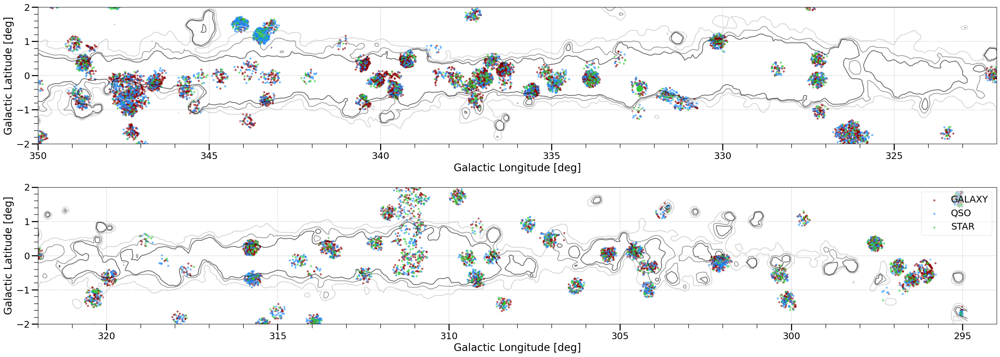

In [13]:
fig = plt.figure(figsize=(27,10))
ax = fig.add_subplot(211,aspect='equal')
ax.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg')
ax.scatter(disc['l_LONG'], disc['b_LAT'], s=9, c='darkred', label='GALAXY', alpha=0.55)
ax.scatter(disc_QSO['l_LONG'], disc_QSO['b_LAT'], s=9, c='dodgerblue', label='QSO', alpha=0.55)
ax.scatter(disc_S['l_LONG'], disc_S['b_LAT'], s=9, c='limegreen', label='STAR', alpha=0.55)

ax.set_xlabel('Galactic Longitude [deg]', fontsize=20)
ax.set_ylabel('Galactic Latitude [deg]', fontsize=20)
plt.grid(True, alpha=0.5)
ax.set_xlim(350,322)
ax.set_ylim(-2,2)

ax.minorticks_on()
ax.tick_params(which='major', size=12, labelsize=18, width=2)
ax.tick_params(which='minor', size=8, width=1)


ax = fig.add_subplot(212,aspect='equal')
ax.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg')
ax.scatter(disc['l_LONG'], disc['b_LAT'], s=9, c='darkred', label='GALAXY', alpha=0.55)
ax.scatter(disc_QSO['l_LONG'], disc_QSO['b_LAT'], s=9, c='dodgerblue', label='QSO', alpha=0.55)
ax.scatter(disc_S['l_LONG'], disc_S['b_LAT'], s=9, c='limegreen', label='STAR', alpha=0.55)

ax.set_xlabel('Galactic Longitude [deg]', fontsize=20)
ax.set_ylabel('Galactic Latitude [deg]', fontsize=20)
plt.grid(True, alpha=0.5)
ax.set_xlim(322,294)
ax.set_ylim(-2,2)

ax.minorticks_on()
ax.tick_params(which='major', size=12, labelsize=18, width=2)
ax.tick_params(which='minor', size=8, width=1)

#
plt.legend(loc=1, framealpha=0.5, prop={"size":18})

plt.tight_layout()
#plt.savefig('map_zang.jpg')

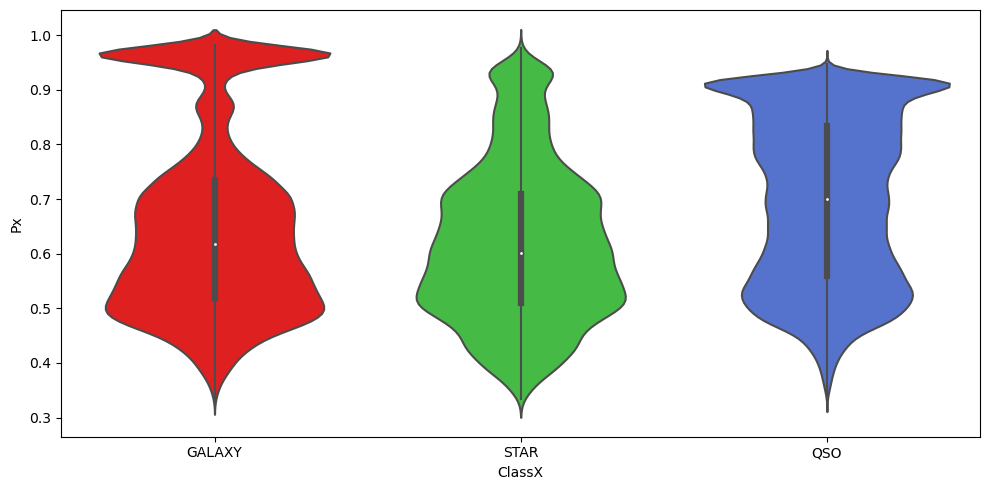

In [14]:
z_.rename(columns = {'Class_x':'ClassX'}, inplace = True)

# creating a dictionary with one specific color per group:
my_pal = {"GALAXY": "r", "QSO": "royalblue", "STAR": "limegreen"}

fig = plt.subplots(1,1, figsize=(10,5))
sns.violinplot(x ="ClassX", y ="Px", data = z_, palette=my_pal)

plt.tight_layout()
#plt.savefig('z21_ALLviolin_plot.jpg')

## Sin_contraparte revised

In [15]:
### RANDOM OBJECTS ###
T = Table.read('non_dr2_1.3.cat', format='ascii')
print('Cantidad de objetos sin contraparte por estudiar: ',+len(T))

Cantidad de objetos sin contraparte por estudiar:  5765


In [16]:
new_nan = Table.read('sin_contraparte_revised.csv', format='csv')


spikes = new_nan[new_nan['Spikes']==1]
saturated = new_nan[new_nan['Saturated_star']==1]
crowded = new_nan[new_nan['Normal_crowded']==1]
group = new_nan[new_nan['Stellar_group']==1]
PUVSFR = new_nan[new_nan['PUVSFR']==1]
PUVS = new_nan[new_nan['PUVS']==1]
assoc = new_nan[new_nan['Massive_star_assoc']==1]
rotated = new_nan[new_nan['Rotated']==1]
SFR = new_nan[new_nan['normal_SFR']==1]
cstar = new_nan[new_nan['Star']==1]
empty = new_nan[new_nan['Empty_region']==1]
special = new_nan[new_nan['Special_case']==1]

spikes_empty = spikes[spikes['Empty_region']==1]
saturated_empty = saturated[saturated['Empty_region']==1]


print('Total sources with Spikes: ',len(spikes))
print('Total sources with Saturated Star: ',len(saturated))
print('Total sources with normal crowdded region: ',len(crowded))
print('Total sources with Stellar group: ',len(group))
print('Total sources with PUVSFR: ',len(PUVSFR))
print('Total sources with PUVS: ',len(PUVS))
print('Total sources with Massive star association: ',len(assoc))
print('Total sources with Rotated frames: ',len(rotated))
print('Total sources with Normal SFR: ',len(SFR))
print('Total sources with a central star: ',len(cstar))
print('Total sources with empty central region: ',len(empty))
print('Total sources with special cases: ',len(special))
print()
print('Total sources with Spikes+empty region: ',len(spikes_empty))
print('Total sources with Saturated+empty region: ',len(saturated_empty))

Total sources with Spikes:  321
Total sources with Saturated Star:  728
Total sources with normal crowdded region:  3486
Total sources with Stellar group:  326
Total sources with PUVSFR:  21
Total sources with PUVS:  33
Total sources with Massive star association:  13
Total sources with Rotated frames:  5
Total sources with Normal SFR:  65
Total sources with a central star:  1024
Total sources with empty central region:  998
Total sources with special cases:  5

Total sources with Spikes+empty region:  101
Total sources with Saturated+empty region:  299


In [17]:
_crowded = new_nan[new_nan['GENERAL']=='a']
_cstar = new_nan[new_nan['GENERAL']=='b']
_empty = new_nan[new_nan['GENERAL']=='c']
_saturated = new_nan[new_nan['GENERAL']=='d']
_group = new_nan[new_nan['GENERAL']=='e']
_spikes = new_nan[new_nan['GENERAL']=='f']
_SFR = new_nan[new_nan['GENERAL']=='g']
_PUVS = new_nan[new_nan['GENERAL']=='h']
_assoc = new_nan[new_nan['GENERAL']=='j']
_PUVSFR = new_nan[new_nan['GENERAL']=='I']
_error = new_nan[new_nan['GENERAL']=='error']

_spikes_empty = _spikes[_spikes['GENERAL']=='c']
_saturated_empty = _saturated[_saturated['GENERAL']=='c']


print('Total sources with normal crowdded region: ',len(_crowded))
print('Total sources with a central star: ',len(_cstar))
print('Total sources with empty central region: ',len(_empty))
print('Total sources with Saturated Star: ',len(_saturated))
print('Total sources with Stellar group: ',len(_group))
print('Total sources with Spikes: ',len(_spikes))
print('Total sources with Normal SFR: ',len(_SFR))
print('Total sources with PUVS: ',len(_PUVS))
print('Total sources with Massive star association: ',len(_assoc))
print('Total sources with PUVSFR: ',len(_PUVSFR))
print()
print('Total sources with Spikes+empty region: ',len(_spikes_empty))
print('Total sources with Saturated+empty region: ',len(_saturated_empty))



##### Porcentajes
_p_crowded = ((len(_crowded)+1)/len(new_nan))*100
_p_cstar = (len(_cstar)/len(new_nan))*100
_p_empty = (len(_empty)/len(new_nan))*100
_p_saturated = (len(_saturated)/len(new_nan))*100
_p_group = (len(_group)/len(new_nan))*100
_p_spikes = (len(_spikes)/len(new_nan))*100
_p_SFR = (len(_SFR)/len(new_nan))*100
_p_PUVS = (len(_PUVS)/len(new_nan))*100
_p_assoc = (len(_assoc)/len(new_nan))*100
_p_PUVSFR = (len(_PUVSFR)/len(new_nan))*100

_p_spikes_empty = len(_spikes_empty)/len(new_nan)
_p_saturated_empty = len(_saturated_empty)/len(new_nan)

print()
print('Total sources with normal crowdded region: ''%.2f'%_p_crowded)
print('Total sources with a central star: ''%.2f'%_p_cstar)
print('Total sources with empty central region: ''%.2f'%_p_empty)
print('Total sources with Saturated Star: ''%.2f'%_p_saturated)
print('Total sources with Stellar group: ''%.2f'%_p_group)
print('Total sources with Spikes: ''%.2f'%_p_spikes)
print('Total sources with Normal SFR: ''%.2f'%_p_SFR)
print('Total sources with PUVS: ''%.2f'%_p_PUVS)
print('Total sources with Massive star association: ''%.2f'%_p_assoc)
print('Total sources with PUVSFR: ''%.2f'%_p_PUVSFR)


print('Total sources with Spikes+empty region: ''%.3f'%_p_spikes_empty)
print('Total sources with Saturated+empty region: ''%.3f'%_p_saturated_empty)

Total sources with normal crowdded region:  3242
Total sources with a central star:  1008
Total sources with empty central region:  971
Total sources with Saturated Star:  153
Total sources with Stellar group:  266
Total sources with Spikes:  48
Total sources with Normal SFR:  29
Total sources with PUVS:  22
Total sources with Massive star association:  13
Total sources with PUVSFR:  12

Total sources with Spikes+empty region:  0
Total sources with Saturated+empty region:  0

Total sources with normal crowdded region: 56.25
Total sources with a central star: 17.48
Total sources with empty central region: 16.84
Total sources with Saturated Star: 2.65
Total sources with Stellar group: 4.61
Total sources with Spikes: 0.83
Total sources with Normal SFR: 0.50
Total sources with PUVS: 0.38
Total sources with Massive star association: 0.23
Total sources with PUVSFR: 0.21
Total sources with Spikes+empty region: 0.000
Total sources with Saturated+empty region: 0.000


In [18]:
print(len(_crowded) + len(_cstar) + len(_empty) + len(_saturated) + len(_group) + len(_spikes) + len(_SFR) + len(_PUVS) + len(_assoc) + len(_PUVSFR))
print(len(_crowded)+len(_cstar)+len(_empty)+len(_saturated)+len(_group)+len(_spikes)+len(_SFR)+len(_PUVS)+len(_assoc)+len(_PUVSFR)+len(_error))

5764
5765


In [19]:
nnnnn = new_nan.to_pandas()
pd.unique(nnnnn['GENERAL'])

T['ID_n'] = new_nan['ID_n']
nn_nan = join(T,new_nan, keys='ID_n')

zang['ID_SEARCH'] = zang['srcid']
_nan_ = join(nn_nan,zang, keys=['ID_SEARCH'])

_df_nan_ = _nan_.to_pandas()



nan_rev_gals = _nan_[_nan_['Galaxy']==1]
nan_revisar = Table([nan_rev_gals['RA_SEARCH'], nan_rev_gals['DEC_SEARCH']])
nan_revisar.write('nan_revisar.cat', format='ascii', overwrite=True)

In [20]:
ejeee = _nan_[_nan_['Notes']=='ejemplo']

ejemplos = Table(ejeee[0])
ejemplos.remove_row(0)

ejemplos.add_row(ejeee[ejeee['GENERAL']=='a'][0])
ejemplos.add_row(ejeee[ejeee['GENERAL']=='b'][0])
ejemplos.add_row(ejeee[ejeee['GENERAL']=='c'][0])
ejemplos.add_row(ejeee[ejeee['GENERAL']=='d'][0])
ejemplos.add_row(ejeee[ejeee['GENERAL']=='e'][0])
ejemplos.add_row(ejeee[ejeee['GENERAL']=='f'][0])
ejemplos.add_row(ejeee[ejeee['GENERAL']=='g'][0])
ejemplos.add_row(ejeee[ejeee['GENERAL']=='h'][0])
ejemplos.add_row(ejeee[ejeee['GENERAL']=='I'][0])
ejemplos.add_row(ejeee[ejeee['GENERAL']=='j'][0])
ejemplos.add_row(_nan_[4446])
ejemplos.add_row(_nan_[4650])

#ejeee[ejeee['GENERAL']=='I']

ejemplos_coord = Table([ejemplos['RA_SEARCH'], ejemplos['DEC_SEARCH']])
ejemplos_coord.write('ejemplos_coord.cat', format='ascii', overwrite=True)

In [21]:
i = _nan_[_nan_['GENERAL']=='j']
i.sort(['Px'])

## EJEMPLOS PARA TESIS ---> HIGH, LOW 
te_ex = Table(_nan_[0])
te_ex.remove_row(0)
te_ex.add_row(_nan_[518-1])   #NORMAL CROWDED HIGH
te_ex.add_row(_nan_[5488-1])
te_ex.add_row(_nan_[1813-1])  #STAR HIGH
te_ex.add_row(_nan_[3571-1])
te_ex.add_row(_nan_[655-1])  #EMPTY CENTRAL HIGH
te_ex.add_row(_nan_[2025-1])
te_ex.add_row(_nan_[2927-1]) #STAR ASSOC HIGH
te_ex.add_row(_nan_[2646-1])
te_ex.add_row(_nan_[4484-1]) #SATURATED HIGH
te_ex.add_row(_nan_[4601-1])
te_ex.add_row(_nan_[2555-1]) #SPIKES HIGH
te_ex.add_row(_nan_[149-1]) 
te_ex.add_row(_nan_[5194-1]) #NORMAL SFR HIGH
te_ex.add_row(_nan_[2930-1])
te_ex.add_row(_nan_[2869-1]) #PUVS HIGH
te_ex.add_row(_nan_[1958-1])
te_ex.add_row(_nan_[2189-1]) #MASSIVE ASSOC HIGH
te_ex.add_row(_nan_[2188-1])
te_ex.add_row(_nan_[1361-1]) #PUVSFR HIGH
te_ex.add_row(_nan_[520-1])
te_ex.add_row(_nan_[4446]) #PROBLEM
te_ex.add_row(_nan_[4650]) #PROBLEM

te_ex_coord = Table([te_ex['RA_SEARCH'], te_ex['DEC_SEARCH']])
#te_ex_coord.write('ejemplos_coord_tesis.cat', format='ascii')

In [22]:
names = ['1_normal_crowded_H','1_normal_crowded_L','2_star_H','2_star_L','3_empty_central_H','3_empty_central_L',
         '4_stellar_group_H','4_stellar_group_L','5_saturated_H','5_saturated_L','6_spikes_H','6_spikes_L',
         '7_normal_sfr_H','7_normal_sfr_L','8_PUVS_H','8_PUVS_L','9_massive_star_H','9_massive_star_L',
         '10_PUVSFR_H','10_PUVSFR_L','11_special_1','12_special_2']


data_path = '/home/pmc/Documents/astro/astro.master/tesis/Zang_etal/ejemplos/tesis/1_a_crowded_H/'

files = glob.glob(data_path+'/*.fits.gz')
files.sort()

filetrs = ['Z','Y','J','H','Ks']
wavelengths = [0.87*u.um, 1.02*u.um, 1.25*u.um, 1.64*u.um, 2.14*u.um]

fig = plt.figure(figsize=(20, 5))

for i,file in zip(range(len(files)),files):
    hdu = fits.open(file)[1]
    wcs = WCS(hdu.header)
    
    ax = fig.add_subplot(1,5, i+1)
    norm = simple_norm(hdu.data, 'asinh', min_percent=0.5, max_percent=99.5)
    ax.imshow(hdu.data, origin='lower', norm=norm, cmap=plt.cm.gray_r, interpolation=None)
    ax.set_xticks([ ])
    ax.set_yticks([ ])
    ax.set_xlabel(' ')
    ax.set_title(r'${}\,\,({})$'.format(filetrs[i], wavelengths[i]), size=23)
    ax.plot(hdu.data.shape[1] // 2, hdu.data.shape[0] // 2, color='red', marker='+', markersize=16, mew=1)
    
fig.text(-1.6,-0.15, r'$RA,DEC:\,{},\,{}\, ;\,\,\quad P_x:{}$'.format(te_ex['RA_SEARCH'][21],te_ex['DEC_SEARCH'][21],te_ex['Px'][21])
         ,va='bottom', ha='center', transform=ax.transAxes, color='k', fontsize=23)

fig.tight_layout()
fname = 'ejemplos/tesis/{}.jpg'.format(names[21])

<Figure size 2000x500 with 0 Axes>

In [23]:
print('Cantidad de fuentes con Pxi=1:  ',len(_nan_[_nan_['Pxi']==1]))
print('Cantidad de fuentes con Pxi=0.999: ',len(_nan_[_nan_['Pxi']==0.999]))
print('Cantidad de fuentes con Pxi=0.998: ',len(_nan_[_nan_['Pxi']==0.998]))
print('Cantidad de fuentes con Pxi>0.998: ',len(_nan_[_nan_['Pxi']>=0.998]))

_nan_[_nan_['Pxi']>=0.998].write('final_nan_with_Hprob.csv', format='csv')


STAR = _nan_[_nan_['Pxi']==1]
#STAR[STAR['Class_xi']=='STAR']
print('Cantidad de fuentes con Pxi=1:  ',len(STAR[STAR['Class_xi']=='STAR']))

Cantidad de fuentes con Pxi=1:   685
Cantidad de fuentes con Pxi=0.999:  95
Cantidad de fuentes con Pxi=0.998:  40
Cantidad de fuentes con Pxi>0.998:  820
Cantidad de fuentes con Pxi=1:   661


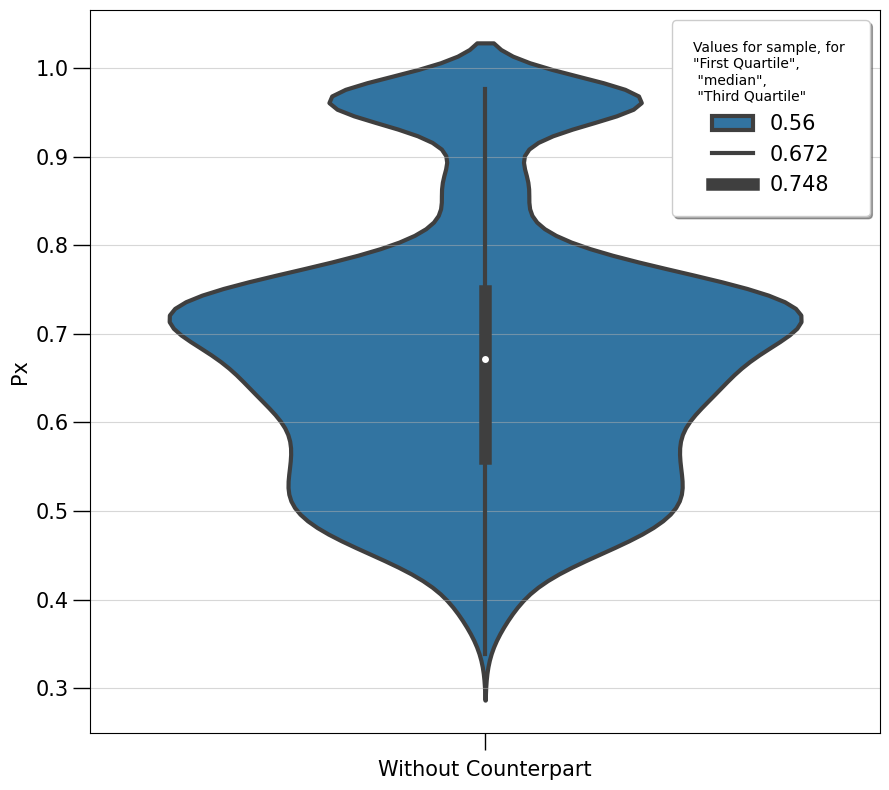

In [24]:
N_25,N_50,N_75 = np.percentile(_nan_['Px'], [25,50,75])

fig = plt.subplots(1,1, figsize=(9,8))
ax = sns.violinplot(y=_nan_["Px"], width=0.8, linewidth=3,scale="count")

ax.tick_params(labelsize=13)
#ax.set_xlim(0.4, 1.6)
ax.set_ylabel('Px',fontsize=15)
ax.set_xlabel('Without Counterpart', fontsize=15)
ax.grid(axis='y', alpha=0.5)
ax.legend((N_25,N_50,N_75),title='Values for sample, for \n"First Quartile", \n "median",\n "Third Quartile"',
          fancybox=True, framealpha=1, shadow=True, borderpad=1, bbox_to_anchor=(1, 1),prop={"size":15})
ax.tick_params(size=12, labelsize=15, width=1)
plt.tight_layout()

In [25]:
#clas = [spikes,saturated, crowded, group,PUVSFR,PUVS,SFR,cstar,empty] #,rotated,special]
#clase = ['spikes','saturated star', 'normal crowded region', 'Stellar group','PUVSFR','PUVS',
#         'SFR','cstar','empty region']
#markers = ['o','^','v','<','>','p','P','*','H','X','D','d','+','x']
#colors = ['darkblue','red','darkorange','blueviolet','turquoise',
#          'teal','plum','darkgreen','lightskyblue','dimgray']
#
#
#fig = plt.figure(figsize=(27,10))
#ax = fig.add_subplot(211,aspect='equal')
#ax.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg')
#for i in range(len(clas)):
#    lb = join(clas[i],nn_nan, keys='ID_n')
#    ax.scatter(lb['GAL_LONG'], lb['GAL_LAT'], s=25, c=colors[i], alpha=0.6, 
#               marker = markers[i],  label=clase[i])
#ax.set_xlabel('Galactic Longitude [deg]', fontsize=20)
#ax.set_ylabel('Galactic Latitude [deg]', fontsize=20)
#plt.grid(True, alpha=0.5)
#ax.set_xlim(350,322)
#ax.set_ylim(-2,2)
#ax.minorticks_on()
#ax.tick_params(which='major', size=12, labelsize=18, width=2)
#ax.tick_params(which='minor', size=8, width=1)
##ax.tick_params(labelsize=15, width=3)
#plt.legend(loc=1, framealpha=0.5, prop={"size":16})
#
#
#ax = fig.add_subplot(212,aspect='equal')
#ax.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg')
#for i in range(len(clas)):
#    lb = join(clas[i],nn_nan, keys='ID_n')
#    ax.scatter(lb['GAL_LONG'], lb['GAL_LAT'], s=25, c=colors[i], alpha=0.6, 
#               marker = markers[i], label=clase[i])
#ax.set_xlabel('Galactic Longitude [deg]', fontsize=20)
#ax.set_ylabel('Galactic Latitude [deg]', fontsize=20)
#plt.grid(True, alpha=0.5)
#ax.set_xlim(322,294)
#ax.set_ylim(-2,2)
#ax.minorticks_on()
#ax.tick_params(which='major', size=12, labelsize=18, width=2)
#ax.tick_params(which='minor', size=8, width=1)
#
#plt.tight_layout()
##plt.savefig('map_class.jpg')

### 4XMM-DR9 complete

4XMM-DR9 Fluxes:
- Flux 1: 0.2 - 0.5
- Flux 2: 0.5 - 1.0
- Flux 3: 1.0 - 2.0
- Flux 4: 2.0 - 4.5
- Flux 5: 4.5 - 12
- Flux 8: 0.2 - 12

In [26]:
xmm = Table.read('4XMM-DR9/dr9-4xmm.fit', format='fits')
xmm['srcid'] = xmm['Source']

#xmm = join(xmm_, vphasp, keys=['srcid'])
#_nan_flux = join(_nan_, xmm, keys=['srcid'])
#_nan_flux.write('_nan_flux.csv', format='csv')
xmm_nan = Table.read('_nan_flux.csv', format='csv')

#t_no_nan['srcid'] = t_no_nan['ID_SEARCH']
#xmm_no_nan = join(t_no_nan, xmm, keys=['srcid'])
#xmm_no_nan.write('xmm_no_nan.csv', format='csv')
xmm_no_nan_ = Table.read('xmm_no_nan.csv', format='csv')

xmm_no_nan = join(xmm_no_nan_, disc, keys=['srcid'])

#vphas_gals = join(xmm, vphasp, keys=['srcid'])

gal_xmm = join(xmm, disc, keys=['srcid'])
len(gal_xmm)

9726

In [27]:
print('Total de fuentes: ', len(xmm_nan))
fg_ = xmm_nan[np.logical_or(xmm_nan['Flux4']>0,xmm_nan['Flux5']>0)]
print('Total de fuentes con emisión sobre los > 2.0 keV (Hard Xray):', len(fg_))
print('Corresponde a un porcentaje de: ', len(fg_)*100/len(xmm_nan))

print('Total de fuentes sin emisión en Soft Xray:', len( fg_[np.logical_or(fg_['Flux1']==0,fg_['Flux2']==0)] ))

Total de fuentes:  5765
Total de fuentes con emisión sobre los > 2.0 keV (Hard Xray): 5714
Corresponde a un porcentaje de:  99.1153512575889
Total de fuentes sin emisión en Soft Xray: 1763


In [28]:
print('Total de fuentes: ', len(gal_xmm))
fg = gal_xmm[np.logical_or(gal_xmm['Flux4']>0, gal_xmm['Flux5']>0)]
print('Total de fuentes con emisión sobre los > 2.0 keV (Hard Xray):', len(fg))
print('Corresponde a un porcentaje de: ', len(fg)*100/len(gal_xmm))

print('Total de fuentes sin emisión en Soft Xray:', len( fg[np.logical_or(fg['Flux1']==0,fg['Flux2']==0)] ))

Total de fuentes:  9726
Total de fuentes con emisión sobre los > 2.0 keV (Hard Xray): 9656
Corresponde a un porcentaje de:  99.28027966275961
Total de fuentes sin emisión en Soft Xray: 2866


### CORRELATION IN FLUX

In [29]:
import statsmodels.api as sm                # Este proporciona funciones para la estimación de muchos modelos estadísticos
import statsmodels.formula.api as smf       # Permite ajustar modelos estadísticos utilizando fórmulas de estilo R

In [30]:
def Flux_from_mag_vvv(m):
    '''From page 100 of Zombeck (1992) [https://ads.harvard.edu/cgi-bin/bbrowse?book=hsaa&chap=2&page=0100]'''
    ''' The spectral irradiance for a star of a given magnitude is given by'''
    '''log(f)=-0.4m + log(f(0))'''
    
    FWHM = 0.309*u.um
    f0 = 3.89*math.pow(10,-10)    #[W m-2 um-1]
    F_ = 10**(-0.4*m + np.log10(f0))*u.W/u.m/u.m/u.um     #[W m-2 um-1]
    F = (F_*FWHM).to(u.mW/u.m/u.m)   #[mW m-2]
    logF = np.log10(F.value)
    return logF

def Flux_from_mag_vvv_2(m):
    '''From page 100 of Zombeck (1992) [https://ads.harvard.edu/cgi-bin/bbrowse?book=hsaa&chap=2&page=0100]'''
    ''' The spectral irradiance for a star of a given magnitude is given by'''
    '''log(f)=-0.4m + log(f(0))'''
    
    FWHM = (0.6*u.um).to(u.Angstrom)      # for VISTA telescope is 0.3
    f0 = 4.17*math.pow(10,-11)
    F_ = 10**(-0.4*m + np.log10(f0))*u.erg/(u.cm*u.cm*u.s*u.Angstrom) #['erg cm-2 s-1 Angstrom-1']
    F = (F_*FWHM).to(u.mW/u.m/u.m)     #[mW m-2]
    logF = np.log10(F.value)
    return logF

def Flux_from_mag_vvv_H(m):    
    FWHM = 0.291*u.um
    f0 = 1.14*math.pow(10,-9)    #[W m-2 um-1]
    F_ = 10**(-0.4*m + np.log10(f0))*u.W/u.m/u.m/u.um     #[W m-2 um-1]
    F = (F_*FWHM).to(u.mW/u.m/u.m)   #[mW m-2]
    logF = np.log10(F.value)
    return logF

def Flux_from_mag_vvv_J(m):    
    FWHM = 0.172*u.um
    f0 = 2.94*math.pow(10,-9)    #[W m-2 um-1]
    F_ = 10**(-0.4*m + np.log10(f0))*u.W/u.m/u.m/u.um     #[W m-2 um-1]
    F = (F_*FWHM).to(u.mW/u.m/u.m)   #[mW m-2]
    logF = np.log10(F.value)
    return logF

def Flux_decaps(F,wv):
    c = Cons.c
    t = (c/ (wv*u.nm).to(u.m)).to(u.Hz)
    (F*u.Jy*t).to(u.mW/u.m/u.m)

In [31]:
import binsreg

def binscatter(**kwargs):
    # Estimate binsreg
    est = binsreg.binsreg(**kwargs)
    
    # Retrieve estimates
    df_est = pd.concat([d.dots for d in est.data_plot])
    df_est = df_est.rename(columns={'x': kwargs.get("x"), 'fit': kwargs.get("y")})
    
    # Add confidence intervals
    if "ci" in kwargs:
        df_est = pd.merge(df_est, pd.concat([d.ci for d in est.data_plot]))
        df_est = df_est.drop(columns=['x'])
        df_est['ci'] = df_est['ci_r'] - df_est['ci_l']
    
    # Rename groups
    if "by" in kwargs:
        df_est['group'] = df_est['group'].astype(df[kwargs.get("by")].dtype)
        df_est = df_est.rename(columns={'group': kwargs.get("by")})

    return df_est

In [32]:
# OBTENER EL FLUJO DE GAIA EN [mW m-2] PARA REALIZAR EL PLOT    
def Gaia_flux(f):
    '''[https://gea.esac.esa.int/archive/documentation/GEDR3/Data_processing/chap_cu5pho/
    cu5pho_sec_photProc/cu5pho_ssec_photCal.html]'''
    '''to convert fluxes to mean energy in units of [𝑊 𝑚−2 𝑛𝑚−1] multiply by:'''
    
    fwhm = 292.75*u.nm
    c_lambda = 1.638483E-21
    Fl = (f*c_lambda)*u.W/u.m/u.m/u.nm
    Fl_ = (Fl*fwhm).to(u.mW/u.m/u.m)
    logF = np.log10(Fl_.value)
    return logF #Fl_

In [33]:
Zgals_ = Table.read('new_Zgals_x_Gaia.csv',format='csv')
Zqso_ = Table.read('new_Zqso_x_Gaia.csv',format='csv')
Zstar_ = Table.read('new_Zstar_x_Gaia.csv',format='csv')

print(len(Zgals_))
print(len(Zqso_))
print(len(Zstar_))

1953
1706
862


In [34]:
# Filter the data using boolean indexing
G = Zgals_[Zgals_['Pstar'] > 0.99]
S = Zstar_[Zstar_['Pstar'] > 0.99]
Q = Zqso_[Zqso_['Pstar'] > 0.99]

# Find the rows that are not in G["srcid"] and create new tables
Zgals = Table(disc[~np.isin(disc['srcid'], G['srcid'])])
Zstar = Table(disc_S[~np.isin(disc_S['srcid'], S['srcid'])])
Zqso = Table(disc_QSO[~np.isin(disc_QSO['srcid'], Q['srcid'])])

print(f'{len(Zgals)} Galaxias depuradas')
print(f'{len(Zstar)} Estrellas depuradas')
print(f'{len(Zqso)} Quasares depurados')

# Combine the tables
Zall = vstack([Zgals, Zqso, Zstar])
print('\nTotal datos depurados')
print(len(Zall))

7792 Galaxias depuradas
854 Estrellas depuradas
2362 Quasares depurados

Total datos depurados
11008


In [35]:
ZG_gals = join(Zgals_, xmm, keys='srcid')
ZG_qso = join(Zqso_, xmm, keys='srcid')
ZG_star = join(Zstar_, xmm, keys='srcid')

#---------

ZG_gals['Label'] = 'GALAXY'
ZG_star['Label'] = 'STAR'
ZG_qso['Label'] = 'QSO'

#len(ZG_gals)+len(ZG_qso)+len(ZG_star)
ZG_complete = vstack([ZG_gals, ZG_qso, ZG_star])
ZG_complete['logFrp'] = Gaia_flux(ZG_complete['FRP'])
ZG_complete['logFxmm'] = np.log10(ZG_complete['Flux8'])


ZG_complete_ = ZG_complete.to_pandas()

<bound method _AxesBase.tick_params of <AxesSubplot:xlabel='$\\mathrm{Log}\\,(\\mathrm{F}_{G_{RP}})\\,\\,[\\mathrm{mW}\\,\\mathrm{m}^{-2}]$', ylabel='$\\mathrm{Log}\\,(\\mathrm{F}_{X})\\,\\,[\\mathrm{mW}\\,\\mathrm{m}^{-2}]$'>>

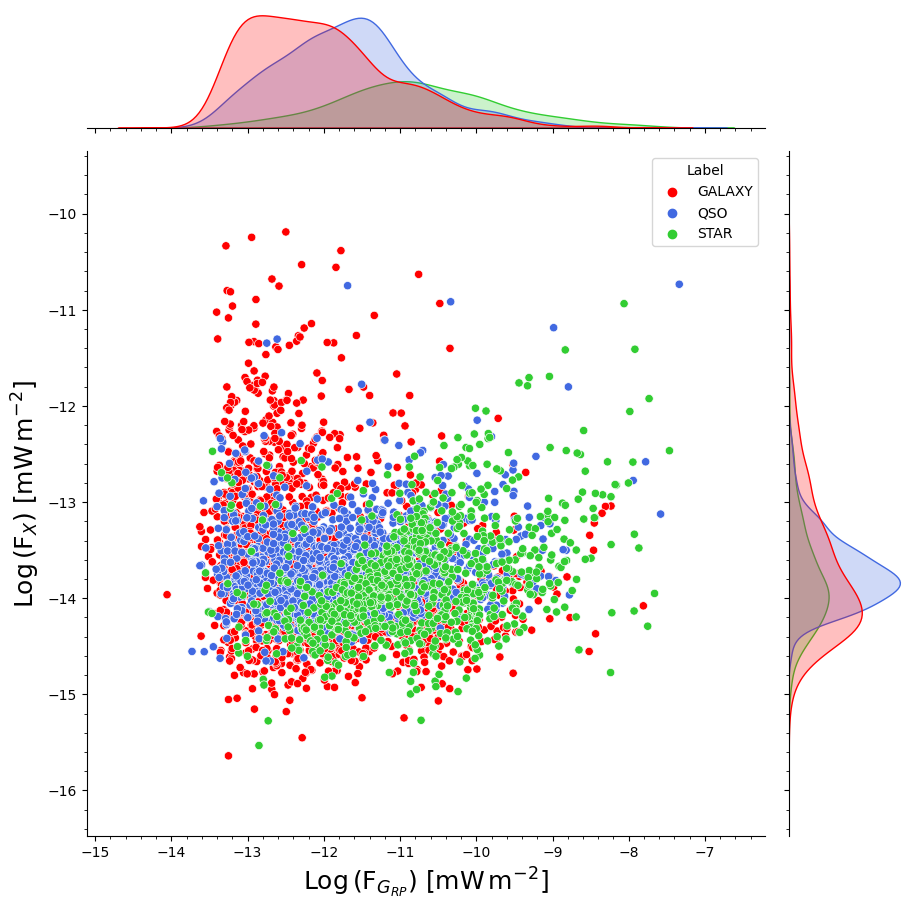

In [36]:
ZG_df = ZG_complete_[~ZG_complete_['FRP'].isna()]
# creating a dictionary with one specific color per group:
my_pal = {"GALAXY": "r", "QSO": "royalblue", "STAR": "limegreen"}

#fig, ax = plt.subplots(1,1, figsize=(9,8))
s = sns.jointplot(x='logFrp', y='logFxmm', data=ZG_df, kind='scatter', hue='Label', height=9, palette=my_pal)
s.ax_joint.grid(False)
s.ax_marg_y.grid(False)

s.ax_joint.set_ylabel(r'$\mathrm{Log}\,(\mathrm{F}_{X})\,\,[\mathrm{mW}\,\mathrm{m}^{-2}]$', fontsize=18)
s.ax_joint.set_xlabel(r'$\mathrm{Log}\,(\mathrm{F}_{G_{RP}})\,\,[\mathrm{mW}\,\mathrm{m}^{-2}]$', size=18)
#ax.grid(axis='y', alpha=0.5)
s.ax_joint.minorticks_on()
s.ax_joint.tick_params

#plt.savefig('L_relation_class')

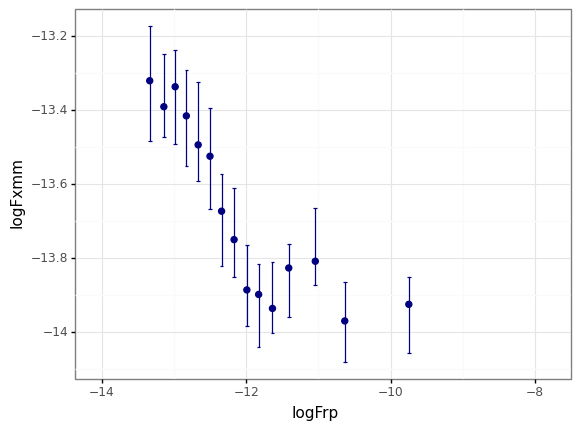

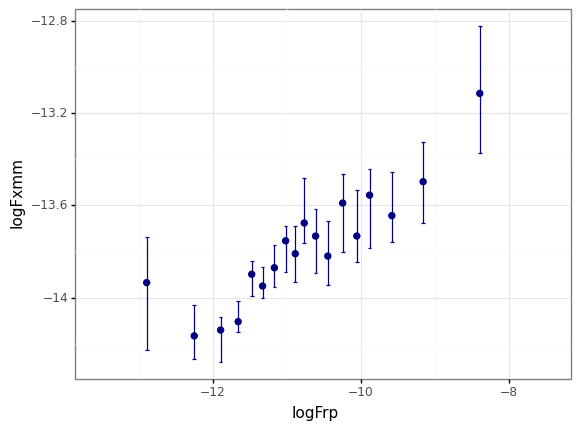

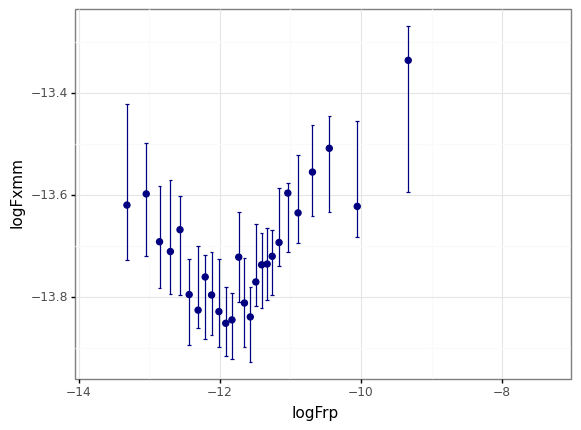

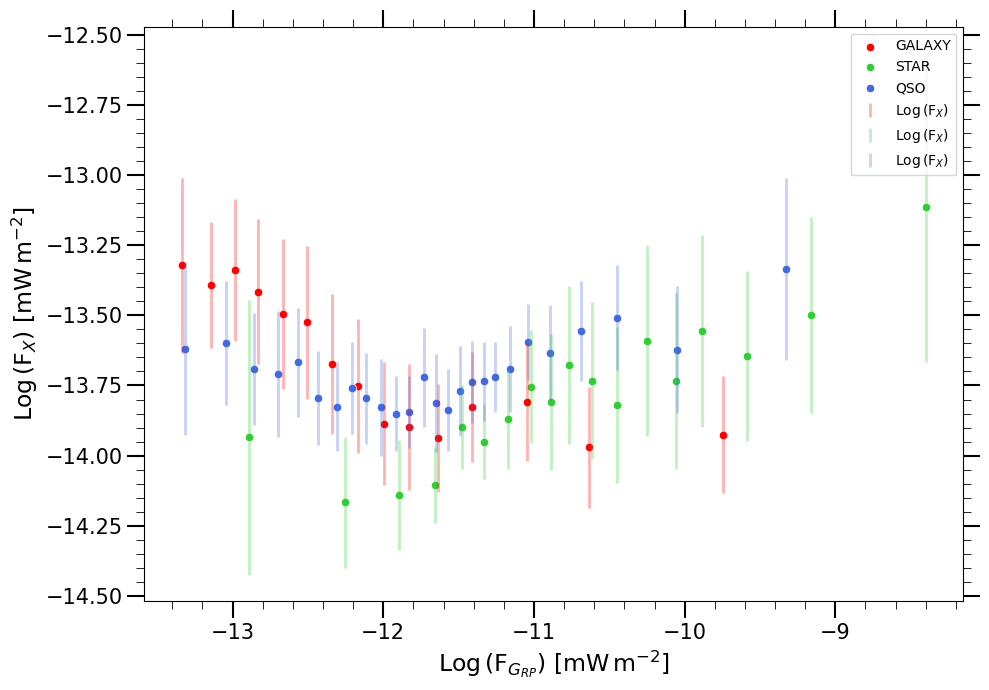

In [37]:
_gals = ZG_df[ZG_df['Label']=='GALAXY']
_star = ZG_df[ZG_df['Label']=='STAR']
_qsos = ZG_df[ZG_df['Label']=='QSO']

### FOR MORE THAN 1 DATA

# Estimate binsreg
df_est_g = binscatter(x='logFrp', y='logFxmm', data=_gals, ci=(3,3))
df_est_s = binscatter(x='logFrp', y='logFxmm', data=_star, ci=(3,3))
df_est_q = binscatter(x='logFrp', y='logFxmm', data=_qsos, ci=(3,3))

# Plot binned scatterplot
fig = plt.subplots(1,1, figsize=(10,7))
ax = sns.scatterplot(x='logFrp', y='logFxmm', data=df_est_g, color='r', label='GALAXY')
ax = sns.scatterplot(x='logFrp', y='logFxmm', data=df_est_s, color='limegreen', label='STAR')
ax = sns.scatterplot(x='logFrp', y='logFxmm', data=df_est_q, color='royalblue', label='QSO')

ax.errorbar('logFrp', 'logFxmm', yerr='ci', data=df_est_g, ls='', lw=2, alpha=0.3, color='r',
            label=r'$\mathrm{Log}\,(\mathrm{F}_{X})$')
ax.errorbar('logFrp', 'logFxmm', yerr='ci', data=df_est_s, ls='', lw=2, alpha=0.3, color='limegreen',
            label=r'$\mathrm{Log}\,(\mathrm{F}_{X})$')
ax.errorbar('logFrp', 'logFxmm', yerr='ci', data=df_est_q, ls='', lw=2, alpha=0.3, color='royalblue',
            label=r'$\mathrm{Log}\,(\mathrm{F}_{X})$')
#plt.title("Sales by firm's age");

ax.tick_params(labelsize=13)
ax.set_ylabel(r'$\mathrm{Log}\,(\mathrm{F}_{X})\,\,[\mathrm{mW}\,\mathrm{m}^{-2}]$', fontsize=17)
ax.set_xlabel(r'$\mathrm{Log}\,(\mathrm{F}_{G_{RP}})\,\,[\mathrm{mW}\,\mathrm{m}^{-2}]$', size=17)
ax.minorticks_on()
ax.tick_params(which='minor', size=6, left=True, right=True, top=True)
ax.tick_params(which='major', size=12, left=True, right=True, top=True, labelsize=15, width=1.5)
plt.legend()
plt.tight_layout()
#plt.savefig('bined_scatter_zhang.jpg')


### CLUSTERING

In [58]:
names_soto = ['GId','RA','DEC','l','b','Ng','Radius','mu_k','Ks_b','Ks_max']
soto = Table.read('nirgc_table_B7.dat', format='ascii', names=names_soto)
soto['ra_'], soto['dec_'] = equatorial(soto['l'], soto['b'])

soto.write('nirgc_clustering.fits', format='fits', overwrite=True)
soto['R_'] = soto['Radius']*60
snr = Table.read('chandra_snr_cat.cat', format='ascii')

names_optics = ['GId','RA','Dec','l','b','Ng','Radius','mu_k','Ks_b','Ks_f']
optics = Table.read('nirgc_optics_clustering.dat', format='ascii', names=names_optics)
optics['ra_'], optics['dec_'] = equatorial(optics['l'], optics['b'])
optics.write('nirgc_optics_clustering.fits',format='fits', overwrite=True)

In [39]:
sdat = soto[soto['l']>294]
sdat = sdat[sdat['l']<351]
sdat = sdat[sdat['b']<2.5]
sdat = sdat[sdat['b']>-2.5]
len(sdat)

81

In [64]:
ds_all = Table.read('erass1_cl_v0.2_simon.fits', format='fits')
ds = ds_all[ds_all['GAL_LONG']>294]
ds = ds[ds['GAL_LONG']<351]
ds = ds[ds['GAL_LAT']<2.5]
ds = ds[ds['GAL_LAT']>-2.5]

ds_x = Table.read('erass1_x_discgal.fits', format='fits')
schroeder = Table.read('Schroderetal2019')

len(schroeder)
sc = schroeder[schroeder['GLON']>294]
sc = sc[sc['GLON']<351]
sc = sc[sc['GLAT']<2]
sc = sc[sc['GLAT']>-2]
len(sc)

185

In [41]:
# (https://vizier.cfa.harvard.edu/viz-bin/VizieR-3)
rosat = Table.read('rosat_vvv.fits', format='fits')
rosat = rosat[rosat['GLON']>294]
rosat = rosat[rosat['GLON']<351]
rosat = rosat[rosat['GLAT']>-2.5]
rosat = rosat[rosat['GLAT']<2.5]

In [42]:
t_nan['GAL_LONG'], t_nan['GAL_LAT'] = galactic(t_nan['RA_SEARCH'],t_nan['DEC_SEARCH'])

pos_074 = SkyCoord(346.50*u.deg, -0.56*u.deg, frame='galactic')

In [59]:
#from astropy.table import Column
#dec_parts = snr['X-ray Position (J2000)(RA, Dec)'][64].strip('()').split(',')[1].strip('()').split()
#dec_parts[0] + ' ' + dec_parts[1] + dec_parts[2] + ' ' + dec_parts[3]

position_str = snr['X-ray Position (J2000)(RA, Dec)'][64] # Get the X-ray Position column

ra_str, dec_str = position_str.strip('()').split(',')        # Split the RA and DEC parts 
dec_parts = dec_str.strip().split()                          # Split the DEC parts further

#joined_dec = dec_parts[0] + ' ' + dec_parts[1] + dec_parts[2] + ' ' + dec_parts[3]

modified_dec = ' '.join([dec_parts[0], dec_parts[1]+dec_parts[2], dec_parts[3]])  #replacing the third part with '32'
modified_position_str = f"({ra_str}, {modified_dec})"             # Construct the modified position string

snr['X-ray Position (J2000)(RA, Dec)'][64] = modified_position_str  # Update the value in the astropy table
snr['X-ray Position (J2000)(RA, Dec)'][64]

'( 04 18 33.9, 57 32 23.0)'

In [61]:
ra_lst = []
dec_lst = []

#for pos in snr['X-ray Position (J2000)(RA, Dec)']:
for i, pos in enumerate(snr['X-ray Position (J2000)(RA, Dec)']):
    #print("Iteration:", i)
    #print("Position:", pos)
    
    ra_str, dec_str = pos.strip('()').split(',')       # Remove parenthesis and split by coma
    ra_h, ra_m, ra_s = map(float, ra_str.split())      #Split RA by space and convert to float
    de_d, de_m, de_s = map(float, dec_str.split())     #Split DEC by space and convert to float
    RA = '{} {} {}'.format(int(ra_h), int(ra_m), ra_s)
    DEC = '{} {} {}'.format(int(de_d),int(de_m),de_s)
    c = SkyCoord(RA,DEC, unit=(u.hourangle, u.deg))
    ra_lst.append(c.ra.degree)
    dec_lst.append(c.dec.degree)
    
snr['ra'] = ra_lst
snr['dec'] = dec_lst
snr['GLON'], snr['GLAT'] = galactic(snr['ra'], snr['dec'])

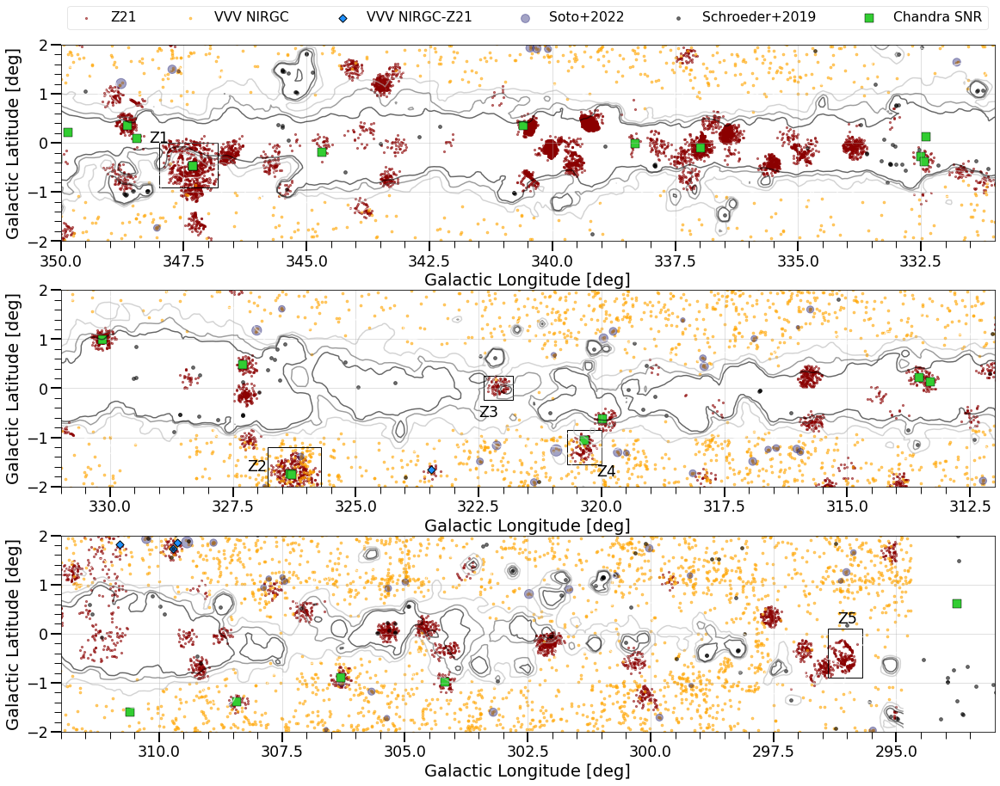

In [62]:
fig = plt.figure(figsize=(20,15), dpi=60)

#ax1
ax = fig.add_subplot(311,aspect='equal')
ax.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg')
ax.scatter(disc['l_LONG'], disc['b_LAT'], s=5, c='darkred', label='Z21', alpha=0.55)
ax.scatter(nirgc['GAL_LONG'], nirgc['GAL_LAT'], s=8, c='orange', label='NIRGC', alpha=0.55)
ax.scatter(gal_zang['GAL_LONG_1'], gal_zang['GAL_LAT_1'], s=45, c='dodgerblue', marker='D', ec='black', label='VVV NIRGC-Z21')
ax.scatter(schroeder['GLON'], schroeder['GLAT'], s=15, c='black', label='Schroeder+2019', alpha=0.55)
ax.scatter(soto['l'], soto['b'], s=soto['R_'], c='midnightblue', marker='o', label='Soto+2022', alpha=0.4)
ax.scatter(snr['GLON'], snr['GLAT'], s=100, fc='limegreen' , ec='black', lw=0.5, marker='s', label='Chandra SNR')
#ax.scatter(rosat['GLON'], rosat['GLAT'], s=32, c='lime', marker='v', label='ROSAT', alpha=0.55)
#ax.scatter(ds['GAL_LONG'], ds['GAL_LAT'], s=40, marker='X', c='darkgreen', label='eRosita', alpha=0.55)

#x = soto['l']
#y = soto['b']
#sizes = (soto['Radius'])/60
#patches = [plt.Circle(center, size) for center, size in zip((x,y), sizes)]
#coll = mpl.collections.PatchCollection(patches, edgecolor='pink', facecolor='none', linestyle='--')
#ax.add_collection(coll)

ax.text(348, 0.1, 'Z1', fontsize=18, color='black',horizontalalignment='center',verticalalignment='center')
##ax.add_patch(Rectangle((325.7, -2), 1.1, 0.8, edgecolor = 'black', facecolor = 'none', fill=False,lw=1))
ax.add_patch(Rectangle((346.8, -0.9), 1.2, 0.9, edgecolor = 'black', facecolor = 'none', fill=False,lw=1))
##ax.add_patch(Rectangle((321.8, -0.24), 0.6, 0.5, edgecolor = 'black', facecolor = 'none', fill=False,lw=1))

ax.set_xlabel('Galactic Longitude [deg]', fontsize=20)
ax.set_ylabel('Galactic Latitude [deg]', fontsize=20)
plt.grid(True, alpha=0.5)
ax.set_xlim(350,331)
ax.set_ylim(-2,2)

ax.minorticks_on()
ax.tick_params(which='major', size=12, labelsize=18, width=2)
ax.tick_params(which='minor', size=8, width=1)

#ax2
ax = fig.add_subplot(312,aspect='equal')
ax.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg')
ax.scatter(disc['l_LONG'], disc['b_LAT'], s=5, c='darkred', label='Z21', alpha=0.55)
ax.scatter(nirgc['GAL_LONG'], nirgc['GAL_LAT'], s=8, c='orange', label='NIRGC', alpha=0.55)
ax.scatter(gal_zang['GAL_LONG_1'], gal_zang['GAL_LAT_1'], s=45, c='dodgerblue', marker='D', ec='black', label='VVV NIRGC-Z21')
ax.scatter(schroeder['GLON'], schroeder['GLAT'], s=15, c='black', label='Schroeder+2019', alpha=0.55)
ax.scatter(soto['l'], soto['b'], s=soto['R_'], c='midnightblue', marker='o', label='Soto+2022', alpha=0.4)
ax.scatter(snr['GLON'], snr['GLAT'], s=100, fc='limegreen' , ec='black', lw=0.5, marker='s', label='Chandra SNR')
#ax.scatter(ds['GAL_LONG'], ds['GAL_LAT'], s=40, marker='X', c='darkgreen', label='eRosita', alpha=0.55)
#ax.scatter(320, 0, s=90, marker='*', c='darkblue', label='GA (2000)', alpha=0.55)
#ax.axvline(x=325, ymin=-1, ymax=1, ls='--', color='orange', lw=1, label='Norma SC')
#ax.axvline(x=315, ymin=-1, ymax=1, ls='--', color='blueviolet', lw=1, label='Centaurus Wall')

#for i in range(len(soto)):
#    ax.add_patch(Circle((soto['l'][i], soto['b'][i]), (soto['Radius'][i])*4/60, edgecolor='black',
#                        facecolor='none', linestyle='--', linewidth=1))

ax.text(327, -1.6, 'Z2', fontsize=18, color='black',horizontalalignment='center',verticalalignment='center')
ax.text(322.3, -0.5, 'Z3', fontsize=18, color='black',horizontalalignment='center',verticalalignment='center')
ax.text(319.9, -1.7, 'Z4', fontsize=18, color='black',horizontalalignment='center',verticalalignment='center')
#ax.text(327.4, 1.2, 'Z6', fontsize=18, color='black',horizontalalignment='center',verticalalignment='center')
ax.add_patch(Rectangle((325.7, -2), 1.1, 0.8, edgecolor = 'black', facecolor = 'none', fill=False,lw=1))
ax.add_patch(Rectangle((321.8, -0.24), 0.6, 0.5, edgecolor = 'black', facecolor = 'none', fill=False,lw=1))
ax.add_patch(Rectangle((320.0, -1.55), 0.7, 0.7, edgecolor = 'black', facecolor = 'none', fill=False,lw=1))
#ax.add_patch(Rectangle((327.0, 0.25), 0.5, 0.6, edgecolor = 'black', facecolor = 'none', fill=False,lw=0.5))

ax.set_xlabel('Galactic Longitude [deg]', fontsize=20)
ax.set_ylabel('Galactic Latitude [deg]', fontsize=20)
plt.grid(True, alpha=0.5)
ax.set_xlim(331,312)
ax.set_ylim(-2,2)

ax.minorticks_on()
ax.tick_params(which='major', size=12, labelsize=18, width=2)
ax.tick_params(which='minor', size=8, width=1)

#ax3
ax = fig.add_subplot(313,aspect='equal')
ax.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg')
ax.scatter(disc['l_LONG'], disc['b_LAT'], s=5, c='darkred', label='Z21', alpha=0.55)
ax.scatter(nirgc['GAL_LONG'], nirgc['GAL_LAT'], s=8, c='orange', label='VVV NIRGC', alpha=0.55)
ax.scatter(gal_zang['GAL_LONG_1'], gal_zang['GAL_LAT_1'], s=45, c='dodgerblue', marker='D', ec='black', label='VVV NIRGC-Z21')
ax.scatter(soto['l'], soto['b'], s=soto['R_'], c='midnightblue', marker='o', label='Soto+2022', alpha=0.4)
ax.scatter(schroeder['GLON'], schroeder['GLAT'], s=15, c='black', label='Schroeder+2019', alpha=0.55)
ax.scatter(snr['GLON'], snr['GLAT'], s=100, fc='limegreen' , ec='black', lw=0.5, marker='s', label='Chandra SNR')
#ax.scatter(320, 0, s=90, marker='*', c='darkblue', label='GA (2000)', alpha=0.55)
#ax.axvline(x=325, ymin=-1, ymax=1, ls='--', color='darkorange', lw=1, label='Norma SC')
#ax.axvline(x=315, ymin=-1, ymax=1, ls='--', color='blueviolet', lw=1, label='Centaurus Wall')
#ax.axvline(x=310, ymin=-1, ymax=1, ls='--', color='blue', lw=1, label='Shapley SC')

#for i in range(len(soto)):
#    ax.add_patch(Circle((soto['l'][i], soto['b'][i]), (soto['Radius'][i])*4/60, edgecolor='black',
#                        facecolor='none', linestyle='--', linewidth=1))

ax.text(296, 0.3, 'Z5', fontsize=18, color='black',horizontalalignment='center',verticalalignment='center')
ax.add_patch(Rectangle((295.7, -0.9), 0.7, 1, edgecolor = 'black', facecolor = 'none', fill=False,lw=1))

ax.set_xlabel('Galactic Longitude [deg]', fontsize=20)
ax.set_ylabel('Galactic Latitude [deg]', fontsize=20)
plt.grid(True, alpha=0.5)
ax.set_xlim(312,293)
ax.set_ylim(-2,2)

ax.minorticks_on()
ax.tick_params(which='major', size=12, labelsize=18, width=2)
ax.tick_params(which='minor', size=8, width=1)

#plot
plt.legend( bbox_to_anchor=(0,3.33,1,0.4),loc='upper center', mode='expand', framealpha=0.5, prop={"size":16}, 
           fancybox=True,ncol=6) #ncol=9 max
plt.tight_layout()
#plt.savefig('map_eRoss_v4.jpg', bbox_inches='tight')
#plt.savefig('map_eRoss.png')
#plt.savefig('map_eRoss_v4.pdf', bbox_inches='tight')

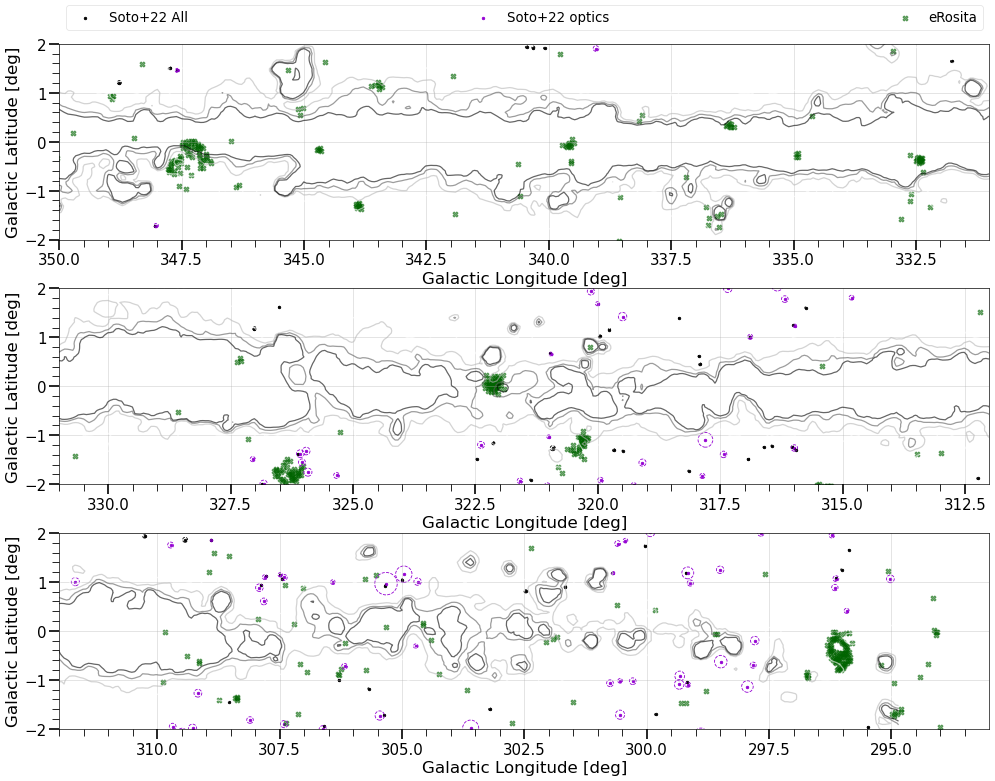

In [66]:
fig = plt.figure(figsize=(20,15), dpi=60)
#ax1
ax = fig.add_subplot(311,aspect='equal')
ax.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg')
#ss = ax.scatter(disc_['l_LONG'], disc_['b_LAT'], s=40, c=disc_['Px'], cmap='jet',alpha=0.6, edgecolors='black',marker='o', label='Zhang')
ax.scatter(soto['l'], soto['b'], s=9, c='black', label='Soto+22 All')
ax.scatter(optics['l'], optics['b'], s=9, c='darkviolet', label='Soto+22 optics')
ax.scatter(ds['GAL_LONG'], ds['GAL_LAT'], s=40, marker='X', c='darkgreen', label='eRosita', alpha=0.55)

for i in range(len(soto)):
    ax.add_patch(Circle((soto['l'][i], soto['b'][i]), (soto['Radius'][i])*1/60, edgecolor='black',
                        facecolor='none', linestyle='--', linewidth=1))
for i in range(len(optics)):
    ax.add_patch(Circle((optics['l'][i], optics['b'][i]), (optics['Radius'][i])*1/60, edgecolor='darkviolet',
                        facecolor='none', linestyle='--', linewidth=1))

ax.set_xlabel('Galactic Longitude [deg]', fontsize=20)
ax.set_ylabel('Galactic Latitude [deg]', fontsize=20)
plt.grid(True, alpha=0.5)
ax.set_xlim(350,331)
ax.set_ylim(-2,2)

ax.minorticks_on()
ax.tick_params(which='major', size=12, labelsize=18, width=2)
ax.tick_params(which='minor', size=8, width=1)

#ax2
ax = fig.add_subplot(312,aspect='equal')
ax.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg')
ax.scatter(soto['l'], soto['b'], s=9, c='black', label='Soto+22 All')
ax.scatter(optics['l'], optics['b'], s=9, c='darkviolet', label='Soto+22 optics')
ax.scatter(ds['GAL_LONG'], ds['GAL_LAT'], s=40, marker='X', c='darkgreen', label='eRosita', alpha=0.55)

for i in range(len(soto)):
    ax.add_patch(Circle((soto['l'][i], soto['b'][i]), (soto['Radius'][i])*1/60, edgecolor='black',
                        facecolor='none', linestyle='--', linewidth=1))
for i in range(len(optics)):
    ax.add_patch(Circle((optics['l'][i], optics['b'][i]), (optics['Radius'][i])*1/60, edgecolor='darkviolet',
                        facecolor='none', linestyle='--', linewidth=1))

ax.set_xlabel('Galactic Longitude [deg]', fontsize=20)
ax.set_ylabel('Galactic Latitude [deg]', fontsize=20)
plt.grid(True, alpha=0.5)
ax.set_xlim(331,312)
ax.set_ylim(-2,2)

ax.minorticks_on()
ax.tick_params(which='major', size=12, labelsize=18, width=2)
ax.tick_params(which='minor', size=8, width=1)

#ax3
ax = fig.add_subplot(313,aspect='equal')
ax.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg')
ax.scatter(soto['l'], soto['b'], s=9, c='black', label='Soto+22 All')
ax.scatter(optics['l'], optics['b'], s=9, c='darkviolet', label='Soto+22 optics')
ax.scatter(ds['GAL_LONG'], ds['GAL_LAT'], s=40, marker='X', c='darkgreen', label='eRosita', alpha=0.55)

for i in range(len(soto)):
    ax.add_patch(Circle((soto['l'][i], soto['b'][i]), (soto['Radius'][i])*1/60, edgecolor='black',
                        facecolor='none', linestyle='--', linewidth=1))
for i in range(len(optics)):
    ax.add_patch(Circle((optics['l'][i], optics['b'][i]), (optics['Radius'][i])*1/60, edgecolor='darkviolet',
                        facecolor='none', linestyle='--', linewidth=1))

ax.set_xlabel('Galactic Longitude [deg]', fontsize=20)
ax.set_ylabel('Galactic Latitude [deg]', fontsize=20)
plt.grid(True, alpha=0.5)
ax.set_xlim(312,293)
ax.set_ylim(-2,2)

ax.minorticks_on()
ax.tick_params(which='major', size=12, labelsize=18, width=2)
ax.tick_params(which='minor', size=8, width=1)

#plot
plt.legend( bbox_to_anchor=(0,3.33,1,0.4),loc='upper center', mode='expand', framealpha=0.5, prop={"size":16}, 
           fancybox=True,ncol=5) #ncol=9 max
plt.tight_layout()

In [67]:
msa = _nan_[_nan_['Massive_star_assoc']==1]
print('{} < l < {}'.format(min(msa['GAL_LONG']),max(msa['GAL_LONG'])))
print('{} < b < {}'.format(min(msa['GAL_LAT']),max(msa['GAL_LAT'])))

320.51693071307034 < l < 348.72895879252127
-1.2057650522025447 < b < 0.3262203254401488


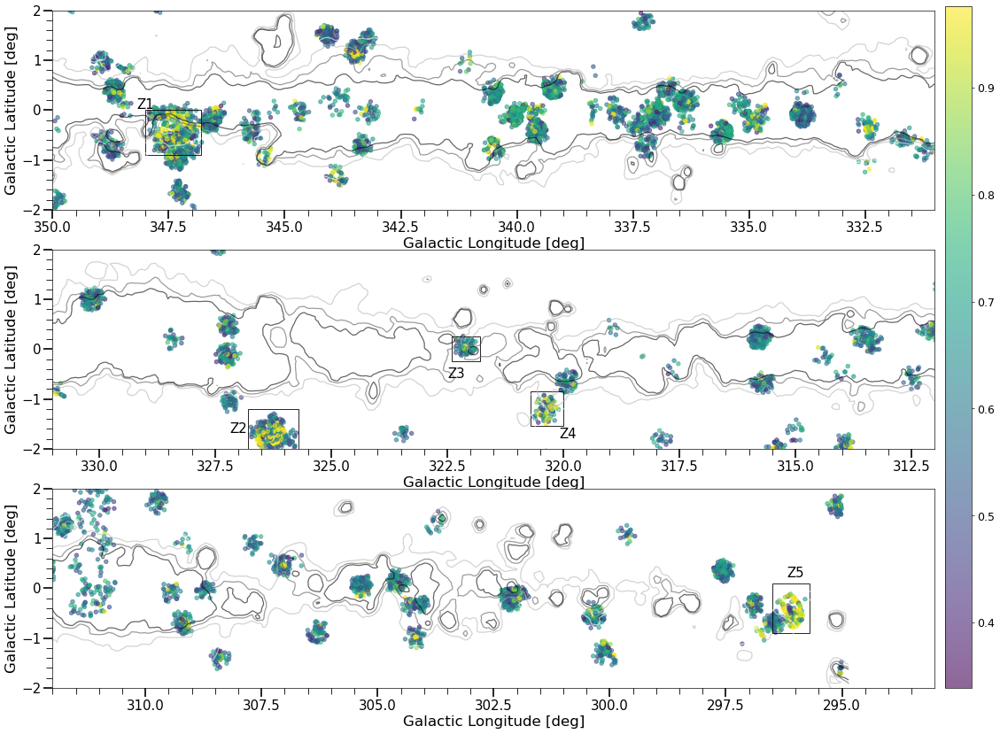

In [70]:
fig= plt.figure(constrained_layout=True, figsize=(20,15), dpi=60)
scat1 = plt.axes([0.10,0.70,0.83,0.25])
scat2 = plt.axes([0.10,0.40,0.83,0.25])
scat3 = plt.axes([0.10,0.10,0.83,0.25])
bar = plt.axes([0.94,0.1,0.025,0.855])
bar.tick_params(labelsize=15)

#ax1
scat1.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg')
ss = scat1.scatter(df_g['l_LONG'], df_g['b_LAT'], s=30, c=df_g['Px'], cmap='viridis'
                   ,alpha=0.6,marker='o', label='ZZW21')
scat1.set_xlabel('Galactic Longitude [deg]', fontsize=20)
scat1.set_ylabel('Galactic Latitude [deg]', fontsize=20)
plt.grid(True, alpha=0.5)
scat1.set_xlim(350,331)
scat1.set_ylim(-2,2)
scat1.minorticks_on()
scat1.tick_params(which='major', size=12, labelsize=18, width=2)
scat1.tick_params(which='minor', size=8, width=1)
scat1.text(348, 0.1, 'Z1', fontsize=18, color='black',horizontalalignment='center',verticalalignment='center')
scat1.add_patch(Rectangle((346.8, -0.9), 1.2, 0.9, edgecolor = 'black', facecolor = 'none', fill=False,lw=1))

#ax2
scat2.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg')
ss = scat2.scatter(df_g['l_LONG'], df_g['b_LAT'], s=30, c=df_g['Px'], cmap='viridis',
                   alpha=0.6, marker='o', label='ZZW21')
scat2.set_xlabel('Galactic Longitude [deg]', fontsize=20)
scat2.set_ylabel('Galactic Latitude [deg]', fontsize=20)
#plt.grid(True, alpha=0.5)
scat2.set_xlim(331,312)
scat2.set_ylim(-2,2)
scat2.minorticks_on()
scat2.tick_params(which='major', size=12, labelsize=18, width=2)
scat2.tick_params(which='minor', size=8, width=1)
scat2.text(327, -1.6, 'Z2', fontsize=18, color='black',horizontalalignment='center',verticalalignment='center')
scat2.text(322.3, -0.5, 'Z3', fontsize=18, color='black',horizontalalignment='center',verticalalignment='center')
scat2.text(319.9, -1.7, 'Z4', fontsize=18, color='black',horizontalalignment='center',verticalalignment='center')
scat2.add_patch(Rectangle((325.7, -2), 1.1, 0.8, edgecolor = 'black', facecolor = 'none', fill=False,lw=1))
scat2.add_patch(Rectangle((321.8, -0.24), 0.6, 0.5, edgecolor = 'black', facecolor = 'none', fill=False,lw=1))
scat2.add_patch(Rectangle((320.0, -1.55), 0.7, 0.7, edgecolor = 'black', facecolor = 'none', fill=False,lw=1))

#ax3
scat3.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg')
ss = scat3.scatter(df_g['l_LONG'], df_g['b_LAT'], s=30, c=df_g['Px'], cmap='viridis',
                   alpha=0.6, marker='o', label='ZZW21')
scat3.set_xlabel('Galactic Longitude [deg]', fontsize=20)
scat3.set_ylabel('Galactic Latitude [deg]', fontsize=20)
scat3.set_xlim(312,293)
scat3.set_ylim(-2,2)
scat3.minorticks_on()
scat3.tick_params(which='major', size=12, labelsize=18, width=2)
scat3.tick_params(which='minor', size=8, width=1)

scat3.text(296, 0.3, 'Z5', fontsize=18, color='black',horizontalalignment='center',verticalalignment='center')
scat3.add_patch(Rectangle((295.7, -0.9), 0.8, 1, edgecolor = 'black', facecolor = 'none', fill=False,lw=1))

#plot
ss.set_clim(vmin=min(df_g['Px']),vmax=max(df_g['Px']))
plt.colorbar(ss, cax=bar)

#plt.legend( bbox_to_anchor=(0,3.33,1,0.4),loc='upper center', mode='expand', framealpha=0.5, prop={"size":16}, 
#           fancybox=True,ncol=5) #ncol=9 max
plt.tight_layout()
#plt.savefig('map_Zprob.jpg', bbox_inches='tight')

In [122]:
#(346.8, -0.9), 1.2, 0.9
Z1 = ds[ds['GAL_LONG']>346.8]
Z1 = Z1[Z1['GAL_LONG']<(346.8+1.2)]
Z1 = Z1[Z1['GAL_LAT']>-0.9]
Z1 = Z1[Z1['GAL_LAT']<(-0.9+0.9)]


## Zhang+21

#(346.8, -0.9), 1.2, 0.9
dZ1 = disc[disc['l_LONG']>346.8]
dZ1 = dZ1[dZ1['l_LONG']<(346.8+1.2)]
dZ1 = dZ1[dZ1['b_LAT']>-0.9]
dZ1 = dZ1[dZ1['b_LAT']<(-0.9+0.9)]

aZ1 = disc_all[disc_all['l_LONG']>346.8]
aZ1 = aZ1[aZ1['l_LONG']<(346.8+1.2)]
aZ1 = aZ1[aZ1['b_LAT']>-0.9]
aZ1 = aZ1[aZ1['b_LAT']<(-0.9+0.9)]

dz1_l = min(dZ1['l_LONG']) + ( max(dZ1['l_LONG']) - min(dZ1['l_LONG']) )/2
dz1_b = min(dZ1['b_LAT']) + ( max(dZ1['b_LAT']) - min(dZ1['b_LAT']) )/2
dz1_ra = min(dZ1['sc_ra']) + ( max(dZ1['sc_ra']) - min(dZ1['sc_ra']) )/2
dz1_de = min(dZ1['sc_dec']) + ( max(dZ1['sc_dec']) - min(dZ1['sc_dec']) )/2

dZ1_coord_gal = Table([dZ1['l_LONG'], dZ1['b_LAT']],names=('glon','glat'))
dZ1_coord_gal.write('dz1_coord_gal.cat', format='ascii')


#(325.7, -2), 1.1, 0.8
dZ2 = disc[disc['l_LONG']>325.7]
dZ2 = dZ2[dZ2['l_LONG']<(325.7+1.1)]
dZ2 = dZ2[dZ2['b_LAT']>-2]
dZ2 = dZ2[dZ2['b_LAT']<(-2+0.8)]

aZ2 = disc_all[disc_all['l_LONG']>325.7]
aZ2 = aZ2[aZ2['l_LONG']<(325.7+1.1)]
aZ2 = aZ2[aZ2['b_LAT']>-2]
aZ2 = aZ2[aZ2['b_LAT']<(-2+0.8)]

dz2_l = min(dZ2['l_LONG']) + ( max(dZ2['l_LONG']) - min(dZ2['l_LONG']) )/2
dz2_b = min(dZ2['b_LAT']) + ( max(dZ2['b_LAT']) - min(dZ2['b_LAT']) )/2
dz2_ra = min(dZ2['sc_ra']) + ( max(dZ2['sc_ra']) - min(dZ2['sc_ra']) )/2
dz2_de = min(dZ2['sc_dec']) + ( max(dZ2['sc_dec']) - min(dZ2['sc_dec']) )/2

#(321.8, -0.24), 0.6, 0.5
dZ3 = disc[disc['l_LONG']>321.8]
dZ3 = dZ3[dZ3['l_LONG']<(321.8+0.6)]
dZ3 = dZ3[dZ3['b_LAT']>-0.24]
dZ3 = dZ3[dZ3['b_LAT']<(-0.24+0.5)]

aZ3 = disc_all[disc_all['l_LONG']>321.8]
aZ3 = aZ3[aZ3['l_LONG']<(321.8+0.6)]
aZ3 = aZ3[aZ3['b_LAT']>-0.24]
aZ3 = aZ3[aZ3['b_LAT']<(-0.24+0.5)]

dz3_l = min(dZ3['l_LONG']) + ( max(dZ3['l_LONG']) - min(dZ3['l_LONG']) )/2
dz3_b = min(dZ3['b_LAT']) + ( max(dZ3['b_LAT']) - min(dZ3['b_LAT']) )/2
dz3_ra = min(dZ3['sc_ra']) + ( max(dZ3['sc_ra']) - min(dZ3['sc_ra']) )/2
dz3_de = min(dZ3['sc_dec']) + ( max(dZ3['sc_dec']) - min(dZ3['sc_dec']) )/2

#(295.7, -0.9), 0.7, 1
dZ5 = disc[disc['l_LONG']>295.7]
dZ5 = dZ5[dZ5['l_LONG']<(295.7+0.7)]
dZ5 = dZ5[dZ5['b_LAT']>-0.9]
dZ5 = dZ5[dZ5['b_LAT']<(-0.9+1)]

dz5_l = min(dZ5['l_LONG']) + ( max(dZ5['l_LONG']) - min(dZ5['l_LONG']) )/2
dz5_b = min(dZ5['b_LAT']) + ( max(dZ5['b_LAT']) - min(dZ5['b_LAT']) )/2
dz5_ra = min(dZ5['sc_ra']) + ( max(dZ5['sc_ra']) - min(dZ5['sc_ra']) )/2
dz5_de = min(dZ5['sc_dec']) + ( max(dZ5['sc_dec']) - min(dZ5['sc_dec']) )/2

aZ5 = disc_all[disc_all['l_LONG']>295.7]
aZ5 = aZ5[aZ5['l_LONG']<(295.7+0.7)]
aZ5 = aZ5[aZ5['b_LAT']>-0.9]
aZ5 = aZ5[aZ5['b_LAT']<(-0.9+1)]

#(320.0, -1.55), 0.7, 0.7
dZ4 = disc[disc['l_LONG']>320.0]
dZ4 = dZ4[dZ4['l_LONG']<(320.0+0.7)]
dZ4 = dZ4[dZ4['b_LAT']>-1.55]
dZ4 = dZ4[dZ4['b_LAT']<(-1.55+0.7)]

aZ4 = disc_all[disc_all['l_LONG']>320.0]
aZ4 = aZ4[aZ4['l_LONG']<(320.0+0.7)]
aZ4 = aZ4[aZ4['b_LAT']>-1.55]
aZ4 = aZ4[aZ4['b_LAT']<(-1.55+0.7)]

dz4_l = min(dZ4['l_LONG']) + ( max(dZ4['l_LONG']) - min(dZ4['l_LONG']) )/2
dz4_b = min(dZ4['b_LAT']) + ( max(dZ4['b_LAT']) - min(dZ4['b_LAT']) )/2
dz4_ra = min(dZ4['sc_ra']) + ( max(dZ4['sc_ra']) - min(dZ4['sc_ra']) )/2
dz4_de = min(dZ4['sc_dec']) + ( max(dZ4['sc_dec']) - min(dZ4['sc_dec']) )/2

#(326.95, 0.2), 0.6, 0.6
dZ6 = disc[disc['l_LONG']>326.95]
dZ6 = dZ6[dZ6['l_LONG']<(326.95+0.6)]
dZ6 = dZ6[dZ6['b_LAT']>0.2]
dZ6 = dZ6[dZ6['b_LAT']<(0.2+0.6)]

dz6_l = min(dZ6['l_LONG']) + ( max(dZ6['l_LONG']) - min(dZ6['l_LONG']) )/2
dz6_b = min(dZ6['b_LAT']) + ( max(dZ6['b_LAT']) - min(dZ6['b_LAT']) )/2
dz6_ra = min(dZ6['sc_ra']) + ( max(dZ6['sc_ra']) - min(dZ6['sc_ra']) )/2
dz6_de = min(dZ6['sc_dec']) + ( max(dZ6['sc_dec']) - min(dZ6['sc_dec']) )/2


In [73]:
print(' RA DEC:')
print('Z1: {:.6f} {:.6f}'.format(dz1_ra,dz1_de))
print('Z2: {:.6f} {:.6f}'.format(dz2_ra,dz2_de))
print('Z3: {:.6f} {:.6f}'.format(dz3_ra,dz3_de))
print('Z4: {:.6f} {:.6f}'.format(dz4_ra,dz4_de))
print('Z5: {:.6f} {:.6f}'.format(dz5_ra,dz5_de))

print()
print(' l b:')
print('Z1: ',+dz1_l,+dz1_b)
print('Z2: ',+dz2_l,+dz2_b)
print('Z3: ',+dz3_l,+dz3_b)
print('Z4: ',+dz4_l,+dz4_b)
print('Z5: ',+dz5_l,+dz5_b)
print()
print('Z6: ',+dz6_l,+dz6_b)

 RA DEC:
Z1: 258.338793 -39.692237
Z2: 238.111640 -56.191484
Z3: 230.144189 -57.132389
Z4: 228.682337 -59.161185
Z5: 177.960153 -62.588695

 l b:
Z1:  347.3628875235636 -0.4498914914603837
Z2:  326.2385032334746 -1.6480228576130709
Z3:  322.10318209806076 0.05524079240059798
Z4:  320.36868879452925 -1.2153122253902158
Z5:  296.0957906863114 -0.4858852486534278

Z6:  327.22021135868425 0.4614174890997651


In [77]:
dz1_c = SkyCoord(dz1_ra*u.degree, dz1_de*u.degree)
dz2_c = SkyCoord(dz2_ra*u.degree, dz2_de*u.degree)
dz3_c = SkyCoord(dz3_ra*u.degree, dz3_de*u.degree)
dz4_c = SkyCoord(dz4_ra*u.degree, dz4_de*u.degree)
dz5_c = SkyCoord(dz5_ra*u.degree, dz5_de*u.degree)
#dz1_c.ra.hms

print(' RA DEC:')
print('Z1: {:}'.format(dz1_c.to_string('hmsdms')))
print('Z2: {:}'.format(dz2_c.to_string('hmsdms')))
print('Z3: {:}'.format(dz3_c.to_string('hmsdms')))
print('Z4: {:}'.format(dz4_c.to_string('hmsdms')))
print('Z5: {:}'.format(dz5_c.to_string('hmsdms')))

print()
print('Z1: ',+len(dZ1))
print('Z2: ',+len(dZ2))
print('Z3: ',+len(dZ3))
print('Z4: ',+len(dZ4))
print('Z5: ',+len(dZ5))

 RA DEC:
Z1: 17h13m21.31030811s -39d41m32.05307551s
Z2: 15h52m26.79349024s -56d11m29.34270533s
Z3: 15h20m34.60541998s -57d07m56.5990206s
Z4: 15h14m43.76078161s -59d09m40.26488638s
Z5: 11h51m50.43674023s -62d35m19.30357029s

Z1:  562
Z2:  244
Z3:  78
Z4:  158
Z5:  203


### ------------------------------- Cutouts of Zones -------------------------------

(599, 600)

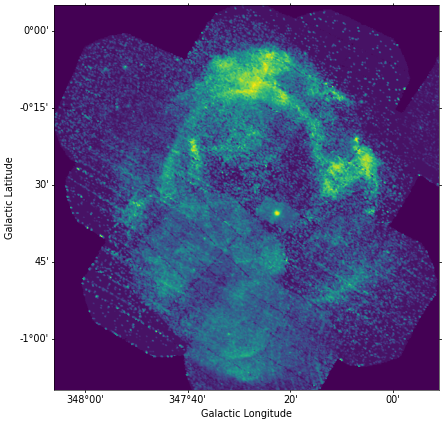

In [80]:
##################  Z1  ##################

#### MANUALMENTE CORTAR CADA objeto 
hdu_1 = fits.open('aladin/Z1/Z1_XMM-PN-eb4~1.fits')[0]
wcs = WCS(hdu_1.header)

fig = plt.figure(figsize=(10,10), dpi=50)
ax = fig.add_subplot(111, projection=wcs)
#ax.imshow(z1_vvv.data, cmap='gray', vmax=1000, interpolation=None, origin='lower')

point_gal = (dz1_l, dz1_b)
position = SkyCoord(point_gal[0]*u.degree, point_gal[1]*u.degree, frame='galactic')
# Make the cutout, including the WCS
cutout = Cutout2D(hdu_1.data, position, (600,600 ), wcs=wcs)
ax.imshow(cutout.data, origin='lower')  
ax.set_xlabel('Galactic Longitude', size=14)
ax.set_ylabel('Galactic Latitude', size=14)
ax.tick_params(which='major', size=12, labelsize=14)
# Put the cutout image in the FITS HDU
hdu_1.data = cutout.data
# Update the FITS header with the cutout WCS
hdu_1.header.update(cutout.wcs.to_header())
# Write the cutout to a new FITS file
cutout_filename = 'aladin/Z1/news/p_z1_xmm_eb4.fits'
#hdu_1.writeto(cutout_filename, overwrite=True)

hdu_1.shape


(675, 850)

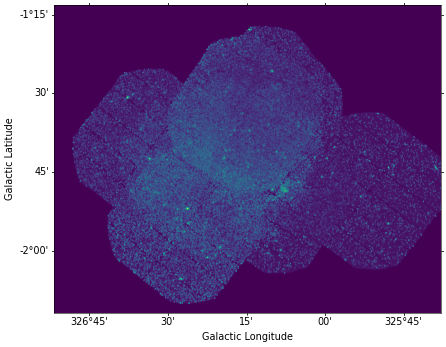

In [82]:
##################  Z2  ##################

#### MANUALMENTE CORTAR CADA objeto 
#(xmm_eb, vvv, sumss, spitzer, decaps, allWise)
hdu_2 = fits.open('aladin/Z2/Z2_XMM-PN-eb4~1.fits')[0]
wcs = WCS(hdu_2.header)

fig = plt.figure(figsize=(10,10), dpi=50)
ax = fig.add_subplot(111, projection=wcs)
ax.imshow(hdu_2.data, cmap='gray', vmax=1000, interpolation=None, origin='lower')

point_gal = (dz2_l, dz2_b)
position = SkyCoord(point_gal[0]*u.degree, point_gal[1]*u.degree, frame='galactic')
# Make the cutout, including the WCS
cutout = Cutout2D(hdu_2.data, position, (850,850), wcs=wcs)
ax.imshow(cutout.data, origin='lower')  
ax.set_xlabel('Galactic Longitude', size=14)
ax.set_ylabel('Galactic Latitude', size=14)
ax.tick_params(which='major', size=12, labelsize=14)
# Put the cutout image in the FITS HDU
hdu_2.data = cutout.data
# Update the FITS header with the cutout WCS
hdu_2.header.update(cutout.wcs.to_header())
# Write the cutout to a new FITS file
cutout_filename = 'aladin/Z2/news/p_z2_xmm_eb4.fits'
#hdu_2.writeto(cutout_filename, overwrite=True)

hdu_2.shape

(600, 600)

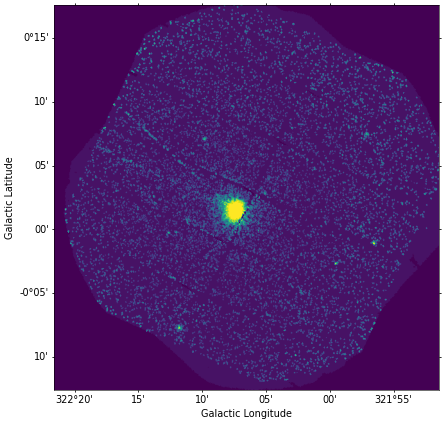

In [83]:
##################  Z3  ##################

#### MANUALMENTE CORTAR CADA objeto
#(xmm_eb, vvv, sumss, spitzer, decaps, allWise)

hdu_3 = fits.open('aladin/Z3/Z3_XMM-PN-eb4~1.fits')[0]
wcs = WCS(hdu_3.header)

fig = plt.figure(figsize=(10,10), dpi=50)
ax = fig.add_subplot(111, projection=wcs)
#ax.imshow(z1_vvv.data, cmap='gray', vmax=1000, interpolation=None, origin='lower')

point_gal = (dz3_l, dz3_b)
position = SkyCoord(point_gal[0]*u.degree, point_gal[1]*u.degree, frame='galactic')
# Make the cutout, including the WCS
cutout = Cutout2D(hdu_3.data, position, (600,600 ), wcs=wcs)
ax.imshow(cutout.data, origin='lower')  
ax.set_xlabel('Galactic Longitude', size=14)
ax.set_ylabel('Galactic Latitude', size=14)
ax.tick_params(which='major', size=12, labelsize=14)
# Put the cutout image in the FITS HDU
hdu_3.data = cutout.data
# Update the FITS header with the cutout WCS
hdu_3.header.update(cutout.wcs.to_header())
# Write the cutout to a new FITS file
cutout_filename = 'aladin/Z3/news/p_z3_xmm_eb4.fits'
#hdu_3.writeto(cutout_filename, overwrite=True)

hdu_3.shape

(766, 712)

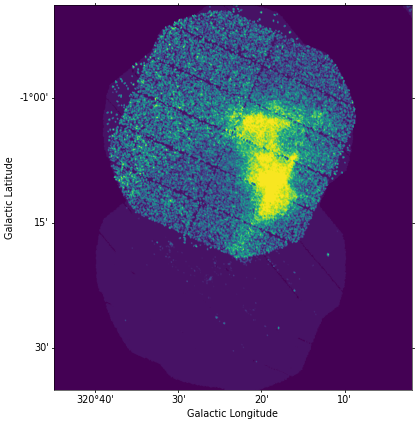

In [85]:
##################  Z4  ##################

#### MANUALMENTE CORTAR CADA objeto
#(xmm_eb, vvv, sumss, spitzer, decaps, allWise, SHS)

hdu_4 = fits.open('aladin/Z4/Z4_XMM-PN-eb4~1.fits')[0]
wcs = WCS(hdu_4.header)

fig = plt.figure(figsize=(10,10), dpi=50)
ax = fig.add_subplot(111, projection=wcs)
#ax.imshow(z1_vvv.data, cmap='gray', vmax=1000, interpolation=None, origin='lower')

point_gal = (dz4_l, dz4_b)
position = SkyCoord(point_gal[0]*u.degree, point_gal[1]*u.degree, frame='galactic')
# Make the cutout, including the WCS
cutout = Cutout2D(hdu_4.data, position, (800,800 ), wcs=wcs)
ax.imshow(cutout.data, origin='lower')  
ax.set_xlabel('Galactic Longitude', size=14)
ax.set_ylabel('Galactic Latitude', size=14)
ax.tick_params(which='major', size=12, labelsize=14)
# Put the cutout image in the FITS HDU
hdu_4.data = cutout.data
# Update the FITS header with the cutout WCS
hdu_4.header.update(cutout.wcs.to_header())
# Write the cutout to a new FITS file
cutout_filename = 'aladin/Z4/news/p_z4_xmm_eb4.fits'
#hdu_4.writeto(cutout_filename, overwrite=True)

hdu_4.shape

(750, 741)

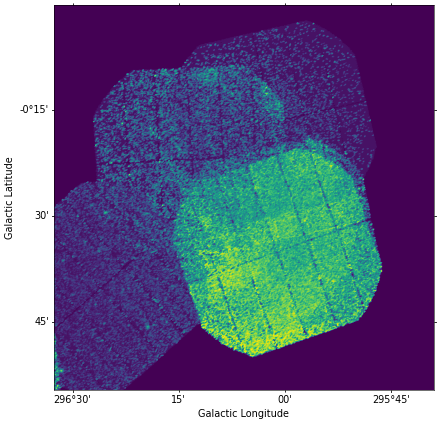

In [86]:
##################  Z4  ##################

#### MANUALMENTE CORTAR CADA objeto
#(xmm_eb, vvv, sumss, spitzer, decaps, allWise, SHS)

hdu_5 = fits.open('aladin/Z5/Z5_XMM-PN-eb4~1.fits')[0]
wcs = WCS(hdu_5.header)

fig = plt.figure(figsize=(10,10), dpi=50)
ax = fig.add_subplot(111, projection=wcs)
#ax.imshow(z1_vvv.data, cmap='gray', vmax=1000, interpolation=None, origin='lower')

point_gal = (dz5_l, dz5_b)
position = SkyCoord(point_gal[0]*u.degree, point_gal[1]*u.degree, frame='galactic')
# Make the cutout, including the WCS
cutout = Cutout2D(hdu_5.data, position, (800,800 ), wcs=wcs)
ax.imshow(cutout.data, origin='lower')  
ax.set_xlabel('Galactic Longitude', size=14)
ax.set_ylabel('Galactic Latitude', size=14)
ax.tick_params(which='major', size=12, labelsize=14)
# Put the cutout image in the FITS HDU
hdu_5.data = cutout.data
# Update the FITS header with the cutout WCS
hdu_5.header.update(cutout.wcs.to_header())
# Write the cutout to a new FITS file
cutout_filename = 'aladin/Z5/news/p_z5_xmm_eb4.fits'
#hdu_5.writeto(cutout_filename, overwrite=True)

hdu_5.shape

### Bandas -------

 XMM eb2 - XMM eb3 - XMM eb4 - VVV H - SUMSS - SPITZER irac 1 - SPITZER irac 2 - SPITZER irac 3 - SPITZER irac 4 - DeCaps g - DeCaps r -DeCaps i - DeCaps z - DeCaps Y - allWISE W3 - allWISE W4 - SHS


In [88]:
filetrs = ['SUMSS', 'allWISE W4', 'allWISE W3', 'IRAC4', 'IRAC3', '2MASS K', 'VVV H', 'DECaPS Y', 'DECaPS z', 'DECaPS i',
          'DECaPS r', 'SHS', 'DECaPS g', 'XMM eb2', 'XMM eb3', 'XMM eb4']
wavelengths = [843*u.MH, 22*u.um, 12*u.um, 8.0*u.um, 5.8*u.um, 2.16*u.um, 1.5*u.um, 1009*u.nm, 926*u.nm, 784*u.nm, 
              642*u.nm, 590*u.nm, 473*u.nm, [0.5,1.0]*u.keV, [1.0,2.0]*u.keV, [2.0, 4.5]*u.keV]

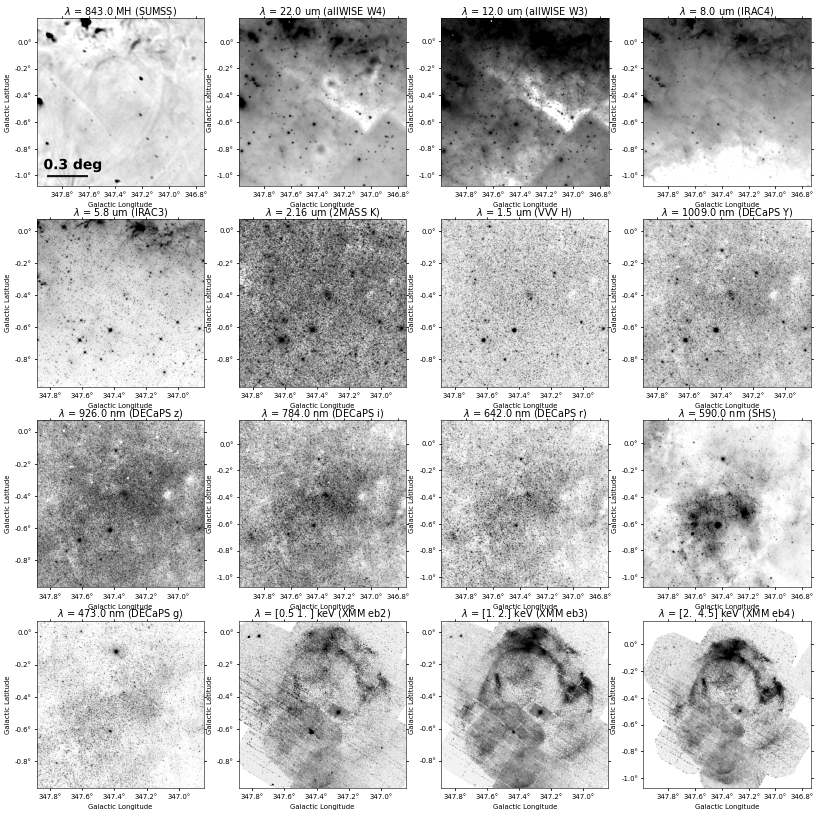

In [98]:
data_path = '/home/pmc/Documents/Zang_etal/aladin/Z1/news'

fig = plt.figure(figsize=(20, 20), dpi=50)
fig.tight_layout()

files = glob.glob(data_path+'/*.fits')
files.sort()

for i,file in zip(range(len(files)),files):
    hdu = fits.open(file)[0]
    wcs = WCS(hdu.header)
    
    ax = fig.add_subplot(4, 4, i+1, projection=wcs)
    norm = simple_norm(hdu.data, 'power', min_percent=0.5, max_percent=99.5)
    ax.imshow(hdu.data, origin='lower', norm=norm, cmap=plt.cm.gray_r, interpolation=None)
    ax.set_xlabel('Galactic Longitude', size=10)
    ax.set_ylabel('Galactic Latitude', size=10)
    ax.set_title(r'$\lambda$ = {} ({})'.format(wavelengths[i], filetrs[i]), size=14)
    
    ax.tick_params(which='major', axis='x', size=5, labelsize=10, bottom=True, top=True)
    ax.tick_params(which='major', axis='y', size=5, labelsize=10, right=True, left=True)
    ax.minorticks_on()
    
    ax.coords[0].set_major_formatter('d.d')
    ax.coords[1].set_major_formatter('d.d')

    if i == 0:
        lon, lat = wcs.wcs_pix2world([[0, 0]], 0)[0]
        lon_0p1, lat_0p1 = wcs.wcs_pix2world([[0.3 / wcs.pixel_scale_matrix[0, 0], 0]], 0)[0]
        
        ax.arrow(lon - 0.38, lat + 0.07, lon_0p1 - lon, 0, head_width=0, head_length=0,
                 fc='black',  width=0.01, transform=ax.get_transform('galactic'), zorder=2)
        text = ax.text(lon - 0.35 + (lon_0p1 - lon), lat + 0.1, '0.3 deg', color='black', fontsize=20,
                       fontweight='bold', transform=ax.get_transform('galactic'), va='bottom', ha='left')
        text.set_path_effects([withStroke(linewidth=1, foreground='white')])
        
plt.show()        
#plt.savefig('Z1_images.jpg', bbox_inches='tight')

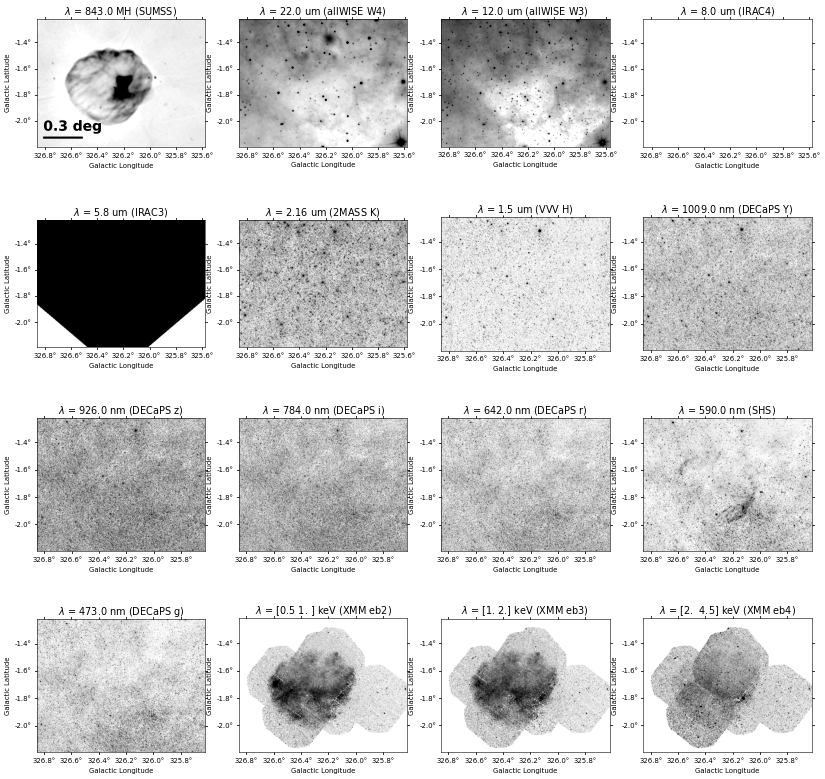

In [99]:
data_path = '/home/pmc/Documents/Zang_etal/aladin/Z2/news'

fig = plt.figure(figsize=(20, 20), dpi=50)
fig.tight_layout()

files = glob.glob(data_path+'/*.fits')
files.sort()

for i,file in zip(range(len(files)),files):
    hdu = fits.open(file)[0]
    wcs = WCS(hdu.header)
    
    ax = fig.add_subplot(4, 4, i+1, projection=wcs)
    norm = simple_norm(hdu.data, 'power', min_percent=0.5, max_percent=99.5)
    ax.imshow(hdu.data, origin='lower', norm=norm, cmap=plt.cm.gray_r, interpolation=None)
    ax.set_xlabel('Galactic Longitude', size=10)
    ax.set_ylabel('Galactic Latitude', size=10)
    ax.set_title(r'$\lambda$ = {} ({})'.format(wavelengths[i], filetrs[i]), size=14)
    
    ax.tick_params(which='major', axis='x', size=5, labelsize=10, bottom=True, top=True)
    ax.tick_params(which='major', axis='y', size=5, labelsize=10, right=True, left=True)
    ax.minorticks_on()
    
    ax.coords[0].set_major_formatter('d.d')
    ax.coords[1].set_major_formatter('d.d')

    if i == 0:
        lon, lat = wcs.wcs_pix2world([[0, 0]], 0)[0]
        lon_0p1, lat_0p1 = wcs.wcs_pix2world([[0.3 / wcs.pixel_scale_matrix[0, 0], 0]], 0)[0]
        
        ax.arrow(lon - 0.35, lat + 0.07, lon_0p1 - lon, 0, head_width=0, head_length=0,
                 fc='black',  width=0.01, transform=ax.get_transform('galactic'), zorder=2)
        text = ax.text(lon - 0.35 + (lon_0p1 - lon), lat + 0.1, '0.3 deg', color='black', fontsize=20,
                       fontweight='bold', transform=ax.get_transform('galactic'), va='bottom', ha='left')
        text.set_path_effects([withStroke(linewidth=1, foreground='white')])

plt.show()        
#plt.savefig('Z2_images.jpg', bbox_inches='tight')

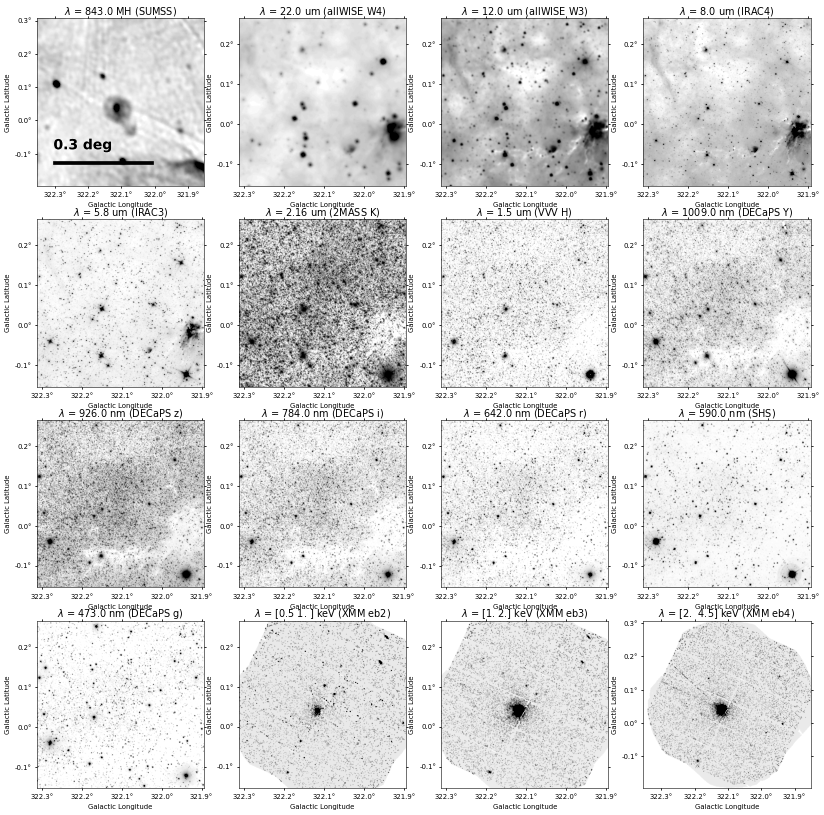

In [100]:
data_path = '/home/pmc/Documents/Zang_etal/aladin/Z3/news'

fig = plt.figure(figsize=(20, 20), dpi=50)
fig.tight_layout()

files = glob.glob(data_path+'/*.fits')
files.sort()

for i,file in zip(range(len(files)),files):
    hdu = fits.open(file)[0]
    wcs = WCS(hdu.header)
    
    ax = fig.add_subplot(4, 4, i+1, projection=wcs)
    norm = simple_norm(hdu.data, 'power', min_percent=0.5, max_percent=99.5)
    ax.imshow(hdu.data, origin='lower', norm=norm, cmap=plt.cm.gray_r, interpolation=None)
    ax.set_xlabel('Galactic Longitude', size=10)
    ax.set_ylabel('Galactic Latitude', size=10)
    ax.set_title(r'$\lambda$ = {} ({})'.format(wavelengths[i], filetrs[i]), size=14)
    
    ax.tick_params(which='major', axis='x', size=5, labelsize=10, bottom=True, top=True)
    ax.tick_params(which='major', axis='y', size=5, labelsize=10, right=True, left=True)
    ax.minorticks_on()
    
    ax.coords[0].set_major_formatter('d.d')
    ax.coords[1].set_major_formatter('d.d')

    if i == 0:
        lon, lat = wcs.wcs_pix2world([[0, 0]], 0)[0]
        lon_0p1, lat_0p1 = wcs.wcs_pix2world([[0.3 / wcs.pixel_scale_matrix[0, 0], 0]], 0)[0]
        
        ax.arrow(lon - 0.35, lat + 0.07, lon_0p1 - lon, 0, head_width=0, head_length=0,
                 fc='black',  width=0.01, transform=ax.get_transform('galactic'), zorder=2)
        text = ax.text(lon - 0.35 + (lon_0p1 - lon), lat + 0.1, '0.3 deg', color='black', fontsize=20,
                       fontweight='bold', transform=ax.get_transform('galactic'), va='bottom', ha='left')
        text.set_path_effects([withStroke(linewidth=1, foreground='white')])

plt.show()        
#plt.savefig('Z3_images.jpg', bbox_inches='tight')

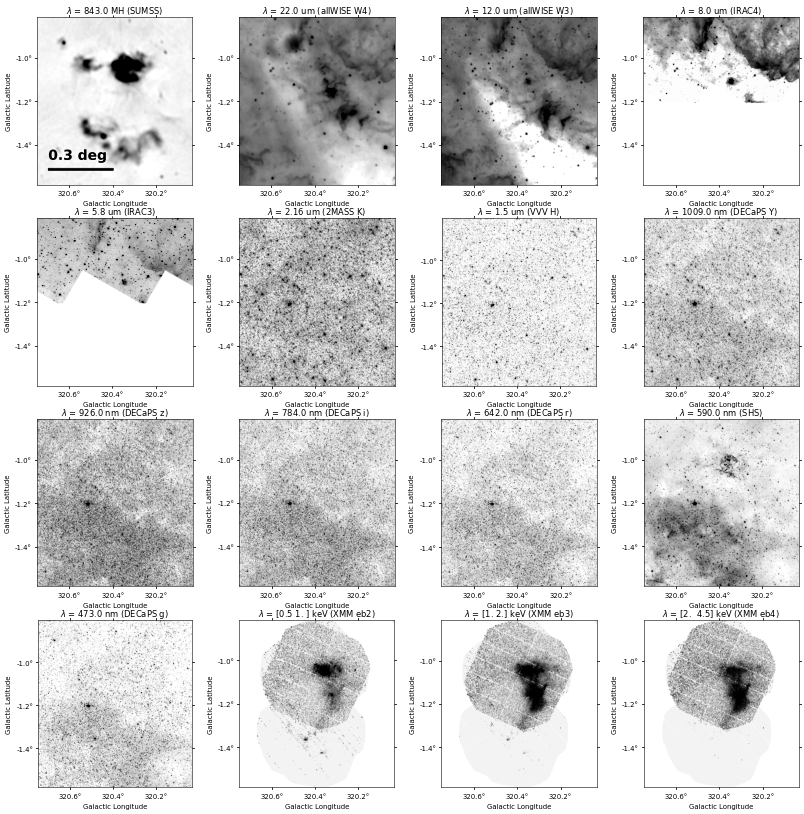

In [105]:
data_path = '/home/pmc/Documents/Zang_etal/aladin/Z4/news'

fig = plt.figure(figsize=(20, 20), dpi=50)
fig.tight_layout()

files = glob.glob(data_path+'/*.fits')
files.sort()

for i,file in zip(range(len(files)),files):
    hdu = fits.open(file)[0]
    wcs = WCS(hdu.header)
    
    ax = fig.add_subplot(4, 4, i+1, projection=wcs)
    norm = simple_norm(hdu.data, 'linear', min_percent=0.5, max_percent=99.5)
    ax.imshow(hdu.data, origin='lower', norm=norm, cmap=plt.cm.gray_r, interpolation=None)
    ax.set_xlabel('Galactic Longitude', size=10)
    ax.set_ylabel('Galactic Latitude', size=10)
    ax.set_title(r'$\lambda$ = {} ({})'.format(wavelengths[i], filetrs[i]), size=12)
    
    ax.tick_params(which='major', axis='x', size=5, labelsize=10, bottom=True, top=True)
    ax.tick_params(which='major', axis='y', size=5, labelsize=10, right=True, left=True)
    ax.minorticks_on()
    
    ax.coords[0].set_major_formatter('d.d')
    ax.coords[1].set_major_formatter('d.d')

    if i == 0:
        lon, lat = wcs.wcs_pix2world([[0, 0]], 0)[0]
        lon_0p1, lat_0p1 = wcs.wcs_pix2world([[0.3 / wcs.pixel_scale_matrix[0, 0], 0]], 0)[0]
        
        ax.arrow(lon - 0.35, lat + 0.07, lon_0p1 - lon, 0, head_width=0, head_length=0,
                 fc='black',  width=0.01, transform=ax.get_transform('galactic'), zorder=2)
        text = ax.text(lon - 0.35 + (lon_0p1 - lon), lat + 0.1, '0.3 deg', color='black', fontsize=20,
                       fontweight='bold', transform=ax.get_transform('galactic'), va='bottom', ha='left')
        text.set_path_effects([withStroke(linewidth=1, foreground='white')])
        
plt.show()
#plt.savefig('Z4_images.jpg', bbox_inches='tight')

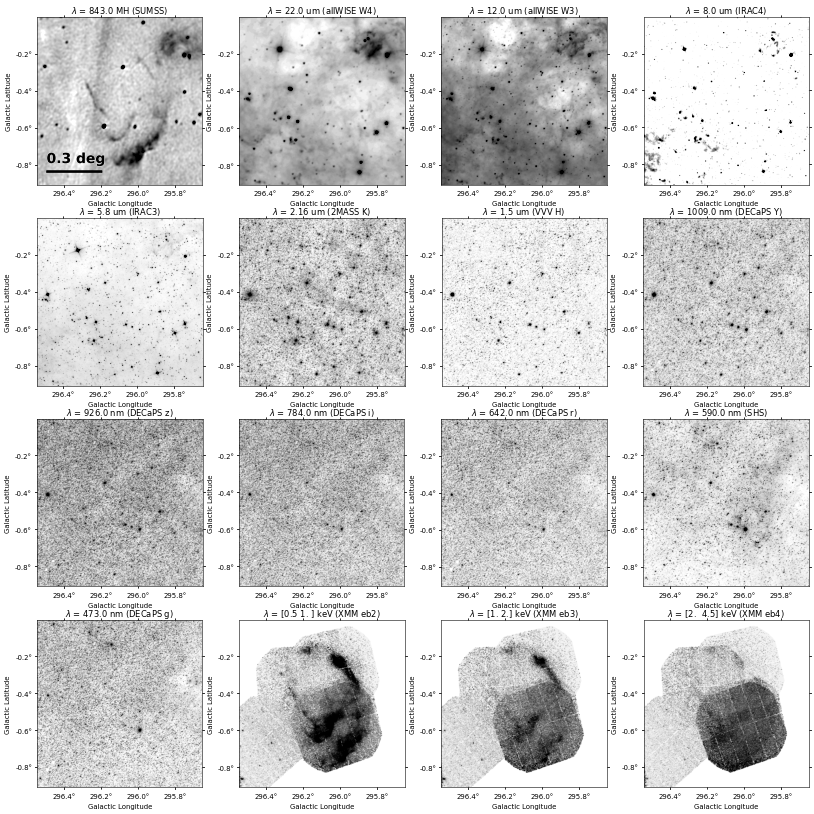

In [104]:
data_path = '/home/pmc/Documents/Zang_etal/aladin/Z5/news'

fig = plt.figure(figsize=(20, 20), dpi=50)
fig.tight_layout()

files = glob.glob(data_path + '/*.fits')
files.sort()

for i, file in enumerate(files):
    hdu = fits.open(file)[0]
    wcs = WCS(hdu.header)

    ax = fig.add_subplot(4, 4, i + 1, projection=wcs)
    norm = simple_norm(hdu.data, 'power', min_percent=0.5, max_percent=99.5)
    img = ax.imshow(hdu.data, origin='lower', norm=norm, cmap=plt.cm.gray_r, interpolation=None)
    ax.set_xlabel('Galactic Longitude', size=10)
    ax.set_ylabel('Galactic Latitude', size=10)
    ax.set_title(r'$\lambda$ = {} ({})'.format(wavelengths[i], filetrs[i]), size=12)

    ax.tick_params(which='major', axis='x', size=5, labelsize=10, bottom=True, top=True)
    ax.tick_params(which='major', axis='y', size=5, labelsize=10, right=True, left=True)
    ax.minorticks_on()

    ax.coords[0].set_major_formatter('d.d')
    ax.coords[1].set_major_formatter('d.d')
    
    
    if i == 0:
        lon, lat = wcs.wcs_pix2world([[0, 0]], 0)[0]
        lon_0p1, lat_0p1 = wcs.wcs_pix2world([[0.3 / wcs.pixel_scale_matrix[0, 0], 0]], 0)[0]
        
        ax.arrow(lon - 0.35, lat + 0.07, lon_0p1 - lon, 0, head_width=0, head_length=0,
                 fc='black',  width=0.01, transform=ax.get_transform('galactic'), zorder=2)
        text = ax.text(lon - 0.35 + (lon_0p1 - lon), lat + 0.1, '0.3 deg', color='black', fontsize=20,
                       fontweight='bold', transform=ax.get_transform('galactic'), va='bottom', ha='left')
        text.set_path_effects([withStroke(linewidth=1, foreground='white')])

plt.show()       
#plt.savefig('Z5_images.jpg', bbox_inches='tight')

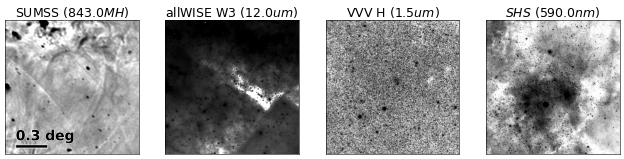

In [107]:
data_path = '/home/pmc/Documents/Zang_etal/aladin/Z1/news'

files_ = glob.glob(data_path+'/*.fits')
files_.sort()
files = [files_[0], files_[2], files_[6], files_[11]]

fil = ['\mathrm{SUMSS}', '\mathrm{allWISE\,\,W3}', '\mathrm{VVV\,\,H}', 'SHS']
wv_ = [wavelengths[0],wavelengths[2],wavelengths[6],wavelengths[11]]


fig = plt.figure(figsize=(20, 5), dpi=50)

for i,file in zip(range(len(files)),files):
    hdu = fits.open(file)[0]
    wcs = WCS(hdu.header)
    
    ax = fig.add_subplot(1,5, i+1, projection=wcs)
    norm = simple_norm(hdu.data, 'asinh', min_percent=0.5, max_percent=99.5)
    ax.imshow(hdu.data, origin='lower', norm=norm, cmap=plt.cm.gray_r, interpolation=None)
    
    ax.coords[0].set_major_formatter('d.d')
    ax.coords[1].set_major_formatter('d.d')
    #ax.set_xticks([])
    #ax.set_yticks([])
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    
    ax.coords[0].set_ticks_visible(False)
    ax.coords[1].set_ticks_visible(False)
    ax.coords[0].set_ticklabel_visible(False)
    ax.coords[1].set_ticklabel_visible(False)
    
    ax.set_title(r'${}\,\,({})$'.format(fil[i], wv_[i]), size=18)
    #ax.plot(hdu.data.shape[1] // 2, hdu.data.shape[0] // 2, color='red', marker='+', markersize=16, mew=1)

    if i == 0:
        lon, lat = wcs.wcs_pix2world([[0, 0]], 0)[0]
        lon_0p1, lat_0p1 = wcs.wcs_pix2world([[0.3 / wcs.pixel_scale_matrix[0, 0], 0]], 0)[0]
        
        ax.arrow(lon - 0.4, lat + 0.07, lon_0p1 - lon, 0, head_width=0, head_length=0,
                 fc='black', ec='white', width=0.03, transform=ax.get_transform('galactic'), zorder=2)
        text = ax.text(lon - 0.4 + (lon_0p1 - lon), lat + 0.1, '0.3 deg', color='black', fontsize=20,
                       fontweight='bold', transform=ax.get_transform('galactic'), va='bottom', ha='left')
        text.set_path_effects([withStroke(linewidth=1.2, foreground='white')])
    
#plt.savefig('Z1_aladin_new.jpg', bbox_inches='tight')

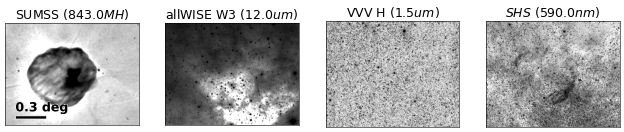

In [109]:
data_path = '/home/pmc/Documents/Zang_etal/aladin/Z2/news'

files_ = glob.glob(data_path+'/*.fits')
files_.sort()
files = [files_[0], files_[2], files_[6], files_[11]]

fil = ['\mathrm{SUMSS}', '\mathrm{allWISE\,\,W3}', '\mathrm{VVV\,\,H}', 'SHS']
wv_ = [wavelengths[0],wavelengths[2],wavelengths[6],wavelengths[11]]


fig = plt.figure(figsize=(20, 5), dpi=50)

for i,file in zip(range(len(files)),files):
    hdu = fits.open(file)[0]
    wcs = WCS(hdu.header)
    
    ax = fig.add_subplot(1,5, i+1, projection=wcs)
    norm = simple_norm(hdu.data, 'asinh', min_percent=0.5, max_percent=99.5)
    ax.imshow(hdu.data, origin='lower', norm=norm, cmap=plt.cm.gray_r, interpolation=None)
    
    ax.coords[0].set_major_formatter('d.d')
    ax.coords[1].set_major_formatter('d.d')
    #ax.set_xticks([])
    #ax.set_yticks([])
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    
    ax.coords[0].set_ticks_visible(False)
    ax.coords[1].set_ticks_visible(False)
    ax.coords[0].set_ticklabel_visible(False)
    ax.coords[1].set_ticklabel_visible(False)
    
    ax.set_title(r'${}\,\,({})$'.format(fil[i], wv_[i]), size=18)
    #ax.plot(hdu.data.shape[1] // 2, hdu.data.shape[0] // 2, color='red', marker='+', markersize=16, mew=1)

    if i == 0:
        lon, lat = wcs.wcs_pix2world([[0, 0]], 0)[0]
        lon_0p1, lat_0p1 = wcs.wcs_pix2world([[0.3 / wcs.pixel_scale_matrix[0, 0], 0]], 0)[0]
        
        ax.arrow(lon - 0.4, lat + 0.07, lon_0p1 - lon, 0, head_width=0, head_length=0,
                 fc='black', ec='white', width=0.03, transform=ax.get_transform('galactic'), zorder=2)
        text = ax.text(lon - 0.4 + (lon_0p1 - lon), lat + 0.1, '0.3 deg', color='black', fontsize=18,
                       fontweight='bold', transform=ax.get_transform('galactic'), va='bottom', ha='left')
        text.set_path_effects([withStroke(linewidth=1.2, foreground='white')])

#plt.savefig('Z2_aladin_new.jpg', bbox_inches='tight')

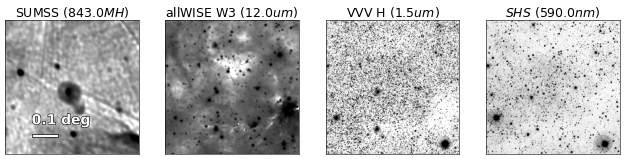

In [110]:
data_path = '/home/pmc/Documents/Zang_etal/aladin/Z3/news'

files_ = glob.glob(data_path+'/*.fits')
files_.sort()
files = [files_[0], files_[2], files_[6], files_[11]]

fil = ['\mathrm{SUMSS}', '\mathrm{allWISE\,\,W3}', '\mathrm{VVV\,\,H}', 'SHS']
wv_ = [wavelengths[0],wavelengths[2],wavelengths[6],wavelengths[11]]


fig = plt.figure(figsize=(20, 5), dpi=50)

for i,file in zip(range(len(files)),files):
    hdu = fits.open(file)[0]
    wcs = WCS(hdu.header)
    
    ax = fig.add_subplot(1,5, i+1, projection=wcs)
    norm = simple_norm(hdu.data, 'asinh', min_percent=0.5, max_percent=99.5)
    ax.imshow(hdu.data, origin='lower', norm=norm, cmap=plt.cm.gray_r, interpolation=None)
    ax.coords[0].set_major_formatter('d.d')
    ax.coords[1].set_major_formatter('d.d')
    #ax.set_xticks([])
    #ax.set_yticks([])
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    
    ax.coords[0].set_ticks_visible(False)
    ax.coords[1].set_ticks_visible(False)
    ax.coords[0].set_ticklabel_visible(False)
    ax.coords[1].set_ticklabel_visible(False)
    
    ax.set_title(r'${}\,\,({})$'.format(fil[i], wv_[i]), size=18)
    #ax.plot(hdu.data.shape[1] // 2, hdu.data.shape[0] // 2, color='red', marker='+', markersize=16, mew=1)

    if i == 0:
        lon, lat = wcs.wcs_pix2world([[0, 0]], 0)[0]
        lon_0p1, lat_0p1 = wcs.wcs_pix2world([[0.1 / wcs.pixel_scale_matrix[0, 0], 0]], 0)[0]
        
        ax.arrow(lon - 0.2, lat + 0.07, lon_0p1 - lon, 0, head_width=0, head_length=0,
                 fc='white', ec='black', width=0.01, transform=ax.get_transform('galactic'), zorder=2)
        text = ax.text(lon - 0.2 + (lon_0p1 - lon), lat + 0.1, '0.1 deg', color='white', fontsize=20,
                       fontweight='bold', transform=ax.get_transform('galactic'), va='bottom', ha='left')
        text.set_path_effects([withStroke(linewidth=1.6, foreground='black')])
    
#plt.savefig('Z3_aladin_new.jpg', bbox_inches='tight')

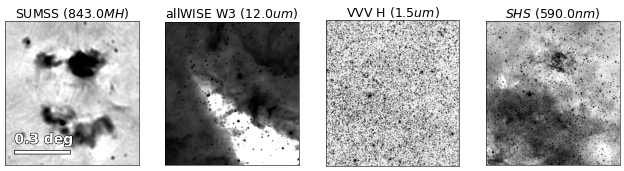

In [111]:
data_path = '/home/pmc/Documents/Zang_etal/aladin/Z4/news'

files_ = glob.glob(data_path+'/*.fits')
files_.sort()
files = [files_[0], files_[2], files_[6], files_[11]]

fil = ['\mathrm{SUMSS}', '\mathrm{allWISE\,\,W3}', '\mathrm{VVV\,\,H}', 'SHS']
wv_ = [wavelengths[0],wavelengths[2],wavelengths[6],wavelengths[11]]


fig = plt.figure(figsize=(20, 5), dpi=50)

for i,file in zip(range(len(files)),files):
    hdu = fits.open(file)[0]
    wcs = WCS(hdu.header)
    
    ax = fig.add_subplot(1,5, i+1, projection=wcs)
    norm = simple_norm(hdu.data, 'asinh', min_percent=0.5, max_percent=99.5)
    ax.imshow(hdu.data, origin='lower', norm=norm, cmap=plt.cm.gray_r, interpolation=None)
    
    ax.coords[0].set_major_formatter('d.d')
    ax.coords[1].set_major_formatter('d.d')
    #ax.set_xticks([])
    #ax.set_yticks([])
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    
    ax.coords[0].set_ticks_visible(False)
    ax.coords[1].set_ticks_visible(False)
    ax.coords[0].set_ticklabel_visible(False)
    ax.coords[1].set_ticklabel_visible(False)
    
    ax.set_title(r'${}\,\,({})$'.format(fil[i], wv_[i]), size=18)
    #ax.plot(hdu.data.shape[1] // 2, hdu.data.shape[0] // 2, color='red', marker='+', markersize=16, mew=1)

    if i == 0:
        lon, lat = wcs.wcs_pix2world([[0, 0]], 0)[0]
        lon_0p1, lat_0p1 = wcs.wcs_pix2world([[0.3 / wcs.pixel_scale_matrix[0, 0], 0]], 0)[0]
        
        ax.arrow(lon - 0.35, lat + 0.07, lon_0p1 - lon, 0, head_width=0, head_length=0,
                 fc='white', ec='black', width=0.02, transform=ax.get_transform('galactic'), zorder=2)
        text = ax.text(lon - 0.35 + (lon_0p1 - lon), lat + 0.1, '0.3 deg', color='white', fontsize=20,
                       fontweight='bold', transform=ax.get_transform('galactic'), va='bottom', ha='left')
        text.set_path_effects([withStroke(linewidth=1.6, foreground='black')])
    
#plt.savefig('Z4_aladin_new.jpg', bbox_inches='tight')

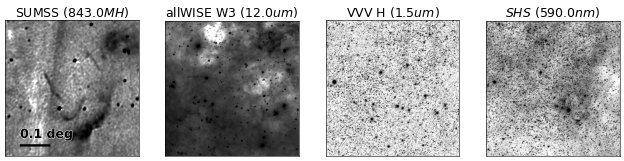

In [112]:
data_path = '/home/pmc/Documents/Zang_etal/aladin/Z5/news'

files_ = glob.glob(data_path+'/*.fits')
files_.sort()
files = [files_[0], files_[2], files_[6], files_[11]]

fil = ['\mathrm{SUMSS}', '\mathrm{allWISE\,\,W3}', '\mathrm{VVV\,\,H}', 'SHS']
wv_ = [wavelengths[0],wavelengths[2],wavelengths[6],wavelengths[11]]

fig = plt.figure(figsize=(20, 5), dpi=50)

for i, file in enumerate(files):
    hdu = fits.open(file)[0]
    wcs = WCS(hdu.header)
    
    ax = fig.add_subplot(1, 5, i + 1, projection=wcs)
    norm = simple_norm(hdu.data, 'asinh', min_percent=0.5, max_percent=99.5)
    ax.imshow(hdu.data, origin='lower', norm=norm, cmap=plt.cm.gray_r, interpolation=None)
    ax.coords[0].set_major_formatter('d.d')
    ax.coords[1].set_major_formatter('d.d')
    #ax.set_xticks([])
    #ax.set_yticks([])
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    
    ax.coords[0].set_ticks_visible(False)
    ax.coords[1].set_ticks_visible(False)
    ax.coords[0].set_ticklabel_visible(False)
    ax.coords[1].set_ticklabel_visible(False)
    
    ax.set_title(r'${}\,\,({})$'.format(fil[i], wv_[i]), size=18)
    #ax.plot(hdu.data.shape[1] // 2, hdu.data.shape[0] // 2, color='red', marker='+', markersize=16, mew=1)

    if i == 0:
        lon, lat = wcs.wcs_pix2world([[0, 0]], 0)[0]
        lon_0p1, lat_0p1 = wcs.wcs_pix2world([[0.2 / wcs.pixel_scale_matrix[0, 0], 0]], 0)[0]
        
        ax.arrow(lon - 0.3, lat + 0.07, lon_0p1 - lon, 0, head_width=0, head_length=0,
                 fc='black', ec='black', width=0.01, transform=ax.get_transform('galactic'), zorder=2)
        text = ax.text(lon - 0.3 + (lon_0p1 - lon), lat + 0.1, '0.1 deg', color='black', fontsize=18,
                       fontweight='bold', transform=ax.get_transform('galactic'), va='bottom', ha='left')
        text.set_path_effects([withStroke(linewidth=1.2, foreground='white')])
        
#plt.savefig('Z5_aladin_new.jpg', bbox_inches='tight')

In [113]:
hdu_1 = fits.open('aladin/Z1/news/o_z1_XMM_eb3.fits')[0]
hdu_2 = fits.open('aladin/Z2/news/o_z2_xmm_eb3.fits')[0]
hdu_3 = fits.open('aladin/Z3/news/o_z3_xmm_eb3.fits')[0]
hdu_4 = fits.open('aladin/Z4/news/o_z4_xmm_eb3.fits')[0]
hdu_5 = fits.open('aladin/Z5/news/o_z5_xmm_eb3.fits')[0]
vvv_1 = fits.open('aladin/Z1/news/g_z1_vvv_H.fits')[0]
vvv_2 = fits.open('aladin/Z2/news/g_z2_vvv_H.fits')[0]
vvv_3 = fits.open('aladin/Z3/news/g_z3_vvv_H.fits')[0]
vvv_4 = fits.open('aladin/Z4/news/g_z4_vvv_H.fits')[0]
vvv_5 = fits.open('aladin/Z5/news/g_z5_vvv_H.fits')[0]

wcs_1 = WCS(hdu_1.header)
wcs_2 = WCS(hdu_2.header)
wcs_3 = WCS(hdu_3.header)
wcs_4 = WCS(hdu_4.header)
wcs_5 = WCS(hdu_5.header)
wcs_v1 = WCS(vvv_1.header)
wcs_v2 = WCS(vvv_2.header)
wcs_v3 = WCS(vvv_3.header)
wcs_v4 = WCS(vvv_4.header)
wcs_v5 = WCS(vvv_5.header)
wcs_s = WCS(header=hdu_1.header)

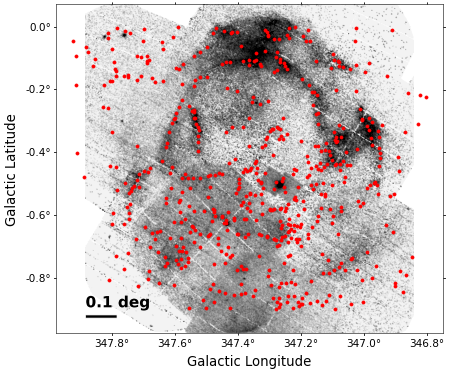

In [115]:
fig = plt.figure(figsize=(10, 10), dpi=50)

ax = fig.add_subplot(111, projection=wcs_1)
norm = simple_norm(hdu_1.data, 'power', min_percent=0.5, max_percent=99.5)
ax.imshow(hdu_1.data, origin='lower', norm=norm, cmap=plt.cm.gray_r, interpolation=None)

# Scatter plot
ax.scatter(dZ1['l_LONG'],dZ1['b_LAT'], s=20, c='red', label='Zang+21',transform=ax.get_transform('galactic'))
#ax.scatter(Z1['GAL_LONG'],Z1['GAL_LAT'],s=65,marker='X',fc='yellow',ec='green',label='eRosita',transform=ax.get_transform('galactic'))

ax.set_xlabel('Galactic Longitude', size=19)
ax.set_ylabel('Galactic Latitude', size=19)
ax.coords[0].set_major_formatter('d.d')
ax.coords[1].set_major_formatter('d.d')
ax.minorticks_on()
ax.tick_params(which='major', axis='x', size=7, labelsize=15, bottom=True, top=True)
ax.tick_params(which='major', axis='y', size=7, labelsize=15, right=True, left=True)
ax.set_xticks(ax.get_xticks(minor=True), minor=True)
ax.set_yticks(ax.get_yticks(minor=True), minor=True)


# Calculate the length of the line for 0.1 degree size based on the actual scale of the subplot
lon, lat = wcs_1.wcs_pix2world([[0, 0]], 0)[0]
lon_0p1, lat_0p1 = wcs_1.wcs_pix2world([[0.1 / wcs_1.pixel_scale_matrix[0, 0], 0]], 0)[0]

ax.arrow(lon - 0.1, lat + 0.05, lon_0p1 - lon, 0, head_width=0, head_length=0,
         fc='black', ec='white', width=0.01, transform=ax.get_transform('world'))
text = ax.text(lon - 0.1 + (lon_0p1 - lon), lat + 0.07, '0.1 deg', color='black', fontsize=22, fontweight='bold',
               transform=ax.get_transform('world'), va='bottom', ha='left')
text.set_path_effects([withStroke(linewidth=1.2, foreground='white')])
    
#plt.savefig('Z1_withdata.jpg', bbox_inches='tight')

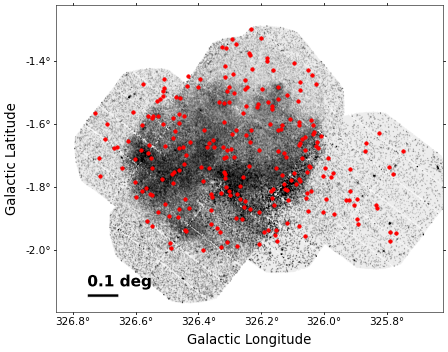

In [116]:
fig = plt.figure(figsize=(10,10), dpi=50)

ax = fig.add_subplot(111, projection=wcs_2)
norm = simple_norm(hdu_2.data, 'power', min_percent=0.5, max_percent=99.5)
ax.imshow(hdu_2.data, origin='lower', norm=norm, cmap=plt.cm.gray_r, interpolation=None)

# Scatter plot
ax.scatter(dZ2['l_LONG'],dZ2['b_LAT'], s=25, c='red', label='Zang+21',transform=ax.get_transform('galactic'))
#ax.scatter(Z2['GAL_LONG'],Z2['GAL_LAT'],s=65,marker='X',fc='yellow',ec='green',label='eRosita',transform=ax.get_transform('galactic'))

ax.set_xlabel('Galactic Longitude', size=19)
ax.set_ylabel('Galactic Latitude', size=19)
ax.coords[0].set_major_formatter('d.d')
ax.coords[1].set_major_formatter('d.d')
ax.minorticks_on()
ax.minorticks_on()
ax.tick_params(which='major', axis='x', size=7, labelsize=15, bottom=True, top=True)
ax.tick_params(which='major', axis='y', size=7, labelsize=15, right=True, left=True)
ax.minorticks_on()

ax.set_xticks(ax.get_xticks(minor=True), minor=True)
ax.set_yticks(ax.get_yticks(minor=True), minor=True)
ax.coords[0].set_major_formatter('d.d')
ax.coords[1].set_major_formatter('d.d')

# Calculate the length of the line for 0.1 degree size based on the actual scale of the subplot
lon, lat = wcs_2.wcs_pix2world([[0, 0]], 0)[0]
lon_0p1, lat_0p1 = wcs_2.wcs_pix2world([[0.1 / wcs_2.pixel_scale_matrix[0, 0], 0]], 0)[0]

ax.arrow(lon - 0.2, lat + 0.05, lon_0p1 - lon, 0, head_width=0, head_length=0,
         fc='black', ec='white', width=0.01, transform=ax.get_transform('world'))
text = ax.text(lon - 0.2 + (lon_0p1 - lon), lat + 0.07, '0.1 deg', color='black', fontsize=22, fontweight='bold',
               transform=ax.get_transform('world'), va='bottom', ha='left')
text.set_path_effects([withStroke(linewidth=1.2, foreground='white')])


#plt.tight_layout()
#plt.savefig('Z2_withdata.jpg', bbox_inches='tight')

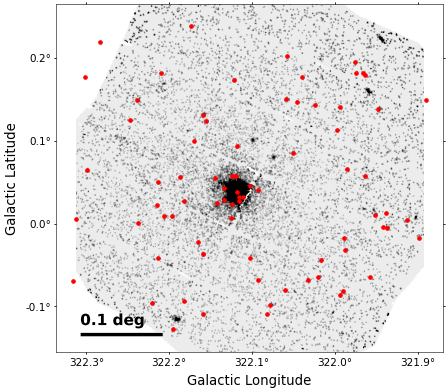

In [117]:
fig = plt.figure(figsize=(10, 10), dpi=50)

ax = fig.add_subplot(111, projection=wcs_3)
norm = simple_norm(hdu_3.data, 'power', min_percent=0.5, max_percent=99.5)
ax.imshow(hdu_3.data, origin='lower', norm=norm, cmap=plt.cm.gray_r, interpolation=None)

# Scatter plot
ax.scatter(dZ3['l_LONG'],dZ3['b_LAT'], s=30, c='red', label='Zang+21',transform=ax.get_transform('galactic'))
#ax.scatter(Z3['GAL_LONG'],Z3['GAL_LAT'],s=65,marker='X',fc='yellow',ec='green',label='eRosita',transform=ax.get_transform('galactic'))

ax.set_xlabel('Galactic Longitude', size=19)
ax.set_ylabel('Galactic Latitude', size=19)
ax.coords[0].set_major_formatter('d.d')
ax.coords[1].set_major_formatter('d.d')
ax.minorticks_on()
ax.minorticks_on()
ax.tick_params(which='major', axis='x', size=7, labelsize=15, bottom=True, top=True)
ax.tick_params(which='major', axis='y', size=7, labelsize=15, right=True, left=True)
ax.minorticks_on()
ax.set_xticks(ax.get_xticks(minor=True), minor=True)
ax.set_yticks(ax.get_yticks(minor=True), minor=True)
ax.coords[0].set_major_formatter('d.d')
ax.coords[1].set_major_formatter('d.d')

# Calculate the length of the line for 0.1 degree size based on the actual scale of the subplot
lon, lat = wcs_3.wcs_pix2world([[0, 0]], 0)[0]
lon_0p1, lat_0p1 = wcs_3.wcs_pix2world([[0.1 / wcs_3.pixel_scale_matrix[0, 0], 0]], 0)[0]

ax.arrow(lon - 0.105, lat + 0.02, lon_0p1 - lon, 0, head_width=0, head_length=0,
         fc='black', ec='white', width=0.005, transform=ax.get_transform('world'))
text = ax.text(lon - 0.105 + (lon_0p1 - lon), lat +0.028, '0.1 deg', color='black', fontsize=22, fontweight='bold',
               transform=ax.get_transform('world'), va='bottom', ha='left')
text.set_path_effects([withStroke(linewidth=1.2, foreground='white')])


#plt.tight_layout()
#plt.savefig('Z3_withdata.jpg', bbox_inches='tight')

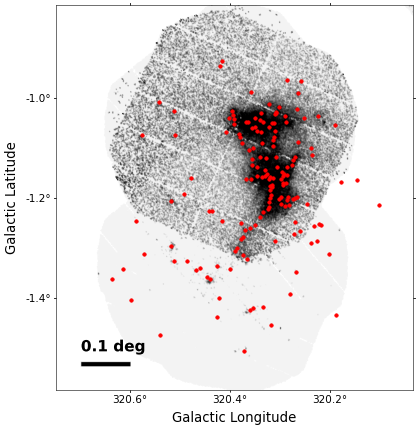

In [118]:
fig = plt.figure(figsize=(10, 10), dpi=50)

ax = fig.add_subplot(111, projection=wcs_4)
norm = simple_norm(hdu_4.data, 'power', min_percent=0.5, max_percent=99.5)
ax.imshow(hdu_4.data, origin='lower', norm=norm, cmap=plt.cm.gray_r, interpolation=None)

# Scatter plot
ax.scatter(dZ4['l_LONG'],dZ4['b_LAT'], s=25, c='red', label='Zang+21',transform=ax.get_transform('galactic'))
#ax.scatter(Z4['GAL_LONG'],Z4['GAL_LAT'],s=65,marker='X',fc='yellow',ec='green',label='eRosita',transform=ax.get_transform('galactic'))


ax.set_xlabel('Galactic Longitude', size=19)
ax.set_ylabel('Galactic Latitude', size=19)
ax.coords[0].set_major_formatter('d.d')
ax.coords[1].set_major_formatter('d.d')
ax.minorticks_on()
ax.minorticks_on()
ax.tick_params(which='major', axis='x', size=7, labelsize=15, bottom=True, top=True)
ax.tick_params(which='major', axis='y', size=7, labelsize=15, right=True, left=True)
ax.minorticks_on()
ax.set_xticks(ax.get_xticks(minor=True), minor=True)
ax.set_yticks(ax.get_yticks(minor=True), minor=True)
ax.coords[0].set_major_formatter('d.d')
ax.coords[1].set_major_formatter('d.d')


# Calculate the length of the line for 0.1 degree size based on the actual scale of the subplot
lon, lat = wcs_4.wcs_pix2world([[0, 0]], 0)[0]
lon_0p1, lat_0p1 = wcs_4.wcs_pix2world([[0.1 / wcs_4.pixel_scale_matrix[0, 0], 0]], 0)[0]

ax.arrow(lon - 0.15, lat + 0.05, lon_0p1 - lon, 0, head_width=0, head_length=0,
         fc='black', ec='white', width=0.01, transform=ax.get_transform('world'))
text = ax.text(lon - 0.15 + (lon_0p1 - lon), lat + 0.07, '0.1 deg', color='black', fontsize=22, fontweight='bold',
               transform=ax.get_transform('world'), va='bottom', ha='left')
text.set_path_effects([withStroke(linewidth=1.2, foreground='white')])


#plt.tight_layout()
#plt.savefig('Z4_withdata.jpg', bbox_inches='tight')

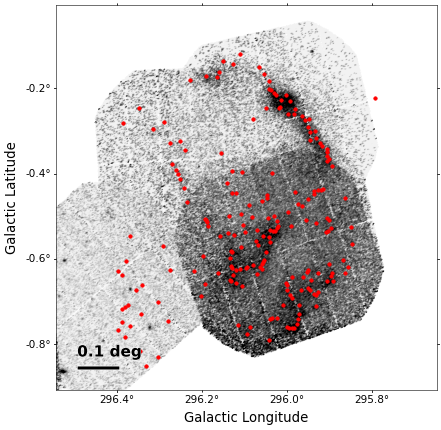

In [119]:
fig = plt.figure(figsize=(10, 10), dpi=50)

ax = fig.add_subplot(111, projection=wcs_5)
norm = simple_norm(hdu_5.data, 'power', min_percent=0.5, max_percent=99.5)
ax.imshow(hdu_5.data, origin='lower', norm=norm, cmap=plt.cm.gray_r, interpolation=None)

# Scatter plot
ax.scatter(dZ5['l_LONG'],dZ5['b_LAT'], s=25, c='red', label='Zang+21',transform=ax.get_transform('galactic'))
#ax.scatter(Z5['GAL_LONG'],Z5['GAL_LAT'],s=65,marker='X',fc='yellow',ec='green',label='eRosita',transform=ax.get_transform('galactic'))

ax.set_xlabel('Galactic Longitude', size=19)
ax.set_ylabel('Galactic Latitude', size=19)

ax.coords[0].set_major_formatter('d.d')
ax.coords[1].set_major_formatter('d.d')
ax.minorticks_on()
ax.minorticks_on()
ax.tick_params(which='major', axis='x', size=7, labelsize=15, bottom=True, top=True)
ax.tick_params(which='major', axis='y', size=7, labelsize=15, right=True, left=True)
ax.minorticks_on()
ax.set_xticks(ax.get_xticks(minor=True), minor=True)
ax.set_yticks(ax.get_yticks(minor=True), minor=True)
ax.coords[0].set_major_formatter('d.d')
ax.coords[1].set_major_formatter('d.d')

# Calculate the length of the line for 0.1 degree size based on the actual scale of the subplot
lon, lat = wcs_5.wcs_pix2world([[0, 0]], 0)[0]
lon_0p1, lat_0p1 = wcs_5.wcs_pix2world([[0.1 / wcs_5.pixel_scale_matrix[0, 0], 0]], 0)[0]

ax.arrow(lon - 0.15, lat + 0.05, lon_0p1 - lon, 0, head_width=0, head_length=0,
         fc='black', ec='white', width=0.009, transform=ax.get_transform('world'))
text = ax.text(lon - 0.15 + (lon_0p1 - lon), lat + 0.07, '0.1 deg', color='black', fontsize=22, fontweight='bold',
               transform=ax.get_transform('world'), va='bottom', ha='left')
text.set_path_effects([withStroke(linewidth=1.2, foreground='white')])

#plt.tight_layout()
#plt.savefig('Z5_withdata.jpg', bbox_inches='tight')

In [120]:
from sklearn.neighbors import KernelDensity
from scipy.stats import gaussian_kde

kde_params = {
    'bandwidth': 0.05,
    'kernel': 'gaussian'
}

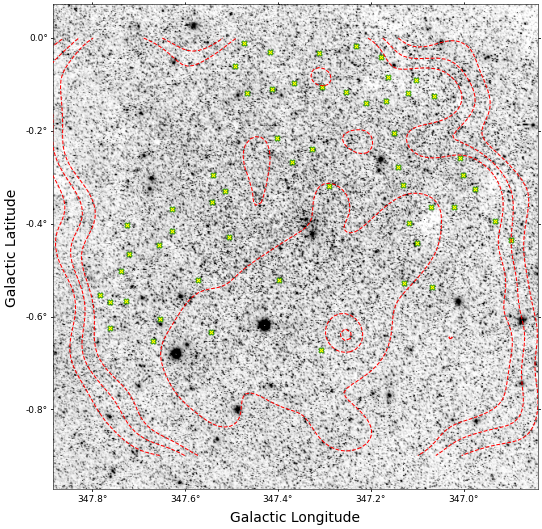

In [124]:
#### REPIT FOR OTHER ZONES ########

fig = plt.figure(figsize=(10, 10), dpi=50)
ax = fig.add_subplot(111, projection=wcs_v1)
norm = simple_norm(vvv_1.data, 'power', min_percent=0.5, max_percent=99.5)
ax.imshow(vvv_1.data, origin='lower', norm=norm, cmap=plt.cm.gray_r, interpolation=None)
ax.set_xlabel('Galactic Longitude', size=20)
ax.set_ylabel('Galactic Latitude', size=20)
ax.coords[0].set_major_formatter('d.d')
ax.coords[1].set_major_formatter('d.d')

# Add arrow and text
#ax.arrow(296.3, -0.73, 0.1, 0, head_width=0, head_length=0, fc='black', ec='white', width=0.01, transform=ax.get_transform('galactic'))
#text = ax.text(296.2, -0.73, '0.1 deg', color='black', fontsize=20, fontweight='bold', transform=ax.get_transform('galactic'), va='center', ha='right')
#text.set_path_effects([withStroke(linewidth=1.5, foreground='white')])

ax.scatter(Z1['GAL_LONG'], Z1['GAL_LAT'], s=65, marker='X', fc='yellow', ec='green', label='eRosita', transform=ax.get_transform('galactic'))

#-------------------------------------------------- With contours --> Zhang21
levels = [0.1,0.15,0.2,0.50,0.90, 0.99]
Nx, Ny = 100, 100  #resolution of your density map, basically the pixel size
_xmin=min(aZ1['l_LONG'])
_xmax=max(aZ1['l_LONG'])
_ymin=min(aZ1['b_LAT'])
_ymax=max(aZ1['b_LAT'])

xx, yy = np.meshgrid(np.linspace(_xmin, _xmax, Nx), np.linspace(_ymin, _ymax, Ny))
Xgrid = np.vstack(map(np.ravel, [xx, yy])).T

X = np.column_stack((aZ1['l_LONG'], aZ1['b_LAT']))
kde1 = KernelDensity(**kde_params)
log_dens1 = kde1.fit(X).score_samples(Xgrid)
dens1 = X.shape[0]*np.exp(log_dens1).reshape((Ny, Nx))
z = (dens1 - dens1.min())/(dens1.max() - dens1.min())

plt.contour(xx,yy, z, levels=levels, colors='red', linewidths=1.5, linestyles='dashed', transform=ax.get_transform('galactic'))

# Set minor ticks
ax.minorticks_on()
ax.minorticks_on()
ax.tick_params(which='major', axis='x', size=5, labelsize=13, bottom=True, top=True)
ax.tick_params(which='major', axis='y', size=5, labelsize=13, right=True, left=True)
ax.minorticks_on()

ax.set_xticks(ax.get_xticks(minor=True), minor=True)
ax.set_yticks(ax.get_yticks(minor=True), minor=True)
ax.coords[0].set_major_formatter('d.d')

# Add legend if desired
# ax.legend()


plt.tight_layout()
plt.savefig('Z1_countordata.jpg', bbox_inches='tight')

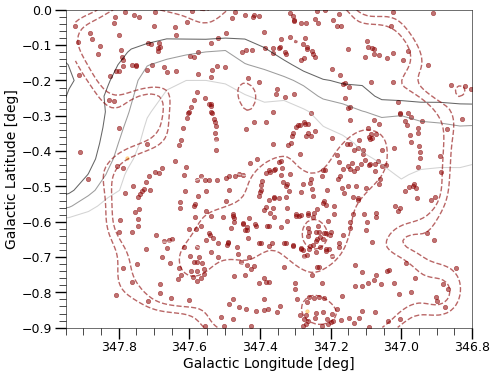

In [127]:
fig = plt.figure(figsize=(10,10), dpi=50)

ax = fig.add_subplot(111,aspect='equal') #projection=wcs --> changes the ticks to sexadecimal
ax.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg', lw=0.5)
ax.scatter(nirgc['GAL_LONG'], nirgc['GAL_LAT'], s=25, c='orange', label='NIRGC', alpha=0.4)
ax.scatter(dZ1['l_LONG'], dZ1['b_LAT'], s=40, c='darkred', label='Zang+21', alpha=0.55)
#ax.scatter(ds['GAL_LONG'],ds['GAL_LAT'],s=90,marker='X',facecolor='darkgreen',alpha=0.5,edgecolor='darkgreen',label='eRosita')
#ax.contour(hdu_1.data, levels=np.logspace(-4.7, -3., 10), colors='black', alpha=0.5)
ax.set_xlabel('Galactic Longitude [deg]', fontsize=20)
ax.set_ylabel('Galactic Latitude [deg]', fontsize=20)
#plt.grid(True, alpha=0.5)
ax.set_xlim(347.95,346.8)
ax.set_ylim(-0.9,0.0)

##-------------------------------------------------- With contours --> eRosita
#levels = [0.15,0.50,0.70,0.90,0.99]
#Nx, Ny = 100, 100 # resolution of your density map, basically the pixel size
#_xmin=min(Z1['GAL_LONG'])
#_xmax=max(Z1['GAL_LONG'])
#_ymin=min(Z1['GAL_LAT'])
#_ymax=max(Z1['GAL_LAT'])
#
#xx, yy = np.meshgrid(np.linspace(_xmin, _xmax, Nx), np.linspace(_ymin, _ymax, Ny))
#Xgrid = np.vstack(map(np.ravel, [xx, yy])).T
#
#X = np.column_stack((Z1['GAL_LONG'], Z1['GAL_LAT']))
#kde1 = KernelDensity(**kde_params)
#log_dens1 = kde1.fit(X).score_samples(Xgrid)
#dens1 = X.shape[0]*np.exp(log_dens1).reshape((Ny, Nx))
#z = (dens1 - dens1.min())/(dens1.max() - dens1.min())
#
#plt.contour(xx,yy, z, levels=levels, colors='darkgreen', linewidths=1,linestyles='dashed', alpha=0.6)
#-------------------------------------------------- With contours --> Zhang21
levels = [0.10,0.15,0.50,0.90]

Nx, Ny = 100, 100 # resolution of your density map, basically the pixel size
_xmin=min(dZ1['l_LONG'])
_xmax=max(dZ1['l_LONG'])
_ymin=min(dZ1['b_LAT'])
_ymax=max(dZ1['b_LAT'])

xx, yy = np.meshgrid(np.linspace(_xmin, _xmax, Nx), np.linspace(_ymin, _ymax, Ny))
Xgrid = np.vstack(map(np.ravel, [xx, yy])).T

X = np.column_stack((dZ1['l_LONG'], dZ1['b_LAT']))
kde1 = KernelDensity(**kde_params)
log_dens1 = kde1.fit(X).score_samples(Xgrid)
dens1 = X.shape[0]*np.exp(log_dens1).reshape((Ny, Nx))
z = (dens1 - dens1.min())/(dens1.max() - dens1.min())

plt.contour(xx,yy, z, levels=levels, colors='darkred', linewidths=2,linestyles='dashed', alpha=0.6)
#--------------------------------------------------
ax.minorticks_on()
ax.tick_params(which='major', size=16, labelsize=18, width=2)
ax.tick_params(which='minor', size=10, width=1)

plt.tight_layout()
#plt.savefig('Z1_map_zoom.jpg', bbox_inches='tight')

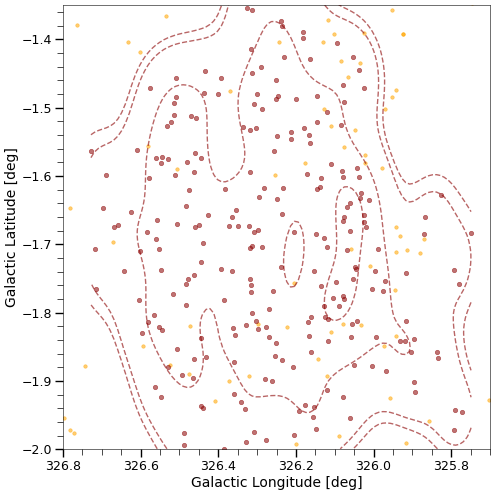

In [129]:
fig = plt.figure(figsize=(10,10), dpi=50)

ax = fig.add_subplot(111)
ax.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg', lw=0.5)
ax.scatter(nirgc['GAL_LONG'], nirgc['GAL_LAT'], s=25, c='orange', label='NIRGC', alpha=0.55)
#ax.scatter(gal_fer['l_LONG'], gal_fer['b_LAT'], s=30, c='black' , marker='s', label='d022 gal' )
ax.scatter(disc['l_LONG'], disc['b_LAT'], s=40, c='darkred', label='Zang+21', alpha=0.55)
#ax.scatter(ds['GAL_LONG'],ds['GAL_LAT'],s=90,marker='X',facecolor='darkgreen',alpha=0.5,edgecolor='darkgreen',label='eRosita')
ax.set_xlabel('Galactic Longitude [deg]', fontsize=20)
ax.set_ylabel('Galactic Latitude [deg]', fontsize=20)
ax.set_xlim(326.8,325.7)
ax.set_ylim(-2,-1.35)

##-------------------------------------------------- With contours --> eRosita
#levels = [0.10,0.15,0.50,0.90]
#Nx, Ny = 100, 100 # resolution of your density map, basically the pixel size
#_xmin=min(Z2['GAL_LONG'])
#_xmax=max(Z2['GAL_LONG'])
#_ymin=min(Z2['GAL_LAT'])
#_ymax=max(Z2['GAL_LAT'])
#
#xx, yy = np.meshgrid(np.linspace(_xmin, _xmax, Nx), np.linspace(_ymin, _ymax, Ny))
#Xgrid = np.vstack(map(np.ravel, [xx, yy])).T
#
#X = np.column_stack((Z2['GAL_LONG'], Z2['GAL_LAT']))
#kde1 = KernelDensity(**kde_params)
#log_dens1 = kde1.fit(X).score_samples(Xgrid)
#dens1 = X.shape[0]*np.exp(log_dens1).reshape((Ny, Nx))
#z = (dens1 - dens1.min())/(dens1.max() - dens1.min())
#
#plt.contour(xx,yy, z, levels=levels, colors='darkgreen', linewidths=1,linestyles='dashed', alpha=0.6)
#-------------------------------------------------- With contours --> Zhang21
levels = [0.10,0.15,0.50,0.90]
Nx, Ny = 100, 100 # resolution of your density map, basically the pixel size
_xmin=min(dZ2['l_LONG'])
_xmax=max(dZ2['l_LONG'])
_ymin=min(dZ2['b_LAT'])
_ymax=max(dZ2['b_LAT'])

xx, yy = np.meshgrid(np.linspace(_xmin, _xmax, Nx), np.linspace(_ymin, _ymax, Ny))
Xgrid = np.vstack(map(np.ravel, [xx, yy])).T

X = np.column_stack((dZ2['l_LONG'], dZ2['b_LAT']))
kde1 = KernelDensity(**kde_params)
log_dens1 = kde1.fit(X).score_samples(Xgrid)
dens1 = X.shape[0]*np.exp(log_dens1).reshape((Ny, Nx))
z = (dens1 - dens1.min())/(dens1.max() - dens1.min())

plt.contour(xx,yy, z, levels=levels, colors='darkred', linewidths=2,linestyles='dashed', alpha=0.6)
#--------------------------------------------------
#ax.text(0.05,0.9,r'$\mathrm{Z2}$', size=30, transform=ax.transAxes)
ax.minorticks_on()
ax.tick_params(which='major', size=12, labelsize=18, width=2)
ax.tick_params(which='minor', size=8, width=1)

plt.tight_layout()
#plt.savefig('Z2_map_zoom.jpg', bbox_inches='tight')

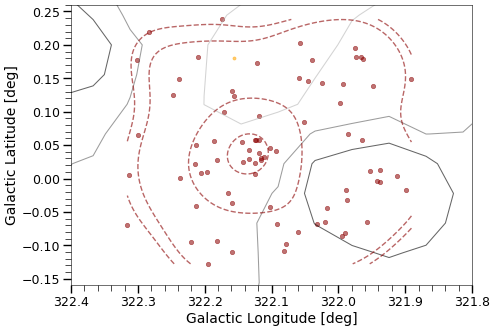

In [130]:
fig = plt.figure(figsize=(10,10), dpi=50)

ax = fig.add_subplot(111,aspect='equal')
ax.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg', lw=0.5)
ax.scatter(nirgc['GAL_LONG'], nirgc['GAL_LAT'], s=20, c='orange', label='NIRGC', alpha=0.55)
ax.scatter(dZ3['l_LONG'], dZ3['b_LAT'], s=40, c='darkred', label='Zang+21', alpha=0.55)
#ax.scatter(Z3['GAL_LONG'],Z3['GAL_LAT'],s=90,marker='X',facecolor='darkgreen',alpha=0.5,edgecolor='darkgreen',label='eRosita')
ax.set_xlabel('Galactic Longitude [deg]', fontsize=20)
ax.set_ylabel('Galactic Latitude [deg]', fontsize=20)
#plt.grid(True, alpha=0.5)
ax.set_xlim(322.4,321.8)
ax.set_ylim(-0.16,0.26)

##-------------------------------------------------- With contours --> eRosita
#levels = [0.10,0.15,0.50,0.90]
#Nx, Ny = 100, 100 # resolution of your density map, basically the pixel size
#_xmin=min(Z3['GAL_LONG'])
#_xmax=max(Z3['GAL_LONG'])
#_ymin=min(Z3['GAL_LAT'])
#_ymax=max(Z3['GAL_LAT'])
#
#xx, yy = np.meshgrid(np.linspace(_xmin, _xmax, Nx), np.linspace(_ymin, _ymax, Ny))
#Xgrid = np.vstack(map(np.ravel, [xx, yy])).T
#
#X = np.column_stack((Z3['GAL_LONG'], Z3['GAL_LAT']))
#kde1 = KernelDensity(**kde_params)
#log_dens1 = kde1.fit(X).score_samples(Xgrid)
#dens1 = X.shape[0]*np.exp(log_dens1).reshape((Ny, Nx))
#z = (dens1 - dens1.min())/(dens1.max() - dens1.min())
#
#plt.contour(xx,yy, z, levels=levels, colors='darkgreen', linewidths=1,linestyles='dashed', alpha=0.6)
#-------------------------------------------------- With contours --> Zhang21
levels = [0.10,0.15,0.50,0.90]
Nx, Ny = 100, 100 # resolution of your density map, basically the pixel size
_xmin=min(dZ3['l_LONG'])
_xmax=max(dZ3['l_LONG'])
_ymin=min(dZ3['b_LAT'])
_ymax=max(dZ3['b_LAT'])

xx, yy = np.meshgrid(np.linspace(_xmin, _xmax, Nx), np.linspace(_ymin, _ymax, Ny))
Xgrid = np.vstack(map(np.ravel, [xx, yy])).T

X = np.column_stack((dZ3['l_LONG'], dZ3['b_LAT']))
kde1 = KernelDensity(**kde_params)
log_dens1 = kde1.fit(X).score_samples(Xgrid)
dens1 = X.shape[0]*np.exp(log_dens1).reshape((Ny, Nx))
z = (dens1 - dens1.min())/(dens1.max() - dens1.min())

plt.contour(xx,yy, z, levels=levels, colors='darkred', linewidths=2,linestyles='dashed', alpha=0.6)
#--------------------------------------------------
#ax.text(0.05,0.9,r'$\mathrm{Z3}$', size=30, transform=ax.transAxes)
ax.minorticks_on()
ax.tick_params(which='major', size=12, labelsize=18, width=2)
ax.tick_params(which='minor', size=8, width=1)

plt.tight_layout()
#plt.savefig('Z3_map_zoom.jpg', bbox_inches='tight')

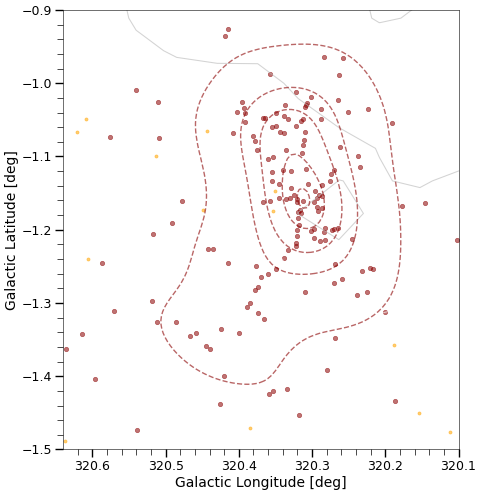

In [132]:
fig = plt.figure(figsize=(10,10), dpi=50)

ax = fig.add_subplot(111,aspect='equal')
ax.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg', lw=0.5)
ax.scatter(nirgc['GAL_LONG'], nirgc['GAL_LAT'], s=20, c='orange', label='NIRGC', alpha=0.55)
#ax.scatter(schroeder['GLON'], schroeder['GLAT'], s=20, c='blue', label='Schroeder+2019', alpha=0.55)
ax.scatter(dZ4['l_LONG'], dZ4['b_LAT'], s=40, c='darkred', label='Zang+21', alpha=0.55)
#ax.scatter(Z5['GAL_LONG'],Z5['GAL_LAT'],s=90,marker='X',facecolor='darkgreen',alpha=0.5,edgecolor='darkgreen',label='eRosita')
ax.set_xlabel('Galactic Longitude [deg]', fontsize=20)
ax.set_ylabel('Galactic Latitude [deg]', fontsize=20)
#plt.grid(True, alpha=0.5)
ax.set_xlim(320.64,320.1)
ax.set_ylim(-1.5,-0.9)

##-------------------------------------------------- With contours --> eRosita
#levels = [0.15,0.50,0.70,0.90,0.99]
#Nx, Ny = 100, 100 # resolution of your density map, basically the pixel size
#_xmin=min(Z4['GAL_LONG'])
#_xmax=max(Z4['GAL_LONG'])
#_ymin=min(Z4['GAL_LAT'])
#_ymax=max(Z4['GAL_LAT'])
#
#xx, yy = np.meshgrid(np.linspace(_xmin, _xmax, Nx), np.linspace(_ymin, _ymax, Ny))
#Xgrid = np.vstack(map(np.ravel, [xx, yy])).T
#
#X = np.column_stack((Z4['GAL_LONG'], Z4['GAL_LAT']))
#kde1 = KernelDensity(**kde_params)
#log_dens1 = kde1.fit(X).score_samples(Xgrid)
#dens1 = X.shape[0]*np.exp(log_dens1).reshape((Ny, Nx))
#z = (dens1 - dens1.min())/(dens1.max() - dens1.min())
#
#plt.contour(xx,yy, z, levels=levels, colors='darkgreen', linewidths=1,linestyles='dashed', alpha=0.6)
#-------------------------------------------------- With contours --> Zhang21
levels = [0.15,0.50,0.70,0.90,0.99]
Nx, Ny = 100, 100 # resolution of your density map, basically the pixel size
_xmin=min(dZ4['l_LONG'])
_xmax=max(dZ4['l_LONG'])
_ymin=min(dZ4['b_LAT'])
_ymax=max(dZ4['b_LAT'])

xx, yy = np.meshgrid(np.linspace(_xmin, _xmax, Nx), np.linspace(_ymin, _ymax, Ny))
Xgrid = np.vstack(map(np.ravel, [xx, yy])).T

X = np.column_stack((dZ4['l_LONG'], dZ4['b_LAT']))
kde1 = KernelDensity(**kde_params)
log_dens1 = kde1.fit(X).score_samples(Xgrid)
dens1 = X.shape[0]*np.exp(log_dens1).reshape((Ny, Nx))
z = (dens1 - dens1.min())/(dens1.max() - dens1.min())

plt.contour(xx,yy, z, levels=levels, colors='darkred', linewidths=2,linestyles='dashed', alpha=0.6)
#--------------------------------------------------
#ax.text(0.05,0.9,r'$\mathrm{Z4}$', size=30, transform=ax.transAxes)
ax.minorticks_on()
ax.tick_params(which='major', size=12, labelsize=18, width=2)
ax.tick_params(which='minor', size=8, width=1)

plt.tight_layout()
#plt.savefig('Z4_map_zoom.jpg', bbox_inches='tight')

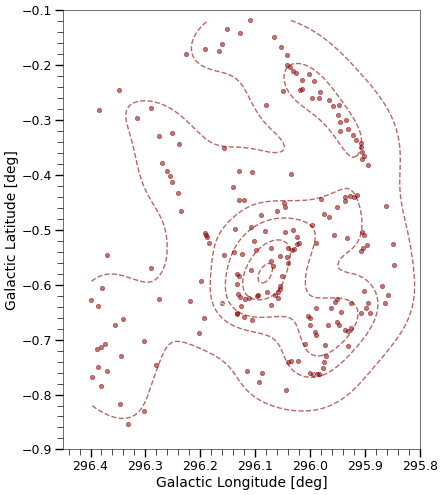

In [133]:
fig = plt.figure(figsize=(10,10), dpi=50)

ax = fig.add_subplot(111,aspect='equal')
ax.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg', lw=0.5)
ax.scatter(nirgc['GAL_LONG'], nirgc['GAL_LAT'], s=25, c='orange', label='NIRGC', alpha=0.55)
#ax.scatter(schroeder['GLON'], schroeder['GLAT'], s=20, c='blue', label='Schroeder+2019', alpha=0.55)
ax.scatter(dZ5['l_LONG'], dZ5['b_LAT'], s=40, c='darkred', label='Zang+21', alpha=0.55)
#ax.scatter(Z5['GAL_LONG'],Z5['GAL_LAT'],s=90,marker='X',facecolor='darkgreen',alpha=0.5,edgecolor='darkgreen',label='eRosita')
ax.set_xlabel('Galactic Longitude [deg]', fontsize=20)
ax.set_ylabel('Galactic Latitude [deg]', fontsize=20)
#plt.grid(True, alpha=0.5)
ax.set_xlim(296.45,295.8)
ax.set_ylim(-0.9,-0.1)

##-------------------------------------------------- With contours --> eRosita
#levels = [0.15,0.50,0.70,0.90,0.99]
#Nx, Ny = 100, 100 # resolution of your density map, basically the pixel size
#_xmin=min(Z5['GAL_LONG'])
#_xmax=max(Z5['GAL_LONG'])
#_ymin=min(Z5['GAL_LAT'])
#_ymax=max(Z5['GAL_LAT'])
#
#xx, yy = np.meshgrid(np.linspace(_xmin, _xmax, Nx), np.linspace(_ymin, _ymax, Ny))
#Xgrid = np.vstack(map(np.ravel, [xx, yy])).T
#
#X = np.column_stack((Z5['GAL_LONG'], Z5['GAL_LAT']))
#kde1 = KernelDensity(**kde_params)
#log_dens1 = kde1.fit(X).score_samples(Xgrid)
#dens1 = X.shape[0]*np.exp(log_dens1).reshape((Ny, Nx))
#z = (dens1 - dens1.min())/(dens1.max() - dens1.min())
#
#plt.contour(xx,yy, z, levels=levels, colors='darkgreen', linewidths=1,linestyles='dashed', alpha=0.6)
#-------------------------------------------------- With contours --> Zhang21
levels = [0.15,0.50,0.70,0.90,0.99]
Nx, Ny = 100, 100 # resolution of your density map, basically the pixel size
_xmin=min(dZ5['l_LONG'])
_xmax=max(dZ5['l_LONG'])
_ymin=min(dZ5['b_LAT'])
_ymax=max(dZ5['b_LAT'])

xx, yy = np.meshgrid(np.linspace(_xmin, _xmax, Nx), np.linspace(_ymin, _ymax, Ny))
Xgrid = np.vstack(map(np.ravel, [xx, yy])).T

X = np.column_stack((dZ5['l_LONG'], dZ5['b_LAT']))
kde1 = KernelDensity(**kde_params)
log_dens1 = kde1.fit(X).score_samples(Xgrid)
dens1 = X.shape[0]*np.exp(log_dens1).reshape((Ny, Nx))
z = (dens1 - dens1.min())/(dens1.max() - dens1.min())

plt.contour(xx,yy, z, levels=levels, colors='darkred', linewidths=2,linestyles='dashed', alpha=0.6)
#--------------------------------------------------
#ax.text(0.05,0.9,r'$\mathrm{Z5}$', size=30, transform=ax.transAxes)
ax.minorticks_on()
ax.tick_params(which='major', size=12, labelsize=18, width=2)
ax.tick_params(which='minor', size=8, width=1)

plt.tight_layout()
#plt.savefig('Z5_map_zoom.jpg', bbox_inches='tight')

### Some additional statistic

In [134]:
lst_to_change = ['sc_ra_1','sc_dec_1', 'Class_x_1','Px_1','Class_xo_1','Pxo_1','Class_xi_1','Pxi_1','Class_xio_1',
                 'Pxio_1','l_LONG_1','b_LAT_1']
lst_to_new = ['sc_ra','sc_dec', 'Class_x','Px','Class_xo','Pxo','Class_xi','Pxi','Class_xio','Pxio','l_LONG'
              ,'b_LAT']
lst_to_remove = ['sc_ra_2','sc_dec_2','Class_x_2','Px_2','Class_xo_2','Pxo_2','Class_xi_2','Pxi_2',
                 'Class_xio_2','Pxio_2','l_LONG_2','b_LAT_2']

In [135]:
zg_nan = Table(ZG_nan)
zg_non = Table(ZG_non)
zg_non.remove_column('l_LONG')
zg_non.remove_column('b_LAT')
for i in range(len(lst_to_change)):
    zg_non.remove_column(lst_to_remove[i])
    zg_non.rename_column(lst_to_change[i], lst_to_new[i])
    
len(dZ1) - (len(join(dZ1, zg_nan, keys=['srcid'])) + len(join(dZ1, zg_non, keys=['srcid'])))## Faltan las VVVdr2

NameError: name 'ZG_nan' is not defined

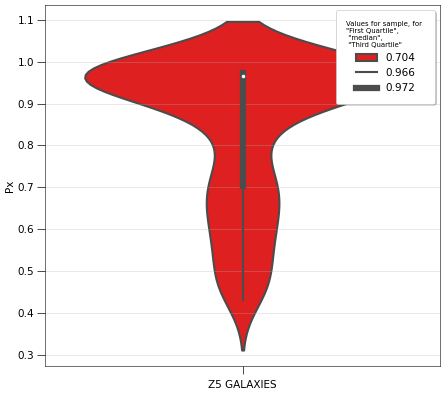

In [137]:
##### REPEAT FOR OTHER ZONES #####
_dZ1 = dZ1.to_pandas()
_dZ2 = dZ2.to_pandas()
_dZ3 = dZ3.to_pandas()
_dZ4 = dZ4.to_pandas()
_dZ5 = dZ5.to_pandas()
dz_25,dz_50,dz_75 = np.percentile(_dZ5['Px'], [25,50,75])

fig = plt.subplots(1,1, figsize=(9,8), dpi=50)
ax = sns.violinplot(y=_dZ5["Px"], width=0.8, linewidth=3,scale="count", color='red')

ax.tick_params(labelsize=13)
#ax.set_xlim(0.4, 1.6)
ax.set_ylabel('Px',fontsize=15)
ax.set_xlabel('Z5 GALAXIES', fontsize=15)
ax.grid(axis='y', alpha=0.5)
ax.legend((dz_25,dz_50,dz_75),title='Values for sample, for \n"First Quartile", \n "median",\n "Third Quartile"',
          fancybox=True, framealpha=1, shadow=True, borderpad=1, bbox_to_anchor=(1, 1),prop={"size":15})
ax.tick_params(size=12, labelsize=15, width=1)
plt.tight_layout()
#plt.savefig('Z5_violin_plot.jpg', bbox_inches='tight') ##
#plt.savefig('z21_violin_plot.png')

In [138]:
#### plots for 4 nirgc

print('nirgc 1:  {} {}'.format(nirgc_gal['GAL_LONG'][0], nirgc_gal['GAL_LAT'][0]))
print('nirgc 2:  {} {}'.format(nirgc_gal['GAL_LONG'][1], nirgc_gal['GAL_LAT'][1]))
print('nirgc 3:  {} {}'.format(nirgc_gal['GAL_LONG'][2], nirgc_gal['GAL_LAT'][2]))
print('nirgc 4:  {} {}'.format(nirgc_gal['GAL_LONG'][3], nirgc_gal['GAL_LAT'][3]))

NameError: name 'nirgc_gal' is not defined

In [139]:
disc_gal = join(disc, xmm, keys=['srcid'])

#### 2MASS REDSHIFT SURVAY (Huchra et al. 2005?)

In [145]:
def redshift(V):
    clight = (Cons.c).to(u.km/u.s)
    v = V.to(u.km/u.s)
    z = (v / clight)
    return z

In [146]:
mrs = Table.read('nilo/2mrs_1175_done.fits', format='fits')
print(len(mrs))

43533


In [147]:
mrs['z'] = redshift(mrs['V'])

s1 = mrs[mrs['z']<=0.01]
s2 = mrs[mrs['z']>0.01]
s2 = s2[s2['z']<=0.02]

s3 = mrs[mrs['z']>0.02]
s3 = s3[s3['z']<=0.03]
s4 = mrs[mrs['z']>0.03]
s4 = s4[s4['z']<=0.04]

s5 = mrs[mrs['z']>0.04]
s5 = s5[s5['z']<=0.05]
s6 = mrs[mrs['z']>0.05]
s6 = s6[s6['z']<=0.06]

s7 = mrs[mrs['z']>0.06]
s7 = s7[s7['z']<=0.07]
s8 = mrs[mrs['z']>0.07]


print(len(mrs))
print(len(s1)+len(s2)+len(s3)+len(s4)+len(s5)+len(s6)+len(s7)+len(s8))

43533
43533


In [149]:
HIZOA = Table.read('HIZOA_gals.fit', format='fits')
B2mass_x = Table.read('B2massX_gals.fit', format='fits')
CIZA = Table.read('CIZA_catalog.fit', format='fits')
CIZA2 = Table.read('CIZA_2007.fit',format='fits')



disc['GLON'] = disc['l_LONG']/u.deg
disc['GLAT'] = disc['b_LAT']/u.deg

#gal = SkyCoord(mrs['GLON'], mrs['GLAT'], frame='galactic', unit=u.deg)
gal_s1 = SkyCoord(s1['GLON'], s1['GLAT'], frame='galactic', unit=u.deg)
gal_s2 = SkyCoord(s2['GLON'], s2['GLAT'], frame='galactic', unit=u.deg)
gal_s3 = SkyCoord(s3['GLON'], s3['GLAT'], frame='galactic', unit=u.deg)
gal_s4 = SkyCoord(s4['GLON'], s4['GLAT'], frame='galactic', unit=u.deg)
gal_s5 = SkyCoord(s5['GLON'], s5['GLAT'], frame='galactic', unit=u.deg)
gal_s6 = SkyCoord(s6['GLON'], s6['GLAT'], frame='galactic', unit=u.deg)
gal_s7 = SkyCoord(s7['GLON'], s7['GLAT'], frame='galactic', unit=u.deg)
gal_s8 = SkyCoord(s8['GLON'], s8['GLAT'], frame='galactic', unit=u.deg)

_disc_ = SkyCoord(disc['GLON'], disc['GLAT'], frame='galactic', unit=u.deg)
_nirgc_ = SkyCoord(nirgc['GAL_LONG'], nirgc['GAL_LAT'], frame='galactic', unit=u.deg)
ciza_ = SkyCoord(CIZA['GLON'], CIZA['GLAT'], frame='galactic', unit=u.deg)
ciza_2 = SkyCoord(CIZA2['GLON'], CIZA2['GLAT'], frame='galactic', unit=u.deg)
sc = SkyCoord(schroeder['GLON'], schroeder['GLAT'], frame='galactic', unit=u.deg)

([<matplotlib.axis.XTick at 0x7f0b0dfa5bd0>,
 [Text(-2.6179938779914944, 0, '150°'),
  Text(-2.0943951023931953, 0, '120°'),
  Text(-1.5707963267948966, 0, '90°'),
  Text(-1.0471975511965976, 0, '60°'),
  Text(-0.5235987755982988, 0, '30°'),
  Text(0.0, 0, '0°'),
  Text(0.5235987755982988, 0, '330°'),
  Text(1.0471975511965976, 0, '300°'),
  Text(1.5707963267948966, 0, '270°'),
  Text(2.0943951023931953, 0, '240°'),
  Text(2.6179938779914944, 0, '210°')])

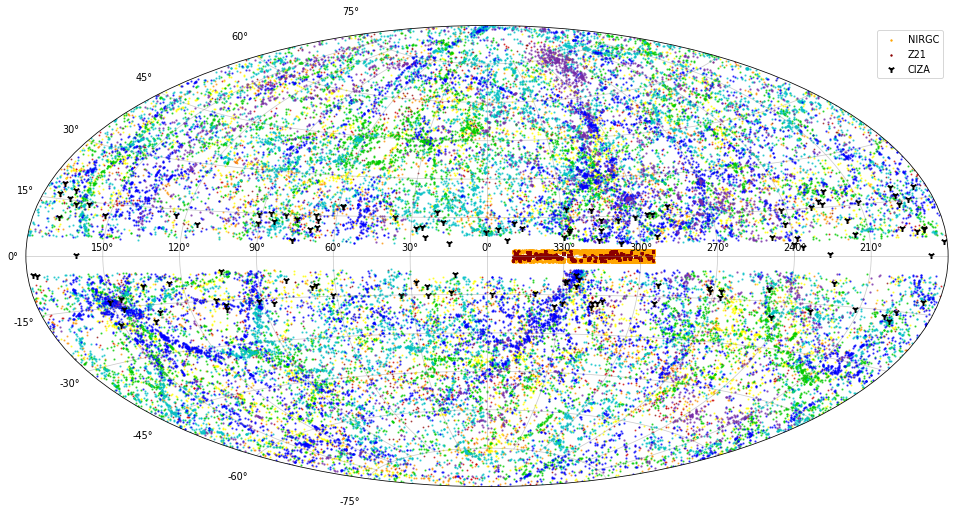

In [150]:
plt.figure(figsize=(17,10), dpi=70)
plt.subplot(111, projection='aitoff')
plt.grid(color='gray', linestyle='-', alpha=0.4)

#plt.scatter(-sc.l.wrap_at('180d').radian, sc.b.radian, s=1, color='crimson', alpha=0.25, label='Schröder+2019')

plt.scatter(-gal_s8.l.wrap_at('180d').radian, gal_s8.b.radian, s=1, color='darkred', alpha=0.6)
plt.scatter(-gal_s7.l.wrap_at('180d').radian, gal_s7.b.radian, s=1.2, color='#cc0001', alpha=0.6)
plt.scatter(-gal_s6.l.wrap_at('180d').radian, gal_s6.b.radian, s=1.4, color='#fb940b', alpha=0.6)
plt.scatter(-gal_s5.l.wrap_at('180d').radian, gal_s5.b.radian, s=1.5, color='#ffff01', alpha=0.6)
plt.scatter(-gal_s4.l.wrap_at('180d').radian, gal_s4.b.radian, s=1.6, color='#01cc00', alpha=0.6)
plt.scatter(-gal_s3.l.wrap_at('180d').radian, gal_s3.b.radian, s=1.7, color='#03c0c6', alpha=0.6)
plt.scatter(-gal_s2.l.wrap_at('180d').radian, gal_s2.b.radian, s=1.8, color='#0000fe', alpha=0.6)
plt.scatter(-gal_s1.l.wrap_at('180d').radian, gal_s1.b.radian, s=2.0, color='#762ca7', alpha=0.6)
#-
plt.scatter(-_nirgc_.l.wrap_at('180d').radian, _nirgc_.b.radian, s=2, color='orange', label='NIRGC')
plt.scatter(-_disc_.l.wrap_at('180d').radian, _disc_.b.radian, s=2, color='darkred', label='Z21')
plt.scatter(-ciza_.l.wrap_at('180d').radian, ciza_.b.radian, s=50, color='black', linewidth=2, marker='1', label='CIZA')
plt.scatter(-ciza_2.l.wrap_at('180d').radian, ciza_2.b.radian, s=50, color='black', linewidth=2, marker='1')

plt.legend()
# Essential thing is to rename RA axis ticks to transform them to conventional format
plt.xticks(ticks=np.radians([-150, -120, -90, -60, -30, 0, \
                             30, 60, 90, 120, 150]),
           labels=['150°', '120°', '90°', '60°', '30°', '0°', \
                   '330°', '300°', '270°', '240°', '210°'])
#plt.savefig('aitoff_2mass.jpg', bbox_inches='tight')

In [151]:
s1_ = s1[s1['GLAT']>-20]
s1_ = s1_[s1_['GLAT']<20]
s1_ = s1_[s1_['GLON']>290]
s1_ = s1_[s1_['GLON']<350]

s2_ = s2[s2['GLAT']>-20]
s2_ = s2_[s2_['GLAT']<20]
s2_ = s2_[s2_['GLON']>290]
s2_ = s2_[s2_['GLON']<350]

s3_ = s3[s3['GLAT']>-20]
s3_ = s3_[s3_['GLAT']<20]
s3_ = s3_[s3_['GLON']>290]
s3_ = s3_[s3_['GLON']<350]

s4_ = s4[s4['GLAT']>-20]
s4_ = s4_[s4_['GLAT']<20]
s4_ = s4_[s4_['GLON']>290]
s4_ = s4_[s4_['GLON']<350]

s5_ = s5[s5['GLAT']>-20]
s5_ = s5_[s5_['GLAT']<20]
s5_ = s5_[s5_['GLON']>290]
s5_ = s5_[s5_['GLON']<350]

s6_ = s6[s6['GLAT']>-20]
s6_ = s6_[s6_['GLAT']<20]
s6_ = s6_[s6_['GLON']>290]
s6_ = s6_[s6_['GLON']<350]

s7_ = s7[s7['GLAT']>-20]
s7_ = s7_[s7_['GLAT']<20]
s7_ = s7_[s7_['GLON']>290]
s7_ = s7_[s7_['GLON']<350]

s8_ = s8[s8['GLAT']>-20]
s8_ = s8_[s8_['GLAT']<20]
s8_ = s8_[s8_['GLON']>290]
s8_ = s8_[s8_['GLON']<350]

In [155]:
tmass = mrs[mrs['GLAT']>-20]
tmass = mrs[mrs['GLAT']<20]
tmass = mrs[mrs['GLON']>290]
tmass = mrs[mrs['GLON']<350]

hizoa = HIZOA[HIZOA['GLAT']>-20]
hizoa = hizoa[hizoa['GLAT']<20]
hizoa = hizoa[hizoa['GLON']>290]
hizoa = hizoa[hizoa['GLON']<350]

ciza = CIZA[CIZA['GLAT']>-20]
ciza = ciza[ciza['GLAT']<20]
ciza = ciza[ciza['GLON']>290]
ciza = ciza[ciza['GLON']<350]

ciza2 = CIZA2[CIZA2['GLAT']>-20]
ciza2 = ciza2[ciza2['GLAT']<20]
ciza2 = ciza2[ciza2['GLON']>290]
ciza2 = ciza2[ciza2['GLON']<350]

b2m = B2mass_x[B2mass_x['GLAT']>-20]
b2m = b2m[b2m['GLAT']<20]
b2m = b2m[b2m['GLON']>290]
b2m = b2m[b2m['GLON']<350]

In [153]:
c_ara = SkyCoord('16 53 02.4', '−59 42 59', unit=(u.hourangle, u.deg))
gal_ara = galactic(c_ara.ra.degree, c_ara.dec.degree)

c_tri = SkyCoord('16 38 18.2', '−64 21 37', unit=(u.hourangle, u.deg))
gal_tri = galactic(c_tri.ra.degree, c_tri.dec.degree)

c_ssc = SkyCoord('13 27 57.5', '−31 30 09', unit=(u.hourangle, u.deg))
gal_ssc = galactic(c_ssc.ra.degree, c_ssc.dec.degree)


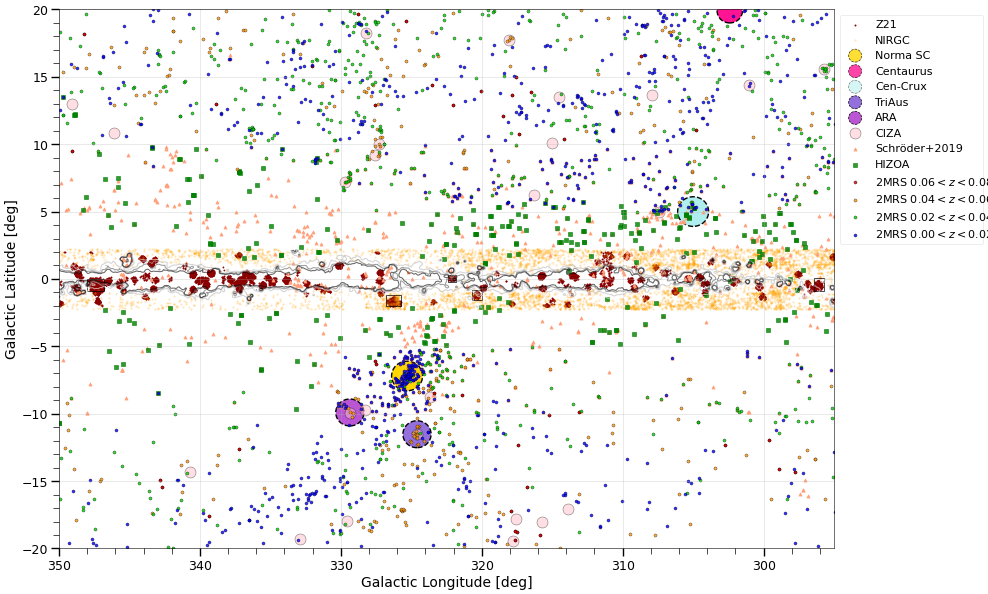

In [161]:
fig = plt.figure(figsize=(20,14), dpi=50)
ax = fig.add_subplot(111)

ax.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg')

ax.scatter(disc['l_LONG'], disc['b_LAT'], s=3, c='darkred', label='Z21')
ax.scatter(nirgc['GAL_LONG'], nirgc['GAL_LAT'], s=5, c='orange', alpha=0.2, label='NIRGC')

#Clusters big
ax.scatter(325.3, -7.2, s=350, marker='o', fc='gold', ec='black', linestyle='--', alpha=0.8, label='Norma SC') 
ax.scatter(302.4, 19.9, s=350, marker='o', fc='deeppink', ec='black', linestyle='--', alpha=0.8, label='Centaurus')#not in view
ax.scatter(305, 5, s=350, marker='o', fc='paleturquoise', ec='black',linestyle='--', alpha=0.5,label='Cen-Crux')
ax.scatter(gal_tri[0],gal_tri[1],s=350, marker='o', fc='mediumpurple',ec= 'black', ls='--', label='TriAus')
ax.scatter(gal_ara[0],gal_ara[1],s=350, marker='o', fc='mediumorchid',ec= 'black', ls='--', label='ARA')


ax.add_patch(Circle((325.3, -7.2), 1.1, edgecolor='black', facecolor='gold', linestyle='--', linewidth=2)) #Norma
ax.add_patch(Circle((302.4, 19.9), 0.9, edgecolor='black', facecolor='deeppink', linestyle='--', linewidth=2))#Cen
ax.add_patch(Circle((305, 5), 1.1, edgecolor='black', facecolor='paleturquoise', linestyle='--', linewidth=2))#Cen
ax.add_patch(Circle((gal_tri[0].value,gal_tri[1].value), 1, edgecolor='black', facecolor='mediumpurple', linestyle='--', linewidth=2))#TriAus
ax.add_patch(Circle((gal_ara[0].value,gal_ara[1].value), 1, edgecolor='black', facecolor='mediumorchid', linestyle='--', linewidth=2))#ARA

ax.scatter(ciza['GLON'], ciza['GLAT'], s=250, fc='pink', ec='black', lw=0.8, marker='o', alpha=0.5) #CIZA1
ax.scatter(ciza2['GLON'], ciza2['GLAT'], s=250, fc='pink', ec='black',lw=0.8,marker='o', alpha=0.5, label='CIZA') #CIZA2

#------------
ax.scatter(schroeder['GLON'], schroeder['GLAT'], s=20, c='lightsalmon', marker='^', label='Schröder+2019')
##ax.scatter(tmass['GLON'], tmass['GLAT'], s=10, c='darkslateblue', alpha=0.8, label='2MRS')
ax.scatter(hizoa['GLON'], hizoa['GLAT'], s=40, c='green', marker='s', alpha=0.8, label='HIZOA')

#ax.scatter(s8_['GLON'], s8_['GLAT'], s=20, marker='o', c='darkred', ec='black', lw=0.5,alpha=0.8, label=r'2MRS 0.07$<z<$0.08')
#ax.scatter(s8_['GLON'], s8_['GLAT'], s=20, marker='o', c='#cc0001', ec='black', lw=0.5,alpha=0.8, label=r'2MRS 0.06$<z<$0.07')
#ax.scatter(s6_['GLON'], s6_['GLAT'], s=20, marker='o', c='#fb940b', ec='black', lw=0.5,alpha=0.8, label=r'2MRS 0.05$<z<$0.06')
#ax.scatter(s5_['GLON'], s5_['GLAT'], s=20, marker='o', c='#ffff01', ec='black', lw=0.5,alpha=0.8, label=r'2MRS 0.04$<z<$0.05')
#ax.scatter(s4_['GLON'], s4_['GLAT'], s=20, marker='o', c='#01cc00', ec='black', lw=0.5,alpha=0.8, label=r'2MRS 0.03$<z<$0.04')
#ax.scatter(s3_['GLON'], s3_['GLAT'], s=20, marker='o', c='#03c0c6', ec='black', lw=0.5,alpha=0.8, label=r'2MRS 0.02$<z<$0.03')
#ax.scatter(s2_['GLON'], s2_['GLAT'], s=20, marker='o', c='#0000fe', ec='black', lw=0.5,alpha=0.8, label=r'2MRS 0.01$<z<$0.02')
#ax.scatter(s1_['GLON'], s1_['GLAT'], s=20, marker='o', c='#762ca7', ec='black', lw=0.5,alpha=0.8, label=r'2MRS 0.00$<z<$0.01')

ax.scatter(s8_['GLON'], s8_['GLAT'], s=20, marker='o', c='#cc0001', ec='black', lw=0.5,alpha=0.8, label=r'2MRS 0.06$<z<$0.08')
ax.scatter(s8_['GLON'], s8_['GLAT'], s=20, marker='o', c='#cc0001', ec='black', lw=0.5,alpha=0.8)
ax.scatter(s6_['GLON'], s6_['GLAT'], s=20, marker='o', c='#fb940b', ec='black', lw=0.5,alpha=0.8, label=r'2MRS 0.04$<z<$0.06')
ax.scatter(s5_['GLON'], s5_['GLAT'], s=20, marker='o', c='#fb940b', ec='black', lw=0.5,alpha=0.8)
ax.scatter(s4_['GLON'], s4_['GLAT'], s=20, marker='o', c='#01cc00', ec='black', lw=0.5,alpha=0.8, label=r'2MRS 0.02$<z<$0.04')
ax.scatter(s3_['GLON'], s3_['GLAT'], s=20, marker='o', c='#01cc00', ec='black', lw=0.5,alpha=0.8)
ax.scatter(s2_['GLON'], s2_['GLAT'], s=20, marker='o', c='#0000fe', ec='black', lw=0.5,alpha=0.8, label=r'2MRS 0.00$<z<$0.02')
ax.scatter(s1_['GLON'], s1_['GLAT'], s=20, marker='o', c='#0000fe', ec='black', lw=0.5,alpha=0.8)


ax.set_xlabel('Galactic Longitude [deg]', fontsize=20)
ax.set_ylabel('Galactic Latitude [deg]', fontsize=20)
plt.grid(True, alpha=0.5)
ax.set_xlim(350,295)
ax.set_ylim(-20,20)

ax.add_patch(Rectangle((346.8, -0.9), 1.2, 0.9, edgecolor = 'black', facecolor = 'none', fill=False,lw=1))  #Z1
ax.add_patch(Rectangle((325.7, -2), 1.1, 0.8, edgecolor = 'black', facecolor = 'none', fill=False,lw=1))    #Z2
ax.add_patch(Rectangle((321.8, -0.24), 0.6, 0.5, edgecolor = 'black', facecolor = 'none', fill=False,lw=1)) #Z3
ax.add_patch(Rectangle((320.0, -1.55), 0.7, 0.7, edgecolor = 'black', facecolor = 'none', fill=False,lw=1)) #Z4
ax.add_patch(Rectangle((295.7, -0.9), 0.7, 1, edgecolor = 'black', facecolor = 'none', fill=False,lw=1))    #Z5

#plt.legend( bbox_to_anchor=(0,0.68,1,0.4),loc='upper center', mode='expand', framealpha=0.5, prop={"size":14},fancybox=True,ncol=7) #ncol=9 max
plt.legend( bbox_to_anchor=(1,0,0.2,1),loc='upper center', mode='expand', framealpha=0.5, prop={"size":16},fancybox=True,ncol=1) #ncol=9 max

ax.minorticks_on()
ax.tick_params(which='major', size=12, labelsize=18, width=2)
ax.tick_params(which='minor', size=8, width=1)

#plt.savefig('map_2mrs.jpg', bbox_inches='tight')

In [158]:
hizoa_ = hizoa[hizoa['GLAT']>-20]
hizoa_ = hizoa_[hizoa_['GLAT']<20]
hizoa_ = hizoa_[hizoa_['GLON']>290]
hizoa_ = hizoa_[hizoa_['GLON']<350]

schr1 = schroeder[schroeder['GLAT']>-20]
schr1 = schr1[schr1['GLAT']<-2]
schr1 = schr1[schr1['GLON']>290]
schr1 = schr1[schr1['GLON']<350]

schr2 = schroeder[schroeder['GLAT']>2]
schr2 = schr2[schr2['GLAT']<20]
schr2 = schr2[schr2['GLON']>290]
schr2 = schr2[schr2['GLON']<350]

tmrs = vstack([s1_, s2_, s3_])
schr = vstack([schr1, schr2])

nir_1 = Table([tmrs['GLON'], tmrs['GLAT']])
nir_2 = Table([schr['GLON'], schr['GLAT']])

nir = vstack([nir_1, nir_2])

schr_ = schroeder.to_pandas()
nir_ = nir.to_pandas()
tmrs_ = tmrs.to_pandas()
hizoa__ = hizoa_.to_pandas()

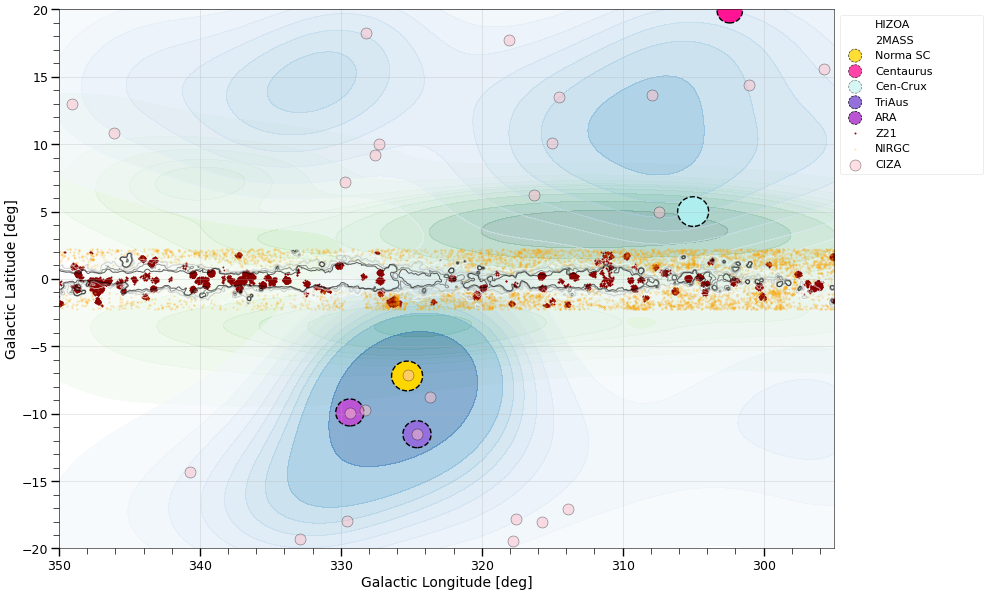

In [162]:
# Create a joint KDE plot
fig = plt.figure(figsize=(20, 14), dpi=50)

#sns.kdeplot(data=nir_, x='GLON', y='GLAT', fill=True,alpha=0.5)
#sns.kdeplot(data=schr_, x='GLON', y='GLAT', fill=True,alpha=0.5)
sns.kdeplot(data=hizoa__, x='GLON', y='GLAT', fill=True, cmap='Greens', alpha=0.5, label='HIZOA')
sns.kdeplot(data=tmrs_, x='GLON', y='GLAT', fill=True, cmap='Blues', alpha=0.5, label='2MASS')


#Clusters big
plt.scatter(325.3, -7.2, s=350, marker='o', fc='gold', ec='black', linestyle='--', alpha=0.8, label='Norma SC') 
plt.scatter(302.4, 19.9, s=350, marker='o', fc='deeppink', ec='black', linestyle='--', alpha=0.8, label='Centaurus')#not in view
plt.scatter(305, 5, s=350, marker='o', fc='paleturquoise', ec='black',linestyle='--', alpha=0.5,label='Cen-Crux')
plt.scatter(gal_tri[0],gal_tri[1],s=350, marker='o', fc='mediumpurple',ec= 'black', ls='--', label='TriAus')
plt.scatter(gal_ara[0],gal_ara[1],s=350, marker='o', fc='mediumorchid',ec= 'black', ls='--', label='ARA')

ax = plt.gca()
ax.add_patch(Circle((325.3, -7.2), 1.1, edgecolor='black', facecolor='gold', linestyle='--', linewidth=2)) #Norma
ax.add_patch(Circle((302.4, 19.9), 0.9, edgecolor='black', facecolor='deeppink', linestyle='--', linewidth=2))#Cen
ax.add_patch(Circle((305, 5), 1.1, edgecolor='black', facecolor='paleturquoise', linestyle='--', linewidth=2))#Cen
ax.add_patch(Circle((gal_tri[0].value,gal_tri[1].value), 1, edgecolor='black', facecolor='mediumpurple', linestyle='--', linewidth=2))#TriAus
ax.add_patch(Circle((gal_ara[0].value,gal_ara[1].value), 1, edgecolor='black', facecolor='mediumorchid', linestyle='--', linewidth=2))#ARA


# Scatter plots as before
plt.contour(dust['xi'], dust['yi'], dust['zi'], levels=[11, 15, 20, 25], origin='lower', alpha=0.6, cmap='gist_yarg')
plt.scatter(disc['l_LONG'], disc['b_LAT'], s=3, c='darkred', label='Z21')
plt.scatter(nirgc['GAL_LONG'], nirgc['GAL_LAT'], s=5, c='orange', alpha=0.2, label='NIRGC')

ax.scatter(ciza['GLON'], ciza['GLAT'], s=250, fc='pink', ec='black', lw=0.8, marker='o', alpha=0.5) #CIZA1
ax.scatter(ciza2['GLON'], ciza2['GLAT'], s=250, fc='pink', ec='black',lw=0.8,marker='o', alpha=0.5, label='CIZA') #CIZA2


plt.xlabel('Galactic Longitude [deg]', fontsize=20)
plt.ylabel('Galactic Latitude [deg]', fontsize=20)
plt.grid(True, alpha=0.5)
plt.xlim(350, 295)
plt.ylim(-20, 20)
plt.legend(bbox_to_anchor=(1, 0, 0.2, 1), loc='upper center', mode='expand', framealpha=0.5, prop={"size": 16}, fancybox=True, ncol=1)
plt.minorticks_on()
plt.tick_params(which='major', size=12, labelsize=18, width=2)
plt.tick_params(which='minor', size=8, width=1)

#### SNR chandra

In [164]:
#Read tables from HTML file
tables = pd.read_html('snrcat_gal.html')

SNR_cat = Table.read('SNR_2020.fit', format='fits')

In [165]:
from matplotlib.patches import ConnectionPatch

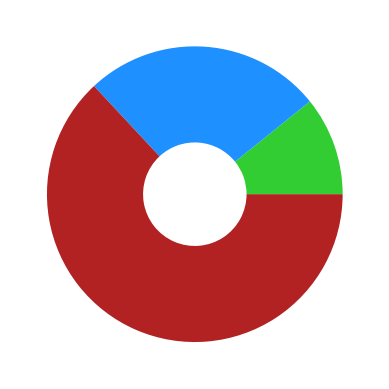

In [166]:
lbls = ['', '', '']
sizes = [1666, 4031, 9726]
colors_ = ['limegreen', 'dodgerblue', 'firebrick']
explode_ = [0,0,0.1]
width = 0.65
wedge_properties = {"width":width}

fig1, ax = plt.subplots()
ax.pie(sizes, labels=lbls, colors=colors_, wedgeprops=wedge_properties)

plt.savefig('pie_chart_1.png', bbox_inches='tight', transparent=True)

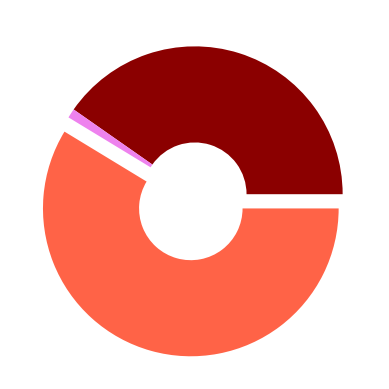

In [168]:
lbls = ['', '', '']
sizes = [3957, 100, 5765]
colors_ = ['darkred','violet', 'tomato']
explode_ = [0, 0, 0.1]
width = 0.65
wedge_properties = {"width":width}

fig1, ax = plt.subplots()
ax.pie(sizes, labels=lbls, colors=colors_, wedgeprops=wedge_properties, explode=explode_, shadow=False)

plt.savefig('pie_chart_22.png', bbox_inches='tight', transparent=True)

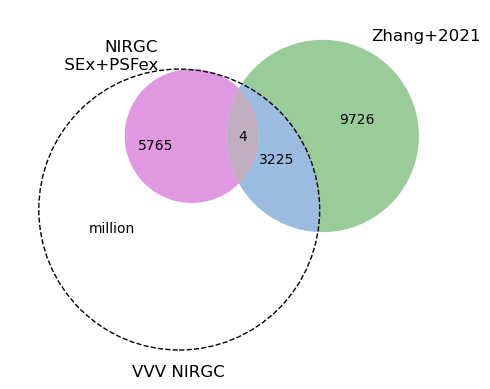

In [167]:
from matplotlib_venn import venn3_unweighted
from matplotlib_venn import venn3_circles

subsets = (0, 9_726, 0, 20_000, 5_765, 3_225, 4)
tuned_subsets = list(subsets)
tuned_subsets[6] += 1_000
v = venn3_unweighted(subsets, subset_areas=tuned_subsets, set_labels=('NIRGC\n SEx+PSFex','Zhang+2021','VVV NIRGC'))

#Ajustes visuales
v.get_patch_by_id('001').set_alpha(1.0)
v.get_patch_by_id('001').set_color('white')
v.get_label_by_id('001').set_text('million')

v.get_label_by_id('010').set_label('')

c = venn3_circles(subsets=subsets, linestyle='solid', linewidth=1, color='black')
c[0].set_linestyle('none')
c[1].set_linestyle('none')
c[2].set_linestyle('dashed')
c[2].set_linewidth(1)


plt.savefig('Venn_cross.png', bbox_inches='tight', transparent=True)

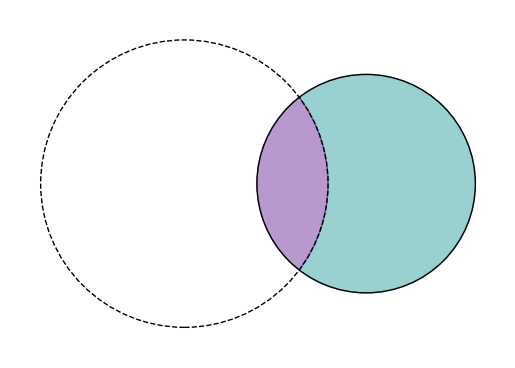

In [169]:
from matplotlib_venn import venn2, venn2_unweighted
from matplotlib_venn import venn2_circles

subsets = (30_000, 15_423, 4_521)
tuned_subsets = list(subsets)
#tuned_subsets[6] += 1_000
v = venn2(subsets, set_labels=('',''))

#Ajustes visuales
v.get_patch_by_id('10').set_alpha(1.0)
v.get_patch_by_id('10').set_color('white')
v.get_label_by_id('10').set_text('')
v.get_label_by_id('01').set_text('')
v.get_patch_by_id('01').set_color('darkcyan')
v.get_label_by_id('11').set_text('')
v.get_patch_by_id('11').set_color('indigo')


c = venn2_circles(subsets=subsets, linestyle='solid', linewidth=1, color='black')
c[0].set_linestyle('dashed')
#c[2].set_linewidth(1)

plt.savefig('Venn_cross.png', bbox_inches='tight', transparent=True)

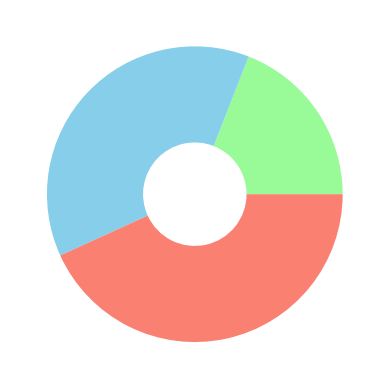

In [170]:
lbls = ['', '', '']
sizes = [862, 1_706, 1_953]
colors_ = ['palegreen', 'skyblue', 'salmon']
explode_ = [0,0,0.1]
width = 0.65
wedge_properties = {"width":width}

fig1, ax = plt.subplots()
ax.pie(sizes, labels=lbls, colors=colors_, wedgeprops=wedge_properties)

plt.savefig('pie_gaia_1.png', bbox_inches='tight', transparent=True)

#### -----------

In [172]:
gal_5 = 200921401010001

nirgc_id = df['ID'][df['ID_SEARCH']==gal_5]
df[df['ID_SEARCH']==gal_5]

,ID_SEARCH,RA_SEARCH,DEC_SEARCH,DISTANCE,CATALOGUE,TILE,ID,ALPHA_J2000,DELTA_J2000,MAG_PSF,...,CLASS_STAR,MAG_APER_H,MAG_PSF_H,MAG_APER_J,MAG_PSF_J,EXTENDED,A_v,A_Ks,l_LONG,b_LAT
389,200921401010001,206.900193,-60.617668,0.447859,d125_all.fits,d125,VVV-J134735.99-603703.8,206.899979,-60.617735,12.493923,...,0.739311,13.090343,13.348232,14.519726,14.508986,0.0,7.694076,0.907901,309.770633,1.506201


In [173]:
nirgc[nirgc['ID']=='VVV-J134735.99-603703.8']

ID,RA2000,DEC2000,GAL_LONG,GAL_LAT,A_Ks,MAG_AUTO_J,MAG_AUTO_H,MAG_AUTO_Ks,MAG_APER_J,MAG_APER_H,MAG_APER_Ks,R,C,ELLIPTICITY,n,WISE
str23,str11,str11,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64


In [174]:
gaia_gals = Table.read('gdr3_galaxies.fits', format='fits')
gaia_qso = Table.read('gdr3_qso.fits', format='fits')
gaia_qso_c = Table.read('gdr3_qso_cat.fits', format='fits')

In [175]:
col_names=['_Glon','_Glat','Gaia','RAJ2000','e_RAJ2000','DEJ2000','e_DEJ2000','Gmag','WISEA','W1mag','W2mag'
           ,'W3mag','zsp','e_pmRA','e_pmDE','S15']
gw = Table.read('gw_ex.csv', format='csv', names=col_names)
#gw = gw[2:]

disc_gw = gw[gw['_Glon']>295]
disc_gw = disc_gw[disc_gw['_Glon']<350]
disc_gw = disc_gw[disc_gw['_Glat']<2]
disc_gw = disc_gw[disc_gw['_Glat']>-2]

print('Total objetos en el disco del VVV: ',+len(disc_gw))

Total objetos en el disco del VVV:  131


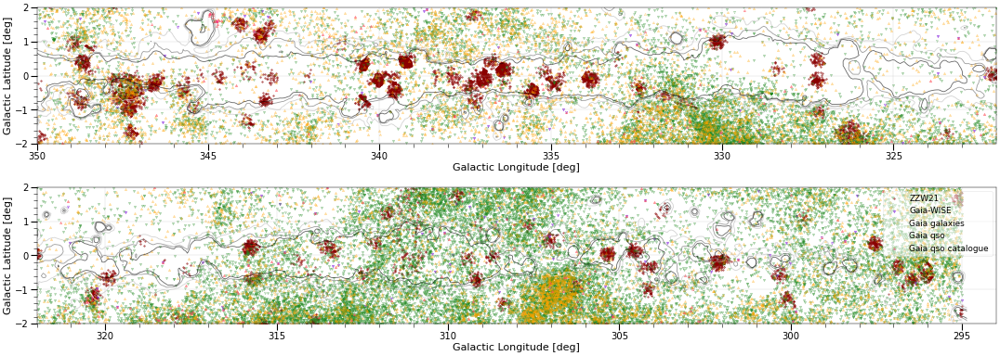

In [178]:
fig = plt.figure(figsize=(27,10), dpi=40)
ax = fig.add_subplot(211,aspect='equal')
ax.scatter(disc['l_LONG'], disc['b_LAT'], s=9, c='darkred', label='ZZW21', alpha=0.55)
ax.scatter(disc_gw['_Glon'], disc_gw['_Glat'], s=22, c='blueviolet', marker='v', alpha=0.6, label='Gaia-WISE')
ax.scatter(gaia_gals['l'], gaia_gals['b'], s=20, c='forestgreen', marker='v', alpha=0.3, label='Gaia galaxies')
ax.scatter(gaia_qso['l'], gaia_qso['b'], s=20, c='orange', marker='^', alpha=0.3, label='Gaia qso')
ax.scatter(gaia_qso_c['l'], gaia_qso_c['b'], s=20, c='deeppink', marker='^', alpha=0.3, label='Gaia qso catalogue')
ax.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg')

ax.set_xlabel('Galactic Longitude [deg]', fontsize=20)
ax.set_ylabel('Galactic Latitude [deg]', fontsize=20)
plt.grid(True, alpha=0.5)
ax.set_xlim(350,322)
ax.set_ylim(-2,2)
ax.minorticks_on()
ax.tick_params(which='major', size=12, labelsize=18, width=2)
ax.tick_params(which='minor', size=8, width=1)
#ax.tick_params(labelsize=15, width=3)

ax = fig.add_subplot(212,aspect='equal')
ax.scatter(disc['l_LONG'], disc['b_LAT'], s=9, c='darkred', label='ZZW21', alpha=0.55)
ax.scatter(disc_gw['_Glon'], disc_gw['_Glat'], s=22, c='blueviolet', marker='v', alpha=0.6, label='Gaia-WISE')
ax.scatter(gaia_gals['l'], gaia_gals['b'], s=20, c='forestgreen', marker='v', alpha=0.3, label='Gaia galaxies')
ax.scatter(gaia_qso['l'], gaia_qso['b'], s=20, c='orange', marker='^', alpha=0.3, label='Gaia qso')
ax.scatter(gaia_qso_c['l'], gaia_qso_c['b'], s=20, c='deeppink', marker='^', alpha=0.3, label='Gaia qso catalogue')
ax.contour(dust['xi'], dust['yi'], dust['zi'],levels=[11,15,20,25],origin='lower',alpha=0.6,cmap='gist_yarg')

ax.set_xlabel('Galactic Longitude [deg]', fontsize=20)
ax.set_ylabel('Galactic Latitude [deg]', fontsize=20)
plt.grid(True, alpha=0.5)
ax.set_xlim(322,294)
ax.set_ylim(-2,2)

ax.minorticks_on()
ax.tick_params(which='major', size=12, labelsize=18, width=2)
ax.tick_params(which='minor', size=8, width=1)
plt.legend(loc=1, framealpha=0.5, prop={"size":16})

plt.tight_layout()
#plt.savefig('map_gw.jpg')
#plt.savefig('map.png')
#plt.savefig('map.pdf')